In [1]:
%matplotlib inline

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.sparse as sp
import scanpy as sc
from starcat import starCAT
from scipy.stats import ttest_ind, fisher_exact, ranksums, wilcoxon
import sys
from statsmodels.stats.multitest import fdrcorrection
import statsmodels.api as sm
from statsmodels.discrete.discrete_model import Logit
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist
from sklearn.preprocessing import StandardScaler

import requests
import openpyxl
import pandas as pd
import numpy as np
from io import BytesIO
from cnmf import cNMF
import scanpy as sc
from scipy.stats import ttest_rel
from sklearn.neighbors import NearestNeighbors
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Rectangle
import joblib


sys.path.append('../../../Code')
from utils import read_dataset_log
from matplotlib import rcParams

rcParams['pdf.fonttype'] = 42
rcParams['ps.fonttype'] = 42
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Arial']

In [2]:
! mkdir -p ../../../Figures/Components/Revision

In [2]:
figdir = '../../../Figures/Components/Revision'

outdir = '../../../Data/Revision/Melanoma_Clinical_GSE120575'

# Normalization

In [2]:
adata = sc.read('../../../Data/Revision/Melanoma_Clinical_GSE120575/GSE120575_melanoma_scRNA.h5ad')

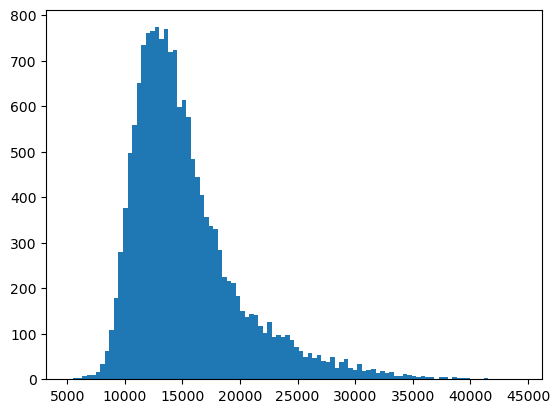

In [3]:
_ = plt.hist(np.array(adata.X.sum(axis=1)).reshape(-1), bins=100)

In [4]:
X = adata.X.toarray()

In [5]:
TPM = (2**X)-1

In [6]:
adata.X = sp.csr_matrix(TPM)

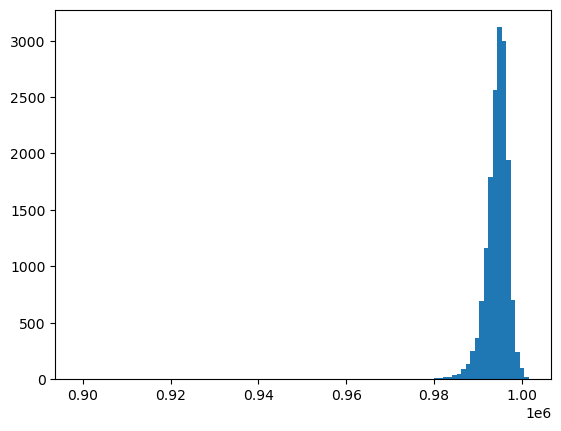

In [7]:
_ = plt.hist(np.array(adata.X.sum(axis=1)).reshape(-1), bins=100)

In [8]:
adata.shape

(16291, 55737)

In [9]:
protein_coding_genes = pd.ExcelFile('../../../Data/Revision/Melanoma_Clinical_GSE120575/NIHMS1510803-supplement-15.xlsx').parse('Protein coding genes-methods')
protein_coding_genes.head()

,Gene Name
0,A1BG
1,A1CF
2,A2M
3,A2ML1
4,A3GALT2


In [10]:
adata = adata[:, protein_coding_genes['Gene Name']]

In [11]:
adata.shape

(16291, 20645)

In [12]:
sc.pp.filter_genes(adata, min_cells=10)

/PHShome/dk718/miniforge3/envs/py310/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:275: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["n_cells"] = number


In [13]:
adata.shape

(16291, 18938)

In [14]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e6)

In [15]:
adata.X.sum(axis=1)

matrix([[1000000.],
        [1000000.],
        [1000000.],
        ...,
        [1000000.],
        [1000000.],
        [1000000.]])

In [16]:
adata.write('../../../Data/Revision/Melanoma_Clinical_GSE120575/GSE120575_melanoma_scRNA.TPM.h5ad')

In [17]:
adata = sc.read('../../../Data/Revision/Melanoma_Clinical_GSE120575/GSE120575_melanoma_scRNA.TPM.h5ad')

In [18]:
sc.pp.highly_variable_genes(adata, flavor='cell_ranger', n_top_genes=2000)

In [19]:
sc.pp.log1p(adata)

In [20]:
sc.pp.pca(adata, mask_var='highly_variable')

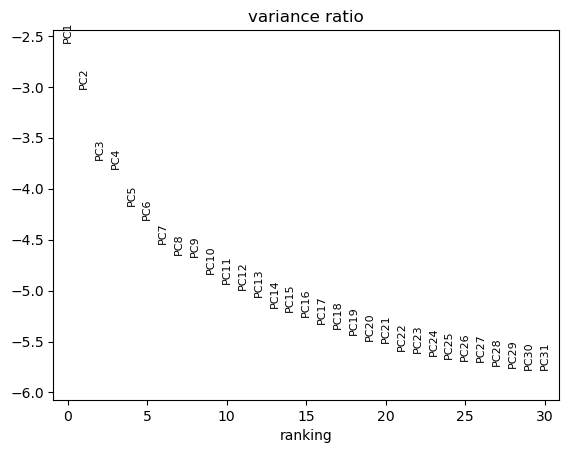

In [21]:
sc.pl.pca_variance_ratio(adata, log=True)

In [22]:
sc.pp.neighbors(adata, n_pcs=28, n_neighbors=20)

In [23]:
sc.tl.umap(adata)

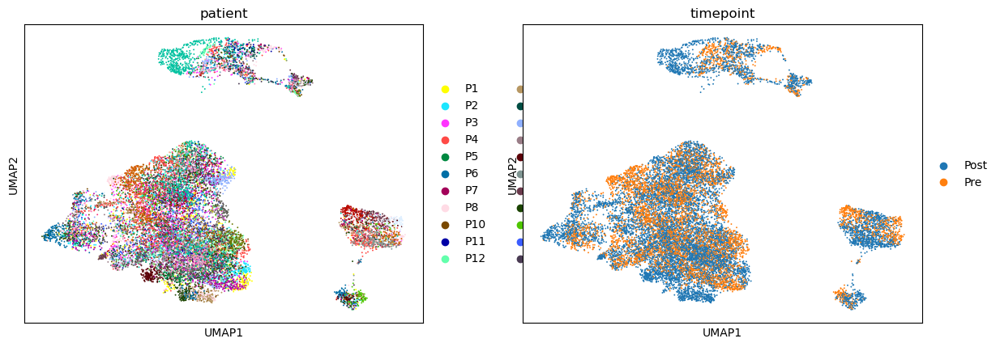

In [24]:
sc.pl.umap(adata, color=['patient', 'timepoint'])

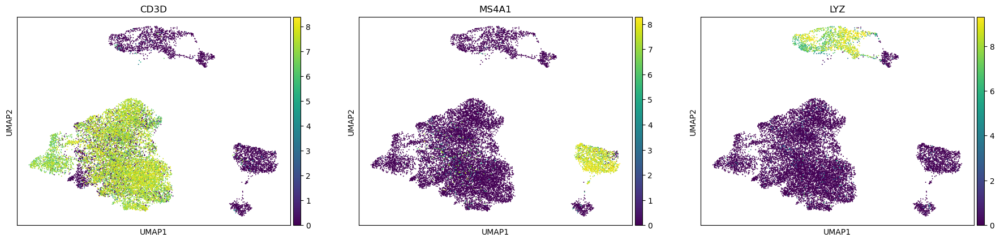

In [25]:
sc.pl.umap(adata, color=['CD3D', 'MS4A1', 'LYZ'], vmax='p99')

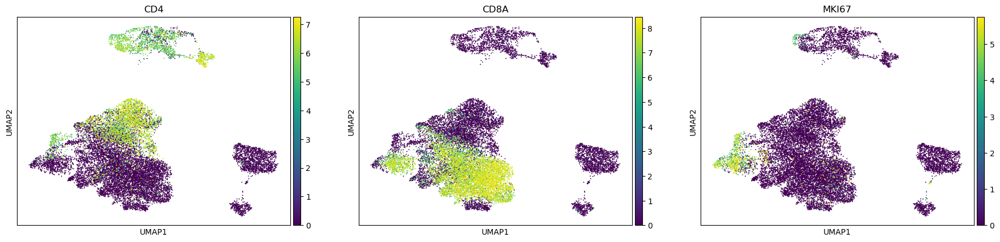

In [26]:
sc.pl.umap(adata, color=['CD4', 'CD8A', 'MKI67'], vmax='p99')

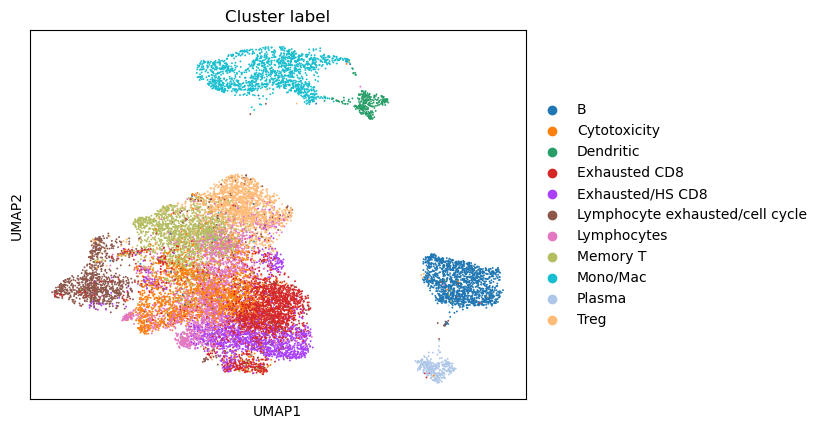

In [27]:
sc.pl.umap(adata, color=['Cluster label'], vmax='p99')

In [28]:
sc.tl.leiden(adata, resolution=1.0)

/tmp/ipykernel_244666/1432200975.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=1.0)


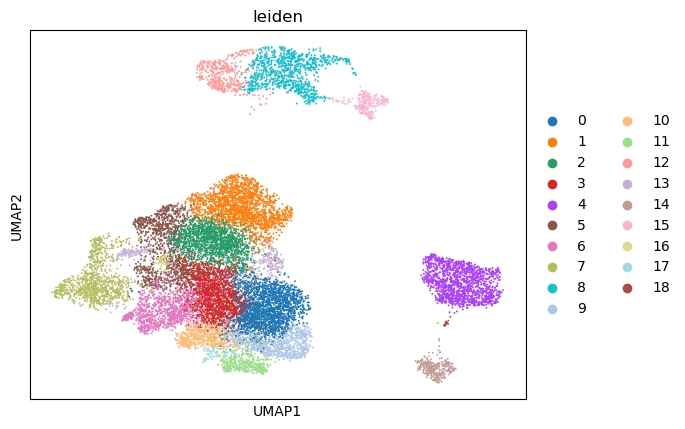

In [29]:
sc.pl.umap(adata, color=['leiden'])

In [30]:
sc.tl.rank_genes_groups(adata, groupby='leiden')

In [31]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,CCL5,TRBC2,IL7R,CCL5,HLA-DRA,TCF7,NKG7,STMN1,IFI30,CCL5,CCL5,CCL5,TYROBP,TRBC2,SSR4,IGJ,IFITM2,TRBC2,TCL1A
1,NKG7,SPOCK2,RPL13,CD8A,CD74,IL7R,GNLY,HMGN2,LYZ,NKG7,CXCR4,NKG7,GPX1,GZMK,MZB1,BCL11A,IFITM1,CRTAM,IRF8
2,CD8A,CD4,EEF1A1,KLRK1,MS4A1,MTRNR2L1,PRF1,TUBA1B,CST3,CD8A,CD8A,TRDC,GRN,TRAC,FKBP11,HLA-DRA,ISG15,CD8A,CD22
3,KLRK1,TRAC,JUNB,TRBC2,CD79A,DGKA,CCL5,TUBB,TYROBP,DUSP4,RGS1,PRF1,FCER1G,CD3G,DERL3,CD74,IFI44L,RPL7,DEK
4,PRF1,TNFRSF18,TNFAIP3,GZMK,BCL11A,GIMAP5,CTSW,H2AFZ,FCER1G,TRBC2,KLRK1,KLRK1,CD68,SRGN,IGJ,TCF4,IFI6,TIGIT,HLA-DRA
5,TRAC,ARID5B,FOS,NKG7,IRF8,MTRNR2L12,KLRD1,HMGB1,GRN,PRF1,TNFAIP3,GZMK,NPC2,TMSB4X,SEC11C,PLD4,MX1,KLRK1,CD79A
6,TRBC2,MAF,RPL10,TNFAIP3,HLA-DPA1,LEF1,GZMB,HMGB2,PSAP,CST7,ZFP36L2,TRDV1,IFI30,PFN1,PRDX4,PTPRS,IFITM3,CLEC2D,NCF1
7,GZMA,TNFRSF4,TRBC2,DUSP2,HLA-DQB1,CCR7,CST7,GAPDH,HLA-DRA,TNFAIP3,TSC22D3,CST7,CTSB,GZMA,XBP1,IRF8,XAF1,GAPDH,KIAA0922
8,CD3G,CTLA4,TPT1,CXCR4,BANK1,MT-ND4L,FGFBP2,CALM3,AIF1,LYST,TRBC2,GZMA,S100A11,COTL1,HERPUD1,PLAC8,STAT1,RPSA,CD79B
9,CD8B,FOXP3,RPS3,ANXA1,IGHM,TC2N,GZMH,RAN,S100A11,DNAJA1,TMEM2,GZMB,CD63,RNF19A,FKBP2,LILRA4,TRDC,RPL7A,HMGN1


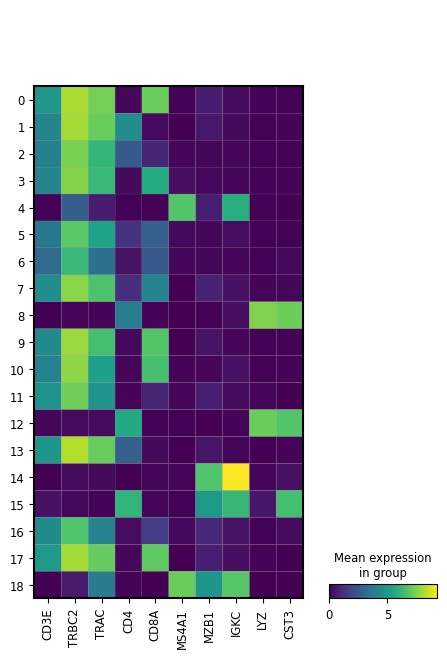

In [38]:
sc.pl.matrixplot(adata, groupby='leiden', var_names=['CD3E', 'TRBC2', 'TRAC', 'CD4', 'CD8A', 'MS4A1', 'MZB1', 'IGKC', 'LYZ', 'CST3'])

In [33]:
mapping = {
    0 : 'T.1',
    1 : 'T.2',
    2 : 'T.3',
    3 : 'T.4',
    4 : 'B.1',
    5 : 'T.5',
    6 : 'T.6',
    7 : 'T.7',
    8 : 'Myeloid.1',
    9 : 'T.8',
    10 : 'T.9',
    11 : 'T.10',
    12 : 'Myeloid.2',
    13 : 'T.11',
    14 : 'Plasma.1',
    15 : 'DC.1',
    16 : 'T.11',
    17 : 'T.12',
    18 : 'B.2'
}

adata.obs['leiden_labeled'] = adata.obs['leiden'].astype(int).replace(mapping)
adata.obs['leiden_labeled_reduced'] = adata.obs['leiden_labeled'].apply(lambda x: x.split('.')[0])

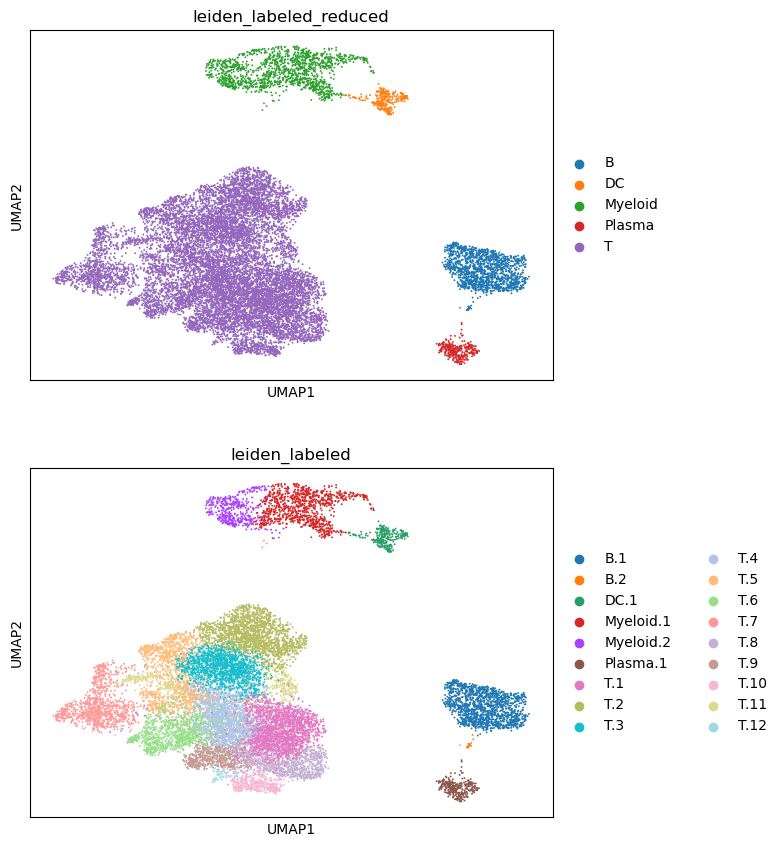

In [34]:
sc.pl.umap(adata, color=['leiden_labeled_reduced', 'leiden_labeled'], ncols=1)

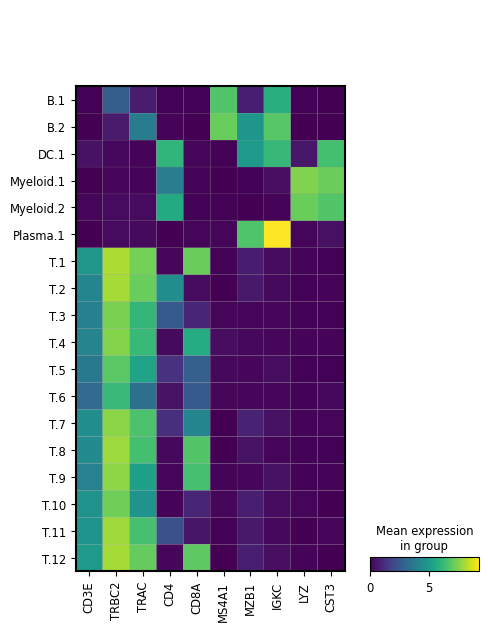

In [35]:
sc.pl.matrixplot(adata, groupby='leiden_labeled', var_names=['CD3E', 'TRBC2', 'TRAC', 'CD4', 'CD8A', 'MS4A1', 'MZB1', 'IGKC', 'LYZ', 'CST3'])

In [36]:
sc.tl.rank_genes_groups(adata, groupby='leiden_labeled')

In [37]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

,B.1,B.2,DC.1,Myeloid.1,Myeloid.2,Plasma.1,T.1,T.2,T.3,T.4,T.5,T.6,T.7,T.8,T.9,T.10,T.11,T.12
0,HLA-DRA,TCL1A,IGJ,IFI30,TYROBP,SSR4,CCL5,TRBC2,IL7R,CCL5,TCF7,NKG7,STMN1,CCL5,CCL5,CCL5,TRBC2,TRBC2
1,CD74,IRF8,BCL11A,LYZ,GPX1,MZB1,NKG7,SPOCK2,RPL13,CD8A,IL7R,GNLY,HMGN2,NKG7,CXCR4,NKG7,TMSB4X,CRTAM
2,MS4A1,CD22,HLA-DRA,CST3,GRN,FKBP11,CD8A,CD4,EEF1A1,KLRK1,MTRNR2L1,PRF1,TUBA1B,CD8A,CD8A,TRDC,CD3G,CD8A
3,CD79A,DEK,CD74,TYROBP,FCER1G,DERL3,KLRK1,TRAC,JUNB,TRBC2,DGKA,CCL5,TUBB,DUSP4,RGS1,PRF1,PFN1,RPL7
4,BCL11A,HLA-DRA,TCF4,FCER1G,CD68,IGJ,PRF1,TNFRSF18,TNFAIP3,GZMK,GIMAP5,CTSW,H2AFZ,TRBC2,KLRK1,KLRK1,GZMK,TIGIT
5,IRF8,CD79A,PLD4,GRN,NPC2,SEC11C,TRAC,ARID5B,FOS,NKG7,MTRNR2L12,KLRD1,HMGB1,PRF1,TNFAIP3,GZMK,IL32,KLRK1
6,HLA-DPA1,NCF1,PTPRS,PSAP,IFI30,PRDX4,TRBC2,MAF,RPL10,TNFAIP3,LEF1,GZMB,HMGB2,CST7,ZFP36L2,TRDV1,CD3E,CLEC2D
7,HLA-DQB1,KIAA0922,IRF8,HLA-DRA,CTSB,XBP1,GZMA,TNFRSF4,TRBC2,DUSP2,CCR7,CST7,GAPDH,TNFAIP3,TSC22D3,CST7,B2M,GAPDH
8,BANK1,CD79B,PLAC8,AIF1,S100A11,HERPUD1,CD3G,CTLA4,TPT1,CXCR4,MT-ND4L,FGFBP2,CALM3,LYST,TRBC2,GZMA,HLA-A,RPSA
9,IGHM,HMGN1,LILRA4,S100A11,CD63,FKBP2,CD8B,FOXP3,RPS3,ANXA1,TC2N,GZMH,RAN,DNAJA1,TMEM2,GZMB,TRAC,RPL7A


In [39]:
adata.write('../../../Data/Revision/Melanoma_Clinical_GSE120575/GSE120575_melanoma_scRNA.logTPM.clustered.h5ad')

In [40]:
pd.crosstab(adata.obs['Cluster label'].rename('Published cluster'), adata.obs['leiden_labeled_reduced'].rename('Our cluster'))

Our cluster,B,DC,Myeloid,Plasma,T
Published cluster,,,,,
B,1437,0,7,0,11
Cytotoxicity,2,0,1,1,2161
Dendritic,0,279,11,0,0
Exhausted CD8,1,0,0,3,2218
Exhausted/HS CD8,0,0,0,0,1656
Lymphocyte exhausted/cell cycle,14,0,1,1,1113
Lymphocytes,1,1,0,0,2163
Memory T,5,0,1,0,1767
Mono/Mac,0,2,1380,0,9


# Analyze T-cells

In [3]:
adata_tpm = sc.read('../../../Data/Revision/Melanoma_Clinical_GSE120575/GSE120575_melanoma_scRNA.TPM.h5ad')

In [4]:
adata = sc.read('../../../Data/Revision/Melanoma_Clinical_GSE120575/GSE120575_melanoma_scRNA.logTPM.clustered.WithSupervisedAnnotations.h5ad')

Only considering the two last: ['.WithSupervisedAnnotations', '.h5ad'].
Only considering the two last: ['.WithSupervisedAnnotations', '.h5ad'].


In [5]:
adata_tpm.obs = adata.obs

In [6]:
import os
os.path.abspath('../../../Data/Revision/Melanoma_Clinical_GSE120575/GSE120575_melanoma_scRNA.TPM.h5ad')

'/data/srlab1/TCAT/Data/Revision/Melanoma_Clinical_GSE120575/GSE120575_melanoma_scRNA.TPM.h5ad'

In [7]:
adata = adata_tpm[adata.obs['leiden_labeled_reduced']=='T', :]

In [8]:
adata

View of AnnData object with n_obs × n_vars = 12831 × 18938
    obs: 'cell_label', 'cell_id', 'sample', 'response', 'therapy', 'timepoint', 'patient', 'cell_id_orig', 'Cell Name', 'Cluster number', 'Cell Name Orig', 'CD8+CD39+TIM+_Sorted', 'CD8+CD39-TIM-_Sorted', 'Cluster label', 'n_counts', 'leiden', 'leiden_labeled', 'leiden_labeled_reduced', 'Supervised_T', 'Supervised_Memory_CD4', 'Supervised_Memory_CD8', 'Supervised_Activated', 'Supervised_Exhausted'
    var: 'gene_symbol', 'n_cells'

In [9]:
sc.pp.highly_variable_genes(adata, flavor='cell_ranger', n_top_genes=2000)

/PHShome/dk718/miniforge3/envs/py310/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:664: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}


In [11]:
sc.pp.log1p(adata)

In [12]:
sc.pp.pca(adata, use_highly_variable=True)

/PHShome/dk718/miniforge3/envs/py310/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


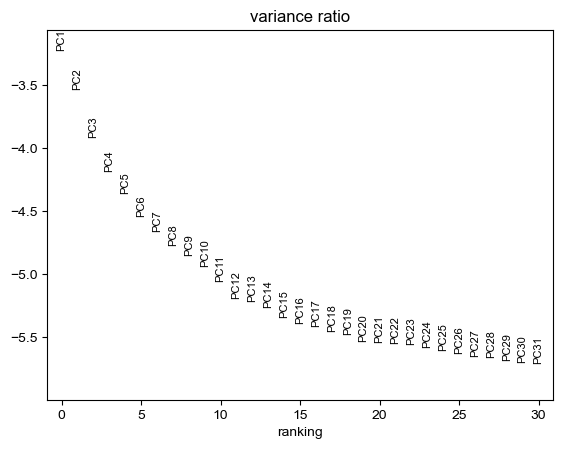

In [13]:
sc.pl.pca_variance_ratio(adata, log=True)

In [18]:
sc.external.pp.harmony_integrate(adata, key=['sample'], max_iter_harmony=30)

2024-11-11 14:58:39,779 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-11-11 14:59:48,304 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-11-11 14:59:48,924 - harmonypy - INFO - Iteration 1 of 30
2024-11-11 15:01:51,851 - harmonypy - INFO - Iteration 2 of 30
2024-11-11 15:03:56,966 - harmonypy - INFO - Iteration 3 of 30
2024-11-11 15:05:49,523 - harmonypy - INFO - Iteration 4 of 30
2024-11-11 15:07:25,020 - harmonypy - INFO - Iteration 5 of 30
2024-11-11 15:08:29,185 - harmonypy - INFO - Iteration 6 of 30
2024-11-11 15:09:26,292 - harmonypy - INFO - Iteration 7 of 30
2024-11-11 15:10:17,316 - harmonypy - INFO - Iteration 8 of 30
2024-11-11 15:11:16,706 - harmonypy - INFO - Iteration 9 of 30
2024-11-11 15:12:10,524 - harmonypy - INFO - Iteration 10 of 30
2024-11-11 15:13:24,923 - harmonypy - INFO - Iteration 11 of 30
2024-11-11 15:14:43,525 - harmonypy - INFO - Iteration 12 of 30
2024-11-11 15:16:00,982 - harmonypy - INFO - Iteration 13 of

In [22]:
sc.pp.neighbors(adata, n_pcs=20, n_neighbors=20, use_rep='X_pca_harmony')

In [23]:
sc.tl.umap(adata)

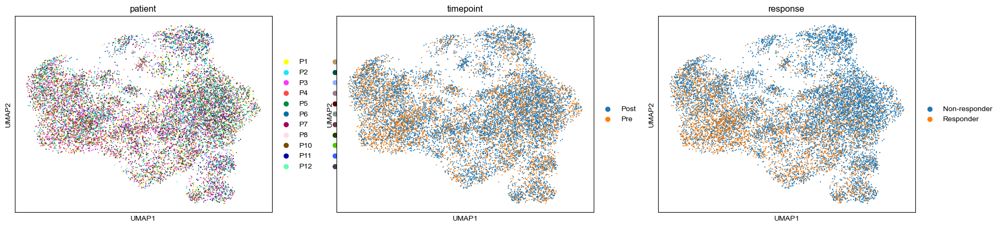

In [31]:
sc.pl.umap(adata, color=['patient', 'timepoint', 'response'])

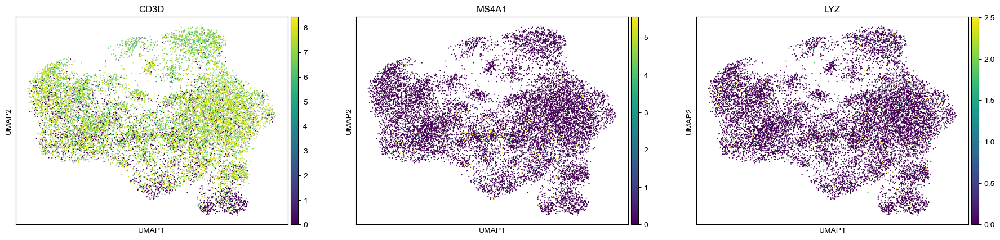

In [25]:
sc.pl.umap(adata, color=['CD3D', 'MS4A1', 'LYZ'], vmax='p99')

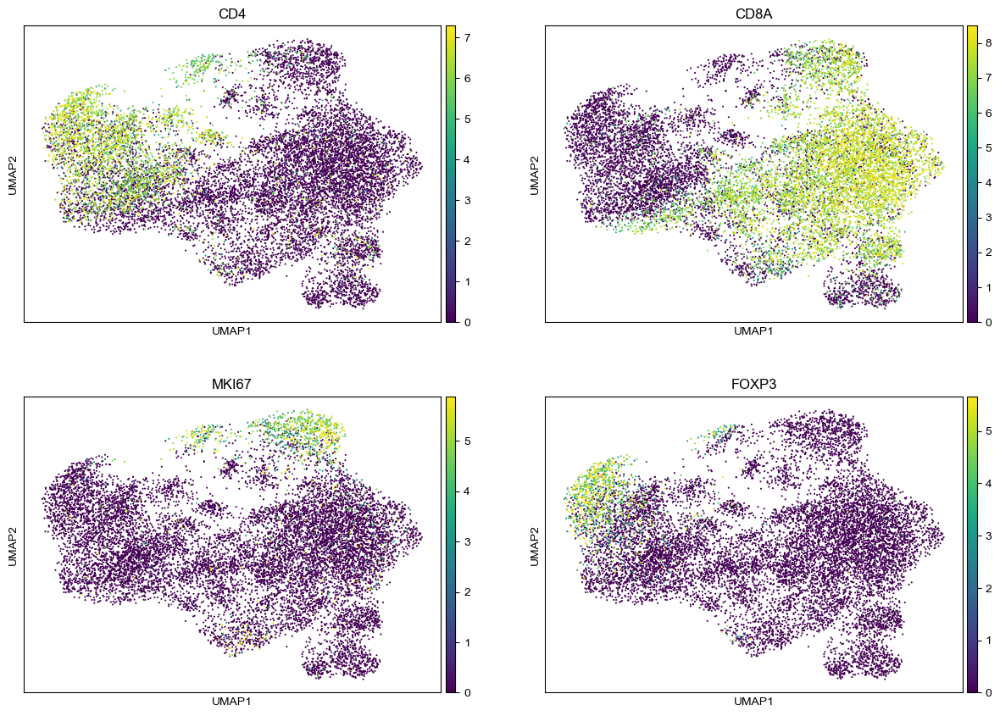

In [26]:
sc.pl.umap(adata, color=['CD4', 'CD8A', 'MKI67', 'FOXP3'], vmax='p99', ncols=2)

In [27]:
sc.tl.leiden(adata, resolution=1.0)

/tmp/ipykernel_277759/1432200975.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=1.0)


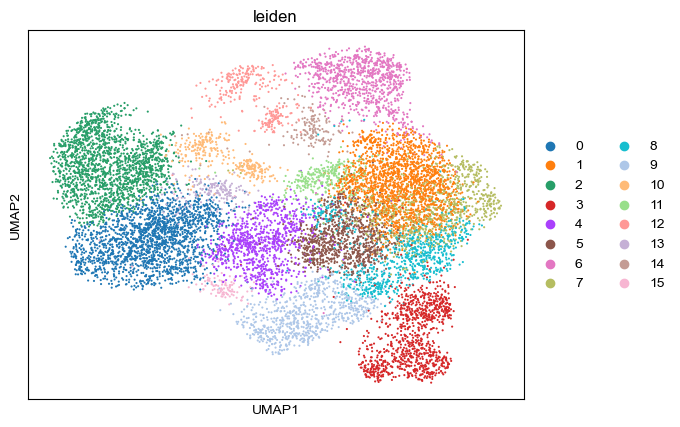

In [28]:
sc.pl.umap(adata, color=['leiden'])

In [29]:
sc.tl.rank_genes_groups(adata, groupby='leiden')

In [30]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,IL7R,NKG7,CD4,NKG7,KLRK1,CCL5,STMN1,CCL5,CCL5,MT-ND4L,CD4,DNAJB1,ACTB,ISG15,PARK7,GZMK
1,RPL13,CCL4,TNFRSF18,GNLY,CCL5,CCL4,TUBB,NKG7,NKG7,MT-CO1,CCL4,HSPA1A,PFN1,IFI6,HNRNPA1,GPR183
2,EEF1A1,CCL5,ARID5B,PRF1,IL7R,CCL4L1,HMGN2,CD8A,GZMA,MT-ND4,RGS1,HSPA1B,ARPC1B,IFITM2,RPL7,TMSB4X
3,RPL10,CCL4L1,SPOCK2,GZMB,FOS,CCL4L2,TUBA1B,PRF1,CD8A,MT-CO2,B2M,CCL5,ACTG1,IFITM1,CRTAM,FOXP1
4,RPL13A,PRF1,FOXP3,KLRD1,EEF1A1,GZMK,H2AFZ,GZMB,CCL4,MT-CYB,GAPDH,HSP90AA1,CFL1,IFI44L,FABP5,AHNAK
5,RPL3,KLRK1,MAF,PLAC8,RPS3,ZFP36,GAPDH,KLRK1,GZMK,MT-ND2,SRGN,HSPA8,PPIA,MX1,HSP90AB1,MGAT4A
6,TCF7,RGS1,TNFRSF4,FGFBP2,CXCR4,DUSP2,RAN,CD8B,KLRK1,MT-ND1,CCL4L1,HSPH1,ENO1,XAF1,TNFRSF9,PTPN3
7,RPLP2,GZMB,PIM2,CTSW,CD8A,NKG7,HMGB2,GZMH,CST7,MT-ND5,DUSP4,HSPE1,LDHB,IFI44,CXCL13,ANXA2
8,RPS3,CCL4L2,CTLA4,FCGR3A,TCF7,CXCR4,HMGB1,HAVCR2,CCL4L1,MTRNR2L12,PRDM1,HSPD1,MT2A,STAT1,PKM,ANTXR2
9,RPL41,CST7,TBC1D4,GZMH,RPL13,CST7,COX8A,IFI6,CCL4L2,CCL5,PDCD1,DNAJA1,STMN1,OAS1,RPL15,CD3G


In [32]:
adata.write('../../../Data/Revision/Melanoma_Clinical_GSE120575/GSE120575_melanoma_scRNA.Tcell.logTPM.clustered.h5ad')

# Run TCAT

In [6]:
adata = sc.read('../../../Data/Revision/Melanoma_Clinical_GSE120575/GSE120575_melanoma_scRNA.Tcell.logTPM.clustered.h5ad')

Only considering the two last: ['.clustered', '.h5ad'].
Only considering the two last: ['.clustered', '.h5ad'].


In [11]:
adata

AnnData object with n_obs × n_vars = 12831 × 18938
    obs: 'cell_label', 'cell_id', 'sample', 'response', 'therapy', 'timepoint', 'patient', 'cell_id_orig', 'Cell Name', 'Cluster number', 'Cell Name Orig', 'CD8+CD39+TIM+_Sorted', 'CD8+CD39-TIM-_Sorted', 'Cluster label', 'n_counts', 'leiden', 'leiden_labeled', 'leiden_labeled_reduced', 'Supervised_T', 'Supervised_Memory_CD4', 'Supervised_Memory_CD8', 'Supervised_Activated', 'Supervised_Exhausted'
    var: 'gene_symbol', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'patient_colors', 'pca', 'rank_genes_groups', 'response_colors', 'timepoint_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [5]:
adata_tpm = sc.read('../../../Data/Revision/Melanoma_Clinical_GSE120575/GSE120575_melanoma_scRNA.TPM.h5ad')

In [13]:
adata_tpm

AnnData object with n_obs × n_vars = 16291 × 18938
    obs: 'cell_label', 'cell_id', 'sample', 'response', 'therapy', 'timepoint', 'patient', 'cell_id_orig', 'Cell Name', 'Cluster number', 'Cell Name Orig', 'CD8+CD39+TIM+_Sorted', 'CD8+CD39-TIM-_Sorted', 'Cluster label', 'n_counts'
    var: 'gene_symbol', 'n_cells'

In [7]:
adata_tpm = adata_tpm[adata.obs.index, :]
adata_tpm.obs = adata.obs

In [15]:
tcat = starCAT(reference='TCAT.V1', cachedir='../../../Data/Revision/Melanoma_Clinical_GSE120575/tcat_cache')

Using reference from starCAT database
Loading reference from existing cache file for reference TCAT.V1


In [16]:
usage, scores = tcat.fit_transform(adata_tpm)

/PHShome/dk718/miniforge3/envs/py310/lib/python3.10/site-packages/starcat/starcat.py:249: UserWarning: WARNING!: query input is not an integer count matrix as expected.
            Please provide an integer count matrix unless you are sure you know what you are doing.
  warnings.warn("""WARNING!: query input is not an integer count matrix as expected.


3403 out of 3412 genes in the reference overlap with the query


/PHShome/dk718/miniforge3/envs/py310/lib/python3.10/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LogisticRegression from version 1.0.2 when using version 1.4.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [17]:
usage.to_csv('../../../Data/Revision/Melanoma_Clinical_GSE120575/GSE120575_melanoma_scRNA.TPM.T.TCAT.Usage.tsv', sep='\t')
scores.to_csv('../../../Data/Revision/Melanoma_Clinical_GSE120575/GSE120575_melanoma_scRNA.TPM.T.TCAT.Scores.tsv', sep='\t')

In [18]:
adata_tpm.obs = pd.concat([adata_tpm.obs, scores], axis=1)

In [19]:
adata_tpm.obs['TCAT_Exhaustion'] = usage['Exhaustion']
adata_tpm.obs['TCAT_Exhaustion_Bin'] = usage['Exhaustion']>0.0625

In [20]:
adata_tpm.write('../../../Data/Revision/Melanoma_Clinical_GSE120575/GSE120575_melanoma_scRNA.TPM.TCATadded.h5ad')

In [29]:
supervised_annotation_merge = pd.read_csv('../../../Data/Revision/Melanoma_Clinical_GSE120575/supervised_annotations_merged.tsv', sep='\t', index_col=0)
supervised_annotation_merge.head()

,sample,response,therapy,timepoint,patient,1,T cells,CD4 helper T cells,CD8 Cytotoxic T cells,Regulatory T cells,...,cDCs_dendritic_cells,pDCs,myeloid cells_general_immature,myeloid cells_general_mature,Neutrophils,Granolocytes,Double negative,CD3+,CD45+,CD45+CD3+
A10_P3_M11,Pre_P1,Responder,anti-CTLA4,Pre,P1,1,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
A11_P1_M11,Pre_P1,Responder,anti-CTLA4,Pre,P1,2,True,True,False,False,...,False,False,False,False,False,False,False,True,True,True
A11_P3_M11,Pre_P1,Responder,anti-CTLA4,Pre,P1,3,False,False,False,False,...,False,False,False,False,False,False,False,True,True,True
A11_P4_M11,Pre_P1,Responder,anti-CTLA4,Pre,P1,4,False,False,False,False,...,False,False,False,False,False,False,False,True,True,True
A12_P3_M11,Pre_P1,Responder,anti-CTLA4,Pre,P1,5,True,False,False,False,...,False,False,False,False,False,False,False,True,True,True


In [30]:
supervised_annotation_merge.iloc[:, 6:]

,T cells,CD4 helper T cells,CD8 Cytotoxic T cells,Regulatory T cells,Regulatory CD4 T cells,Regulatory CD8 T cells,Regulatory CD4_CD8 T cells,NKT cells,NK cells,B cells,...,cDCs_dendritic_cells,pDCs,myeloid cells_general_immature,myeloid cells_general_mature,Neutrophils,Granolocytes,Double negative,CD3+,CD45+,CD45+CD3+
A10_P3_M11,False,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,True,False
A11_P1_M11,True,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,True,True
A11_P3_M11,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,True,True,True
A11_P4_M11,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,True,True,True
A12_P3_M11,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H8_P1_M41_L001,True,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
H8_P2_M41_L001,False,False,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
H8_P3_M41_L001,False,False,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,True,False
H9_P1_M41_L001,False,False,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,True,False


In [31]:
adata_tpm.obs = pd.merge(left=adata_tpm.obs, right=supervised_annotation_merge.iloc[:, 6:], how='left',
        left_index=True, right_index=True)

In [32]:
adata_tpm.obs.columns

Index(['cell_label', 'cell_id', 'sample', 'response', 'therapy', 'timepoint',
       'patient', 'cell_id_orig', 'Cell Name', 'Cluster number',
       'Cell Name Orig', 'CD8+CD39+TIM+_Sorted', 'CD8+CD39-TIM-_Sorted',
       'Cluster label', 'n_counts', 'leiden', 'leiden_labeled',
       'leiden_labeled_reduced', 'Supervised_T', 'Supervised_Memory_CD4',
       'Supervised_Memory_CD8', 'Supervised_Activated', 'Supervised_Exhausted',
       'ASA', 'Proliferation', 'ASA_binary', 'Proliferation_binary',
       'Multinomial_Label', 'TCAT_Exhaustion', 'TCAT_Exhaustion_Bin',
       'T cells', 'CD4 helper T cells', 'CD8 Cytotoxic T cells',
       'Regulatory T cells', 'Regulatory CD4 T cells',
       'Regulatory CD8 T cells', 'Regulatory CD4_CD8 T cells', 'NKT cells',
       'NK cells', 'B cells', 'Activated T cells', 'Senescence T cells',
       'Terminal effector', 'Exhausted T cells', 'Stem_like T cells',
       'Memory T cells', 'Memory CD4 T cells', 'Memory CD8 T cells',
       'Memory CD4_

In [33]:
pd.crosstab(adata_tpm.obs['Multinomial_Label'].rename('TCAT'), adata_tpm.obs['Memory CD4 T cells'].rename('Supervised_Memory_CD4'))

Supervised_Memory_CD4,False,True
TCAT,,
CD4_CM,2379,70
CD4_EM,1526,2
CD4_Naive,1485,51
CD8_CM,3008,3
CD8_EM,600,0
CD8_Naive,1013,1
CD8_TEMRA,549,0
MAIT,90,0
Treg,729,2


In [34]:
pd.crosstab(adata_tpm.obs['Multinomial_Label'].rename('TCAT'), adata_tpm.obs['Memory CD8 T cells'].rename('Supervised_Memory_CD8'))

Supervised_Memory_CD8,False,True
TCAT,,
CD4_CM,2428,21
CD4_EM,1519,9
CD4_Naive,1510,26
CD8_CM,2986,25
CD8_EM,596,4
CD8_Naive,976,38
CD8_TEMRA,549,0
MAIT,90,0
Treg,730,1


In [35]:
ct = pd.crosstab(adata_tpm.obs['ASA_binary'].rename('ASA'), adata_tpm.obs['Activated T cells'].rename('Supervised_Activated'))
ct

Supervised_Activated,False,True
ASA,,
False,3669,3528
True,3354,1405


In [36]:
fisher_exact(ct)

SignificanceResult(statistic=0.4356446663340351, pvalue=2.0658486052989022e-101)

In [37]:
ct = pd.crosstab(adata_tpm.obs['TCAT_Exhaustion_Bin'].rename('Exhausted T cells'), adata_tpm.obs['Supervised_Exhausted'].rename('Supervised_Exhausted'))

In [38]:
fisher_exact(ct)

SignificanceResult(statistic=2.8960789994000327, pvalue=2.7177941916043564e-130)

In [39]:
adata.obs = pd.concat([adata.obs, scores], axis=1)

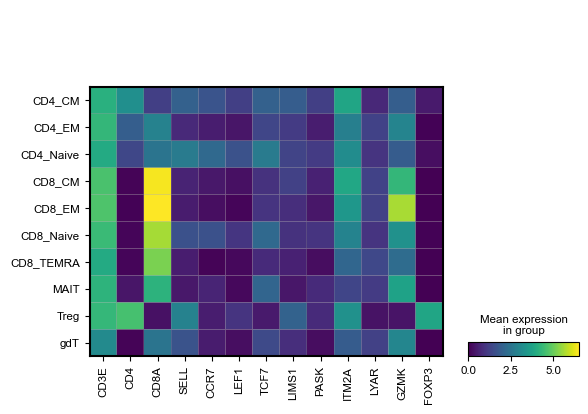

In [40]:
sc.pl.matrixplot(adata, var_names=['CD3E', 'CD4', 'CD8A', 'SELL', 'CCR7','LEF1', 'TCF7', 'LIMS1', 'PASK', 'ITM2A', 'LYAR', 'GZMK', 'FOXP3'], groupby='Multinomial_Label')

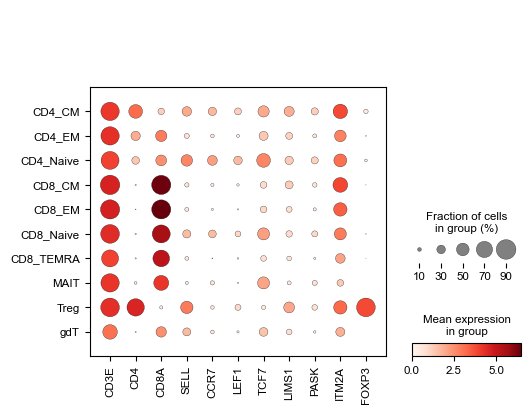

In [41]:
sc.pl.dotplot(adata, var_names=['CD3E', 'CD4', 'CD8A', 'SELL', 'CCR7','LEF1', 'TCF7', 'LIMS1', 'PASK', 'ITM2A', 'FOXP3'], groupby='Multinomial_Label')

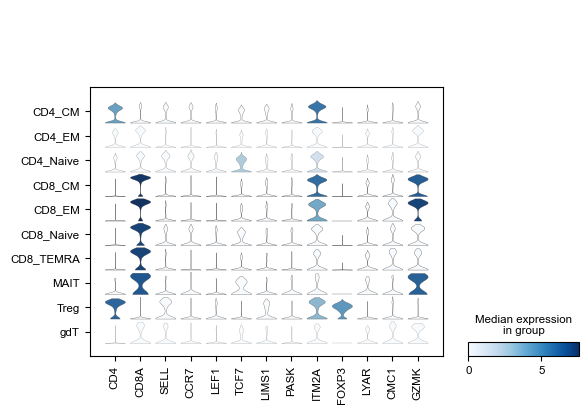

In [42]:
sc.pl.stacked_violin(adata, var_names=['CD4', 'CD8A', 'SELL', 'CCR7','LEF1', 'TCF7', 'LIMS1', 'PASK', 'ITM2A', 'FOXP3', 'LYAR', 'CMC1', 'GZMK'],
                     groupby='Multinomial_Label')

# plot UMAP

In [8]:
adata = sc.read('../../../Data/Revision/Melanoma_Clinical_GSE120575/GSE120575_melanoma_scRNA.Tcell.logTPM.clustered.h5ad')

Only considering the two last: ['.clustered', '.h5ad'].
Only considering the two last: ['.clustered', '.h5ad'].


In [4]:
cnares = pd.read_csv('../../../Data/Revision/Melanoma_Clinical_GSE120575/GSE120575_melanoma_scRNA.Tcell.logTPM.clustered.CNAanalysis.responsevsnonresponse.tsv', sep='\t', index_col=0)
#cnares.columns = ['CNA
cnares.head()

,ncorr,ncorr_thresh_fdr10p,ncorr_thresh_fdr5p
A10_P3_M11,-0.354909,-0.354909,-0.354909
A11_P1_M11,-0.274608,-0.000000,-0.000000
A11_P3_M11,-0.124287,-0.000000,-0.000000
A11_P4_M11,-0.042639,-0.000000,-0.000000
A12_P3_M11,-0.166791,-0.000000,-0.000000


In [9]:
usage = pd.read_csv('../../../Data/Revision/Melanoma_Clinical_GSE120575/GSE120575_melanoma_scRNA.TPM.T.TCAT.Usage.tsv', sep='\t', index_col = 0)
scores = pd.read_csv('../../../Data/Revision/Melanoma_Clinical_GSE120575/GSE120575_melanoma_scRNA.TPM.T.TCAT.Scores.tsv', sep='\t', index_col = 0)

In [10]:
adata.obs['ASA'] = scores['ASA']
adata.obs['Cell Cycle'] = scores['Proliferation']
adata.obs['Exhaustion'] = usage['Exhaustion']
adata.obs['ISG'] = usage['ISG']

adata.obs['CD4-Naive'] = usage['CD4-Naive']
adata.obs['CD8-Naive'] = usage['CD8-Naive']
adata.obs['Translation'] = usage['Translation']
adata.obs['HLA'] = usage['HLA']

adata.obs['ASA_binary'] = scores['ASA_binary']
adata.obs['Proliferation_binary'] = scores['Proliferation_binary']
adata.obs['Response'] = adata.obs['response']
adata.obs['Resp. Assoc.'] = cnares.loc[adata.obs.index, 'ncorr']

adata.obs['Treatment'] = adata.obs['timepoint']


adata.obs['Exhaustion_binary'] = usage['Exhaustion']>.0625
adata.obs['Multinomial_Label'] = scores['Multinomial_Label']
adata.obs['Multinomial_Label_Reduced'] = scores['Multinomial_Label'].replace({'CD4_CM':'CD4', 'CD4_EM':'CD4', 'CD4_Naive':'CD4',
                                                                              'CD8_CM':'CD8', 'CD8_EM':'CD8', 'CD8_Naive':'CD8',
                                                                              'CD8_TEMRA':'CD8', 'Treg':'Treg', 'gdT':'Other', 'MAIT':'Other'})
adata.obs['Lineage'] = scores['Multinomial_Label'].replace({'CD4_CM':'CD4 Mem.', 'CD4_EM':'CD4 Mem.', 'CD4_Naive':'CD4 Naiv.',
                                                                              'CD8_CM':'CD8 Mem.', 'CD8_EM':'CD8 Mem.', 'CD8_Naive':'CD8 Naiv.',
                                                                              'CD8_TEMRA':'CD8 Mem.', 'Treg':'Treg', 'gdT':'MAIT/gdT', 'MAIT':'MAIT/gdT'})
adata.obs['TCF7 Expr.'] = adata.obs_vector('TCF7')

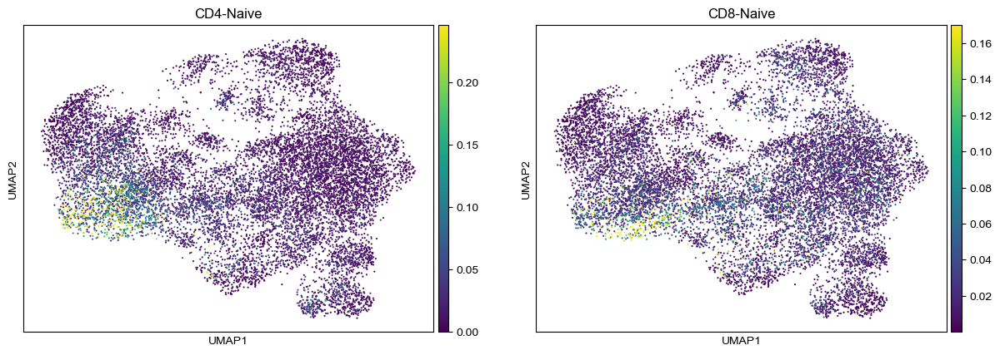

In [46]:
sc.pl.umap(adata, color=['CD4-Naive', 'CD8-Naive'], vmax='p99')


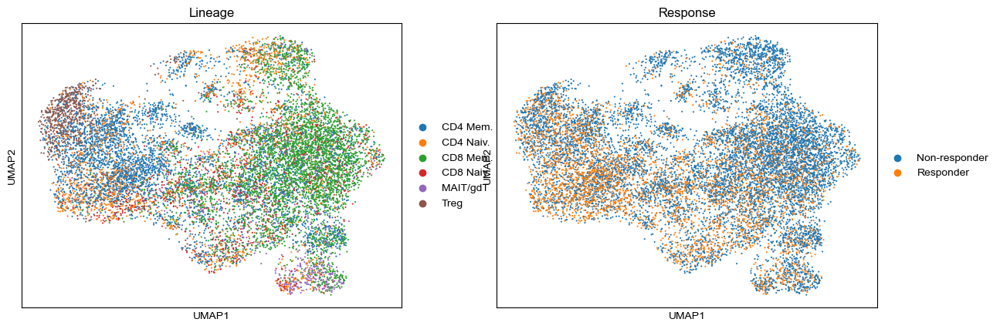

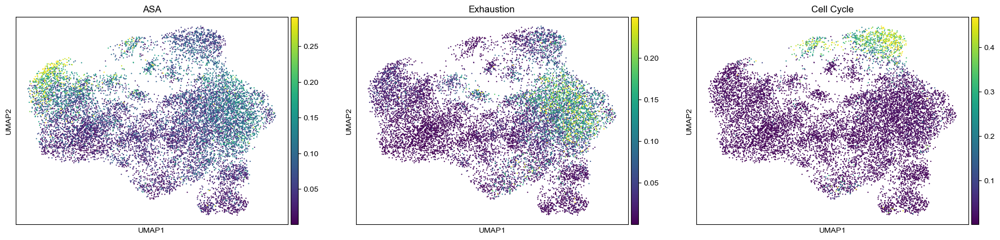

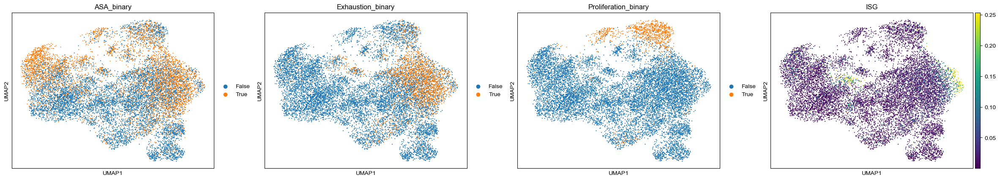

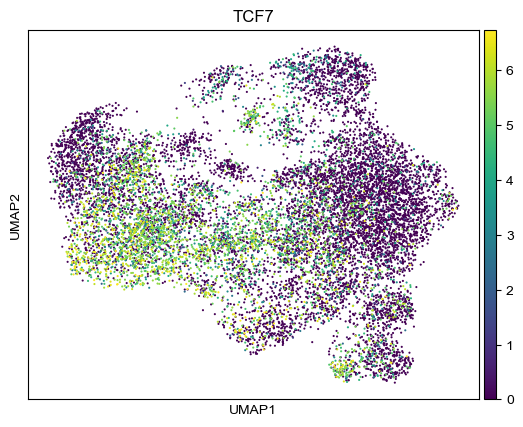

In [47]:
sc.pl.umap(adata, color=['Lineage', 'Response'], )
sc.pl.umap(adata, color=['ASA', 'Exhaustion', 'Cell Cycle'], vmax='p99', ncols=3)
sc.pl.umap(adata, color=['ASA_binary', 'Exhaustion_binary', 'Proliferation_binary', 'ISG'], vmax='p99')
sc.pl.umap(adata, color=['TCF7'], vmax='p99')

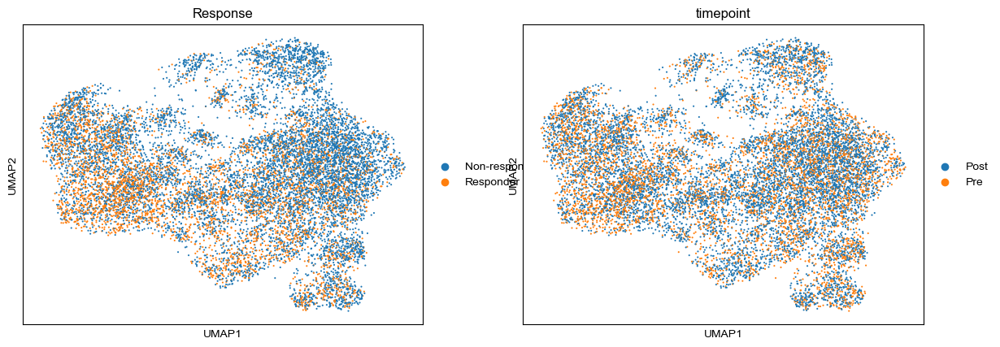

In [42]:
sc.pl.umap(adata, color=['Response', 'timepoint'], vmax='p99')

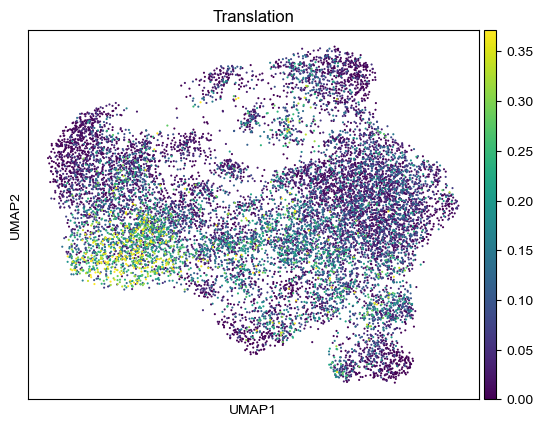

In [49]:
sc.pl.umap(adata, color=['Translation'], vmax='p99')

In [11]:
import matplotlib.patches as patches
import os

In [12]:
x = sns.color_palette("tab10")
x.as_hex

<bound method _ColorPalette.as_hex of [(0.12156862745098039, 0.4666666666666667, 0.7058823529411765), (1.0, 0.4980392156862745, 0.054901960784313725), (0.17254901960784313, 0.6274509803921569, 0.17254901960784313), (0.8392156862745098, 0.15294117647058825, 0.1568627450980392), (0.5803921568627451, 0.403921568627451, 0.7411764705882353), (0.5490196078431373, 0.33725490196078434, 0.29411764705882354), (0.8901960784313725, 0.4666666666666667, 0.7607843137254902), (0.4980392156862745, 0.4980392156862745, 0.4980392156862745), (0.7372549019607844, 0.7411764705882353, 0.13333333333333333), (0.09019607843137255, 0.7450980392156863, 0.8117647058823529)]>

In [15]:
adata.obs['Lineage'] = adata.obs['Lineage'].astype('category')

/var/folders/xy/25x47jqj6j901q3rwt9jsb7c0000gq/T/ipykernel_59039/733645294.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  col.loc[col>=maxv] = maxv
/var/folders/xy/25x47jqj6j901q3rwt9jsb7c0000gq/T/ipykernel_59039/733645294.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  col.loc[col>=maxv] = maxv
/var/folders/xy/25x47jqj6j901q3rwt9jsb7c0000gq/T/ipykernel_59039/733645294.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  col

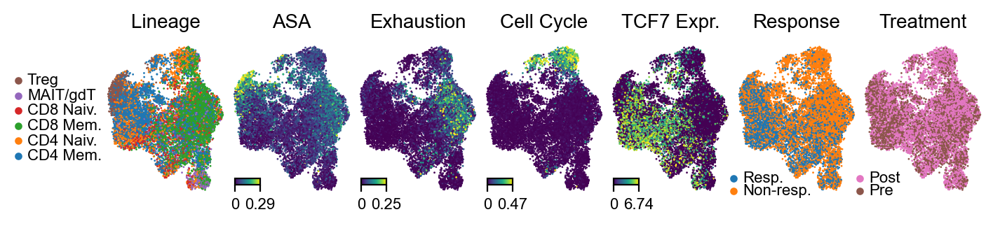

In [52]:
(fig,axes) = plt.subplots(1,7, figsize=(7.,1.5), dpi=200, gridspec_kw={'wspace':0, 'left':.1, 'right':1, 'top':.83, 'bottom':.08})
order = ['Lineage', 'ASA', 'Exhaustion', 'Cell Cycle', 'TCF7 Expr.', 'Response', 'Treatment']

umap1 = adata.obsm['X_umap'][:,0]
umap2 = adata.obsm['X_umap'][:,1]
lincmap = dict(zip(list(adata.obs['Lineage'].cat.categories), adata.uns['Lineage_colors']))
responsecmap = dict(zip(list(adata.obs['Response'].cat.categories), adata.uns['Response_colors'][::-1]))
treatmentcmap = dict(zip(['Pre', 'Post'], sns.color_palette("tab10").as_hex()[5:7]))

lincolor = adata.obs['Lineage'].replace(lincmap)
responsecolor =  adata.obs['Response'].replace(responsecmap)
treatmentcolor =  adata.obs['Treatment'].replace(treatmentcmap)

condition_cmap = {'Response':responsecolor, 'Treatment':treatmentcolor}
cmap_map = {'Response':responsecmap, 'Treatment':treatmentcmap}

s=1

maxpp = .99
cbar_left= 0.05; cbar_bottom= 0.08; cbar_length= 0.2; cbar_height= 0.04

for i,c in enumerate(order):
    if c == 'Lineage':
        axes[i].scatter(umap1, umap2, c=lincolor, s=s, edgecolor='None', rasterized=True)
        legax = axes[i].inset_axes([-.7, .2, .7, .6], transform=axes[i].transAxes)
        legax.set_xticks([])
        legax.set_yticks([])
        n= len(lincmap)
        labels = list(lincmap.keys())
        ypos = np.linspace(0.1, .9, n)
        legax.set_xlim([0, 1])
        legax.set_ylim([0, 1])
        for j,y in enumerate(ypos):
            legax.scatter(.05, y, color=lincmap[labels[j]], s=8)
            legax.text(.15, y, labels[j], fontsize=8, va='center')

        legax.set_axis_off()
    elif c in ['Response', 'Treatment']:
        axes[i].scatter(umap1, umap2, c=condition_cmap[c], s=s, edgecolor='None', rasterized=True)
        legax = axes[i].inset_axes([-.2, 0, .5, .2], transform=axes[i].transAxes)
        legax.set_xticks([])
        legax.set_yticks([])
        n= len(cmap_map[c].keys())
        labels = list(cmap_map[c].keys())
        tolab = [x.replace('onder', '.') for x in labels]
        ypos = np.linspace(0.2, .6, n)
        legax.set_xlim([0, 1])
        legax.set_ylim([0, 1])
        for j,y in enumerate(ypos):
            legax.scatter(.4, y, color=cmap_map[c][labels[j]], s=8)
            legax.text(.55, y, tolab[j], fontsize=8, va='center')

        legax.set_axis_off()
    else:
        col = adata.obs[c]
        maxv = col.quantile(maxpp)
        col.loc[col>=maxv] = maxv
        imv = axes[i].scatter(umap1, umap2, c=col, s=s, edgecolor='None', rasterized=True)
        cax = axes[i].inset_axes([cbar_left, cbar_bottom, cbar_length, cbar_height], transform=axes[i].transAxes)
        fig.colorbar(imv, ax=axes[i], cax=cax, orientation='horizontal', ticks=[0, maxv])
        cax.set_xticks([0, maxv])

        cax.set_xticklabels([0, '%.2f' % maxv], fontsize=8)
    
    axes[i].set_title(c, fontsize=10)
    axes[i].set_axis_off()



/var/folders/xy/25x47jqj6j901q3rwt9jsb7c0000gq/T/ipykernel_59039/2373315005.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  col.loc[col>=maxv] = maxv
/var/folders/xy/25x47jqj6j901q3rwt9jsb7c0000gq/T/ipykernel_59039/2373315005.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  col.loc[col>=maxv] = maxv
/var/folders/xy/25x47jqj6j901q3rwt9jsb7c0000gq/T/ipykernel_59039/2373315005.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  

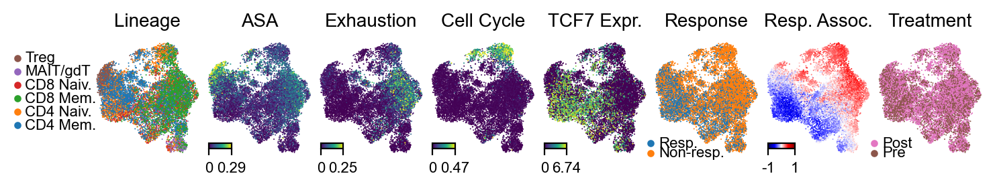

In [53]:
(fig,axes) = plt.subplots(1,8, figsize=(7.4,1.2), dpi=200, gridspec_kw={'wspace':0, 'left':.1, 'right':1, 'top':.83, 'bottom':.08})
order = ['Lineage', 'ASA', 'Exhaustion', 'Cell Cycle', 'TCF7 Expr.', 'Response', 'Resp. Assoc.', 'Treatment']

umap1 = adata.obsm['X_umap'][:,0]
umap2 = adata.obsm['X_umap'][:,1]
lincmap = dict(zip(list(adata.obs['Lineage'].cat.categories), adata.uns['Lineage_colors']))
responsecmap = dict(zip(list(adata.obs['Response'].cat.categories), adata.uns['Response_colors'][::-1]))
treatmentcmap = dict(zip(['Pre', 'Post'], sns.color_palette("tab10").as_hex()[5:7]))

lincolor = adata.obs['Lineage'].replace(lincmap)
responsecolor =  adata.obs['Response'].replace(responsecmap)
treatmentcolor =  adata.obs['Treatment'].replace(treatmentcmap)

condition_cmap = {'Response':responsecolor, 'Treatment':treatmentcolor}
cmap_map = {'Response':responsecmap, 'Treatment':treatmentcmap}

s=.5

maxpp = .99
cbar_left= 0.05; cbar_bottom= 0.08; cbar_length= 0.2; cbar_height= 0.04

for i,c in enumerate(order):
    if c == 'Lineage':
        axes[i].scatter(umap1, umap2, c=lincolor, s=s, edgecolor='None', rasterized=True)
        legax = axes[i].inset_axes([-.7, .2, .7, .7], transform=axes[i].transAxes)
        legax.set_xticks([])
        legax.set_yticks([])
        n= len(lincmap)
        labels = list(lincmap.keys())
        ypos = np.linspace(0.1, .9, n)
        legax.set_xlim([0, 1])
        legax.set_ylim([0, 1])
        for j,y in enumerate(ypos):
            legax.scatter(.05, y, color=lincmap[labels[j]], s=8)
            legax.text(.15, y, labels[j], fontsize=8, va='center')

        legax.set_axis_off()
    elif c in ['Response', 'Treatment']:
        axes[i].scatter(umap1, umap2, c=condition_cmap[c], s=s, edgecolor='None', rasterized=True)
        legax = axes[i].inset_axes([-.2, 0, .5, .2], transform=axes[i].transAxes)
        legax.set_xticks([])
        legax.set_yticks([])
        n= len(cmap_map[c].keys())
        labels = list(cmap_map[c].keys())
        tolab = [x.replace('onder', '.') for x in labels]
        ypos = np.linspace(0.2, .6, n)
        legax.set_xlim([0, 1])
        legax.set_ylim([0, 1])
        for j,y in enumerate(ypos):
            legax.scatter(.4, y, color=cmap_map[c][labels[j]], s=8)
            legax.text(.55, y, tolab[j], fontsize=8, va='center')

        legax.set_axis_off()
    elif c == 'Resp. Assoc.':
        col = adata.obs[c]
        imv = axes[i].scatter(umap1, umap2, c=col, s=s, vmin=-1, vmax=1, cmap='seismic', edgecolor='None', rasterized=True)
        cax = axes[i].inset_axes([cbar_left, cbar_bottom, cbar_length*1.2, cbar_height], transform=axes[i].transAxes)
        fig.colorbar(imv, ax=axes[i], cax=cax, orientation='horizontal', ticks=[0, maxv])
        cax.set_xticks([-1, 1])
        cax.set_xticklabels([-1, 1], fontsize=8)
    
    else:
        col = adata.obs[c]
        maxv = col.quantile(maxpp)
        col.loc[col>=maxv] = maxv
        imv = axes[i].scatter(umap1, umap2, c=col, s=s, edgecolor='None', rasterized=True)
        cax = axes[i].inset_axes([cbar_left, cbar_bottom, cbar_length, cbar_height], transform=axes[i].transAxes)
        fig.colorbar(imv, ax=axes[i], cax=cax, orientation='horizontal', ticks=[0, maxv])
        cax.set_xticks([0, maxv])

        cax.set_xticklabels([0, '%.2f' % maxv], fontsize=8)
    
    axes[i].set_title(c, fontsize=10)
    axes[i].set_axis_off()

plt.savefig(os.path.join(figdir, 'melanoma_umap_panel.pdf'))
plt.savefig(os.path.join(figdir, 'melanoma_umap_panel.png'))

In [19]:
pastel_cmap_dict = {
    'CD4 CM': '#4fa3e1',  # Brighter blue
    'CD4 EM': '#ff9e1a',  # Brighter orange
    'CD4 Naive': '#00997d',  # Brighter green
    'CD4 TEMRA': '#e65b5f',  # Brighter red
    'CD8 CM': '#c56bff',  # Brighter purple
    'CD8 EM': '#b29170',  # Brighter brown
    'CD8 Naive': '#e9aaff',  # Brighter pink
    'CD8 TEMRA': '#ffe59a',  # Brighter olive green
    'DN': '#6bd7e5',  # Brighter cyan
    'DP': '#b4c8f2',  # Brighter light blue
    'MAIT': '#ffd39b',  # Brighter peach
    'Treg': '#94c47d',  # Brighter light green
    'gdT': '#fdb4b2',  # Brighter light red
}

In [85]:
shortlin_map = {
    'CD4 Mem.': 'CD4 TEMRA',
    'CD4 Naiv.': 'CD4 Naive',
    'CD8 Mem.': 'CD8 EM',
    'CD8 Naiv.': 'CD8 Naive',
    'MAIT/gdT' : 'gdT',
    'Treg' : 'Treg'
}

In [65]:
adata.obs['Multinomial_Label_Rename'] = adata.obs['Multinomial_Label'].str.replace('_', ' ')


/tmp/ipykernel_211121/746345169.py:13: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  responsecolor =  adata.obs['Response'].replace(responsecmap)
/tmp/ipykernel_211121/746345169.py:14: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  treatmentcolor =  adata.obs['Treatment'].replace(treatmentcmap)
/tmp/ipykernel_211121/746345169.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  col

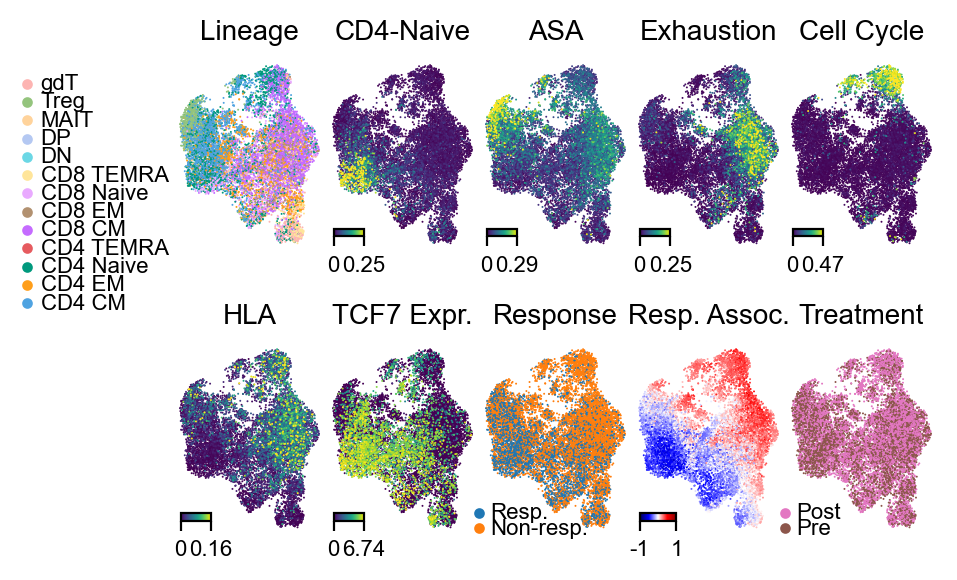

In [90]:
(fig,axes) = plt.subplots(2,5, figsize=(4.5,3), dpi=200, gridspec_kw={'wspace':0, 'hspace':.45, 'left':.15, 'right':1, 'top':.88, 'bottom':.08})
axes = axes.ravel()
order = ['Multinomial_Label_Rename', 'CD4-Naive', 'ASA', 'Exhaustion', 'Cell Cycle', 'HLA', 'TCF7 Expr.', 'Response', 'Resp. Assoc.', 'Treatment']

umap1 = pd.Series(adata.obsm['X_umap'][:,0], index=adata.obs.index)
umap2 = pd.Series(adata.obsm['X_umap'][:,1], index=adata.obs.index)
lincmap = pastel_cmap_dict
# lincmap = dict(zip(list(adata.obs['Lineage'].cat.categories), adata.uns['Lineage_colors']))
responsecmap = dict(zip(list(adata.obs['Response'].cat.categories), adata.uns['Response_colors'][::-1]))
treatmentcmap = dict(zip(['Pre', 'Post'], sns.color_palette("tab10").as_hex()[5:7]))

lincolor = adata.obs['Multinomial_Label_Rename'].replace(pastel_cmap_dict)
responsecolor =  adata.obs['Response'].replace(responsecmap)
treatmentcolor =  adata.obs['Treatment'].replace(treatmentcmap)

condition_cmap = {'Response':responsecolor, 'Treatment':treatmentcolor}
cmap_map = {'Response':responsecmap, 'Treatment':treatmentcmap}

s=.5

maxpp = .99
cbar_left= 0.05; cbar_bottom= 0.08; cbar_length= 0.2; cbar_height= 0.04

for i,c in enumerate(order):
    if c == 'Multinomial_Label_Rename':
        axes[i].scatter(umap1, umap2, c=lincolor, s=s, edgecolor='None', rasterized=True)
        legax = axes[i].inset_axes([-1, -.4, .9, 1.4], transform=axes[i].transAxes)
        legax.set_xticks([])
        legax.set_yticks([])
        n= len(lincmap)
        labels = list(lincmap.keys())
        ypos = np.linspace(0.1, .9, n)
        legax.set_xlim([0, 1])
        legax.set_ylim([0, 1])
        for j,y in enumerate(ypos):
            legax.scatter(0.05, y, color=lincmap[labels[j]], s=8)
            legax.text(0.15, y, labels[j], fontsize=8, va='center')

        legax.set_axis_off()
    elif c in ['Response', 'Treatment']:
        axes[i].scatter(umap1, umap2, c=condition_cmap[c], s=s, edgecolor='None', rasterized=True)
        legax = axes[i].inset_axes([-.2, 0, .5, .2], transform=axes[i].transAxes)
        legax.set_xticks([])
        legax.set_yticks([])
        n= len(cmap_map[c].keys())
        labels = list(cmap_map[c].keys())
        tolab = [x.replace('onder', '.') for x in labels]
        ypos = np.linspace(0.2, .6, n)
        legax.set_xlim([0, 1])
        legax.set_ylim([0, 1])
        for j,y in enumerate(ypos):
            legax.scatter(.4, y, color=cmap_map[c][labels[j]], s=8)
            legax.text(.55, y, tolab[j], fontsize=8, va='center')

        legax.set_axis_off()
    elif c == 'Resp. Assoc.':
        col = adata.obs[c]
        imv = axes[i].scatter(umap1, umap2, c=col, s=s, vmin=-1, vmax=1, cmap='seismic', edgecolor='None', rasterized=True)
        cax = axes[i].inset_axes([cbar_left, cbar_bottom, cbar_length*1.2, cbar_height], transform=axes[i].transAxes)
        fig.colorbar(imv, ax=axes[i], cax=cax, orientation='horizontal', ticks=[0, maxv])
        cax.set_xticks([-1, 1])
        cax.set_xticklabels([-1, 1], fontsize=8)
    
    else:
        col = adata.obs[c]
        cellorder = col.sort_values(ascending=True).index
        maxv = col.quantile(maxpp)
        col.loc[col>=maxv] = maxv
        imv = axes[i].scatter(umap1.loc[cellorder], umap2.loc[cellorder], c=col.loc[cellorder], s=s, edgecolor='None', rasterized=True)
        cax = axes[i].inset_axes([cbar_left, cbar_bottom, cbar_length, cbar_height], transform=axes[i].transAxes)
        fig.colorbar(imv, ax=axes[i], cax=cax, orientation='horizontal', ticks=[0, maxv])
        cax.set_xticks([0, maxv])

        cax.set_xticklabels([0, '%.2f' % maxv], fontsize=8)
    
    if c == 'Multinomial_Label_Rename':
        axes[i].set_title('Lineage', fontsize=10)
    else:
        axes[i].set_title(c, fontsize=10)
    axes[i].set_axis_off()

plt.savefig(os.path.join(figdir, 'melanoma_umap_panel_2x5.pdf'), bbox_inches="tight")
plt.savefig(os.path.join(figdir, 'melanoma_umap_panel_2x5.png'), bbox_inches="tight")

In [87]:
lincmap = {l:pastel_cmap_dict[shortlin_map[l]] for l in adata.obs['Lineage'].unique()}

/tmp/ipykernel_211121/2753899743.py:11: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  lincolor = adata.obs['Lineage'].replace(lincmap)
/tmp/ipykernel_211121/2753899743.py:12: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  responsecolor =  adata.obs['Response'].replace(responsecmap)
/tmp/ipykernel_211121/2753899743.py:13: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categorie

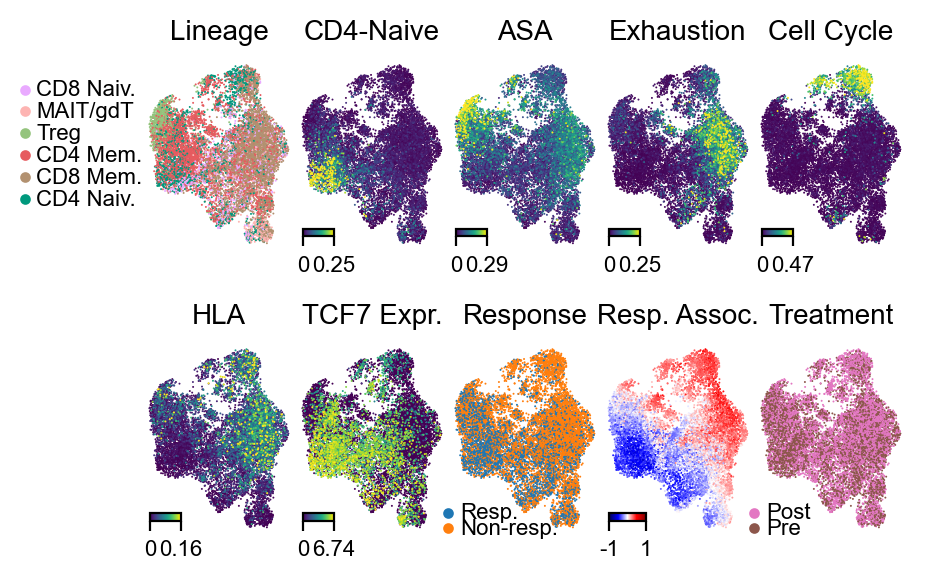

In [88]:
(fig,axes) = plt.subplots(2,5, figsize=(4.5,3), dpi=200, gridspec_kw={'wspace':0, 'hspace':.45, 'left':.15, 'right':1, 'top':.88, 'bottom':.08})
axes = axes.ravel()
order = ['Lineage', 'CD4-Naive', 'ASA', 'Exhaustion', 'Cell Cycle', 'HLA', 'TCF7 Expr.', 'Response', 'Resp. Assoc.', 'Treatment']

umap1 = pd.Series(adata.obsm['X_umap'][:,0], index=adata.obs.index)
umap2 = pd.Series(adata.obsm['X_umap'][:,1], index=adata.obs.index)
# lincmap = dict(zip(list(adata.obs['Lineage'].cat.categories), adata.uns['Lineage_colors']))
responsecmap = dict(zip(list(adata.obs['Response'].cat.categories), adata.uns['Response_colors'][::-1]))
treatmentcmap = dict(zip(['Pre', 'Post'], sns.color_palette("tab10").as_hex()[5:7]))

lincolor = adata.obs['Lineage'].replace(lincmap)
responsecolor =  adata.obs['Response'].replace(responsecmap)
treatmentcolor =  adata.obs['Treatment'].replace(treatmentcmap)

condition_cmap = {'Response':responsecolor, 'Treatment':treatmentcolor}
cmap_map = {'Response':responsecmap, 'Treatment':treatmentcmap}

s=.5

maxpp = .99
cbar_left= 0.05; cbar_bottom= 0.08; cbar_length= 0.2; cbar_height= 0.04

for i,c in enumerate(order):
    if c == 'Lineage':
        axes[i].scatter(umap1, umap2, c=lincolor, s=s, edgecolor='None', rasterized=True)
        legax = axes[i].inset_axes([-.8, .2, .7, .7], transform=axes[i].transAxes)
        legax.set_xticks([])
        legax.set_yticks([])
        n= len(lincmap)
        labels = list(lincmap.keys())
        ypos = np.linspace(0.1, .9, n)
        legax.set_xlim([0, 1])
        legax.set_ylim([0, 1])
        for j,y in enumerate(ypos):
            legax.scatter(.05, y, color=lincmap[labels[j]], s=8)
            legax.text(.15, y, labels[j], fontsize=8, va='center')

        legax.set_axis_off()
    elif c in ['Response', 'Treatment']:
        axes[i].scatter(umap1, umap2, c=condition_cmap[c], s=s, edgecolor='None', rasterized=True)
        legax = axes[i].inset_axes([-.2, 0, .5, .2], transform=axes[i].transAxes)
        legax.set_xticks([])
        legax.set_yticks([])
        n= len(cmap_map[c].keys())
        labels = list(cmap_map[c].keys())
        tolab = [x.replace('onder', '.') for x in labels]
        ypos = np.linspace(0.2, .6, n)
        legax.set_xlim([0, 1])
        legax.set_ylim([0, 1])
        for j,y in enumerate(ypos):
            legax.scatter(.4, y, color=cmap_map[c][labels[j]], s=8)
            legax.text(.55, y, tolab[j], fontsize=8, va='center')

        legax.set_axis_off()
    elif c == 'Resp. Assoc.':
        col = adata.obs[c]
        imv = axes[i].scatter(umap1, umap2, c=col, s=s, vmin=-1, vmax=1, cmap='seismic', edgecolor='None', rasterized=True)
        cax = axes[i].inset_axes([cbar_left, cbar_bottom, cbar_length*1.2, cbar_height], transform=axes[i].transAxes)
        fig.colorbar(imv, ax=axes[i], cax=cax, orientation='horizontal', ticks=[0, maxv])
        cax.set_xticks([-1, 1])
        cax.set_xticklabels([-1, 1], fontsize=8)
    
    else:
        col = adata.obs[c]
        cellorder = col.sort_values(ascending=True).index
        maxv = col.quantile(maxpp)
        col.loc[col>=maxv] = maxv
        imv = axes[i].scatter(umap1.loc[cellorder], umap2.loc[cellorder], c=col.loc[cellorder], s=s, edgecolor='None', rasterized=True)
        cax = axes[i].inset_axes([cbar_left, cbar_bottom, cbar_length, cbar_height], transform=axes[i].transAxes)
        fig.colorbar(imv, ax=axes[i], cax=cax, orientation='horizontal', ticks=[0, maxv])
        cax.set_xticks([0, maxv])

        cax.set_xticklabels([0, '%.2f' % maxv], fontsize=8)
    
    axes[i].set_title(c, fontsize=10)
    axes[i].set_axis_off()

# plt.savefig(os.path.join(figdir, 'melanoma_umap_panel_2x5.pdf'))
# plt.savefig(os.path.join(figdir, 'melanoma_umap_panel_2x5.png'))

# Correlate usage with CNA

In [55]:
from scipy.stats import pearsonr, spearmanr

In [56]:
spearmanr(scores['ASA'], adata.obs['Resp. Assoc.'])


SignificanceResult(statistic=0.43539525613244806, pvalue=0.0)

In [57]:
spearmanr(scores['Proliferation'], adata.obs['Resp. Assoc.'])

SignificanceResult(statistic=0.3389012019075928, pvalue=0.0)

In [58]:
spearmanr(usage['Exhaustion'], adata.obs['Resp. Assoc.'])

SignificanceResult(statistic=0.5660445730285868, pvalue=0.0)

In [59]:
spearmanr(usage['CD4-Naive'], adata.obs['Resp. Assoc.'])

SignificanceResult(statistic=-0.3629107750511435, pvalue=0.0)

In [60]:
spearmanr(adata.obs['TCF7 Expr.'], adata.obs['Resp. Assoc.'])

SignificanceResult(statistic=-0.3463163052527992, pvalue=0.0)

# Associate GEP usages with phenotype

In [21]:
adata_tpm = sc.read('../../../Data/Revision/Melanoma_Clinical_GSE120575/GSE120575_melanoma_scRNA.TPM.TCATadded.h5ad')

Only considering the two last: ['.TCATadded', '.h5ad'].
Only considering the two last: ['.TCATadded', '.h5ad'].


In [22]:
sample_data = adata_tpm.obs[['sample', 'response', 'therapy', 'timepoint', 'patient']].drop_duplicates()
sample_data.index = sample_data['sample'].values

In [23]:
ct = pd.crosstab(adata_tpm.obs['ASA_binary'], adata_tpm.obs['TCAT_Exhaustion_Bin'])
ct

TCAT_Exhaustion_Bin,False,True
ASA_binary,,
False,6610,1154
True,3478,1589


In [24]:
fisher_exact(ct)

SignificanceResult(statistic=2.6169171310031962, pvalue=8.794590637084069e-108)

In [200]:
import os

def run_ttest_all(rdat, variables, feature='response', g1lab='Non-responder', g2lab='Responder'):
    ttest_res = []
    for v in variables:
        T,P = ttest_ind(rdat.loc[rdat[feature]==g1lab, v], rdat.loc[rdat[feature]==g2lab, v],
                        equal_var=False)
        meandiff = rdat.loc[rdat[feature]==g1lab, v].mean() - rdat.loc[rdat[feature]==g2lab, v].mean()
        #T,P = ranksums(rdat.loc[rdat['response']=='Non-responder', v], rdat.loc[rdat['response']=='Responder', v])
        ttest_res.append([v, T, P, meandiff])

    ttest_res = pd.DataFrame(ttest_res, columns=['GEP', 'T', 'P', 'Delta'])
    ttest_res.index = ttest_res['GEP']

    _, ttest_res.loc[:, 'Q'] =  fdrcorrection(ttest_res.loc[:, 'P'])

    ttest_res['logP'] = ttest_res['P'].apply(np.log10)*-1
    ttest_res['logQ'] = ttest_res['Q'].apply(np.log10)*-1

    ttest_res['signed_logP'] = ttest_res['T'].apply(np.sign)*ttest_res['logP']
    return(ttest_res)


def run_ranksums_all(rdat, variables, feature='response', g1lab='Non-responder', g2lab='Responder'):
    ttest_res = []
    for v in variables:
        T,P = ranksums(rdat.loc[rdat['response']=='Non-responder', v], rdat.loc[rdat['response']=='Responder', v])
        meandiff = rdat.loc[rdat[feature]==g1lab, v].mean() - rdat.loc[rdat[feature]==g2lab, v].mean()
        ttest_res.append([v, T, P, meandiff])

    ttest_res = pd.DataFrame(ttest_res, columns=['GEP', 'T', 'P', 'Delta'])
    ttest_res.index = ttest_res['GEP']

    _, ttest_res.loc[:, 'Q'] =  fdrcorrection(ttest_res.loc[:, 'P'])

    ttest_res['logP'] = ttest_res['P'].apply(np.log10)*-1
    ttest_res['logQ'] = ttest_res['Q'].apply(np.log10)*-1

    ttest_res['signed_logP'] = ttest_res['T'].apply(np.sign)*ttest_res['logP']
    return(ttest_res)



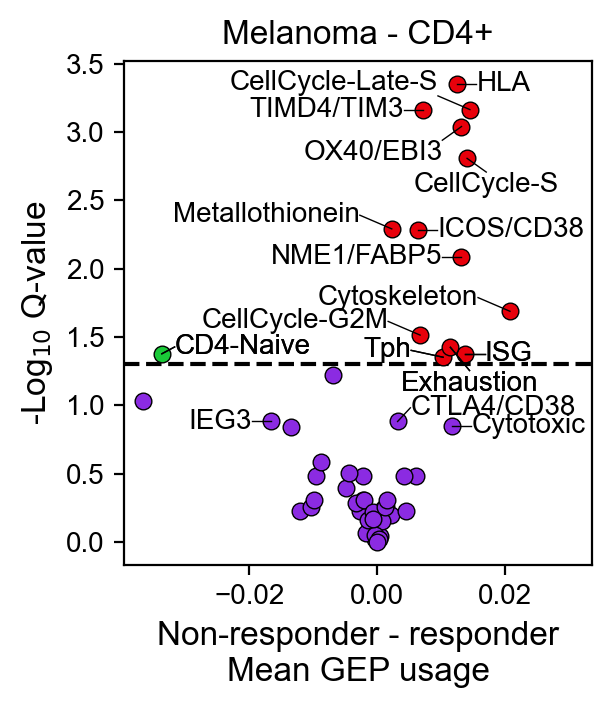

In [201]:
variables = usage.columns
ind = adata_tpm.obs['Multinomial_Label'].isin(['CD4_Naive', 'CD4_CM', 'CD4_EM']) & ~adata_tpm.obs['CD8+CD39+TIM+_Sorted'] & ~adata_tpm.obs['CD8+CD39-TIM-_Sorted']
allcell_usage = usage.loc[ind, :].groupby(adata_tpm.obs.loc[ind, 'sample']).mean()
allcell_act_count = adata_tpm.obs.loc[ind,:].groupby('sample').count()
sample_data_withcount = sample_data.copy()
sample_data_withcount['Count'] = allcell_act_count.loc[sample_data_withcount.index, 'cell_label'].values
allcell_act_pct_merged = pd.merge(left=sample_data_withcount, right=allcell_usage, left_index=True, right_index=True, how='left')

r = 'Both'
rdat = allcell_act_pct_merged.copy()
ttest_res = run_ttest_all(rdat, variables, g1lab='Non-responder', g2lab='Responder')

(fig,ax) = plt.subplots(1,1, figsize=(3,4), dpi=200, gridspec_kw={'left':.2, 'right':.98, 'bottom':.23, 'top':.86})

ind1 = (ttest_res[ 'Delta']>0) & (ttest_res[ 'logQ']>-1*np.log10(.05))
ind2 = (ttest_res[ 'Delta']<0) & (ttest_res[ 'logQ']>-1*np.log10(.05))
ind3 = (ttest_res[ 'logQ']<-1*np.log10(.05))

labels = ['FDR < .05, +', 'FDR < .05, -', 'FDR > .05']
scat1 = ax.scatter(ttest_res.loc[ind1, 'Delta'], ttest_res.loc[ind1, 'logQ'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[3], label=labels[0])
scat2 = ax.scatter(ttest_res.loc[ind2, 'Delta'], ttest_res.loc[ind2, 'logQ'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[2], label=labels[1])
scat3 = ax.scatter(ttest_res.loc[ind3, 'Delta'], ttest_res.loc[ind3, 'logQ'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[4], label=labels[2])
scats = [scat1, scat2, scat3]

ylim = ax.get_ylim()
xlim = ax.get_xlim()
ax.hlines(y=-1*np.log10(.05), xmin=xlim[0], xmax=xlim[1], linestyle='--', zorder=-1, color='k')
ax.set_xlim(xlim)

geps_to_plot = list(ttest_res.index[ttest_res['Q']<.05]) + ['ISG', 'CD4-Naive', 'Tph', 'Exhaustion']
xval = 'Delta'
yval = 'logQ'
fs = 10
for i,g in enumerate(list(geps_to_plot) + ['CTLA4/CD38', 'Cytotoxic', 'IEG3']):
    #lab = shorten_map[g]
    lab = g


    
    if g in ['TIMD4/TIM3', 'NME1/FABP5', 'IEG3']: deltax = -0.003; deltay =0; ha='right'; va='center' ## Left
    elif g in ['CD4-Naive']: deltax = 0.002; deltay = .05; ha='left'; va='center' ## Upper-right
    elif g in ['CTLA4/CD38']: deltax = 0.002; deltay = .1; ha='left'; va='center' ## Upper-right

    elif g in ['Exhaustion']: deltax = 0.003; deltay = -.17; ha='center'; va='top' ## Lower-right
    elif g in ['OX40/EBI3']: deltax = -0.003; deltay =-0.1; ha='right'; va='top' ## Lower-Left
    elif g in []: deltax = 0; deltay =0.05; ha='center'; va='bottom' ## Above
    elif g in ['CellCycle-S']: deltax = 0.003; deltay =-0.1; ha='center'; va='top' ## Below

    elif g in ['CellCycle-Late-S']: deltax = -0.005; deltay =0.1; ha='right'; va='bottom' ## Upper-Left
    elif g in ['Metallothionein', 'Cytoskeleton', 'CellCycle-G2M',]: deltax = -0.005; deltay =0.1; ha='right'; va='center' ## Upper-Left
    elif g in [ 'Tph']: deltax = -0.005; deltay =0.05; ha='right'; va='center' ## Upper-Left

    else: deltax=.003; deltay=0; ha='left'; va='center' # Default to right

    ax.text(ttest_res.at[g, xval]+deltax, ttest_res.at[g, yval]+deltay, lab, ha=ha, va=va, fontsize=fs)
    ax.plot([ttest_res.at[g, xval], ttest_res.at[g, xval]+deltax], [ttest_res.at[g, yval], ttest_res.at[g, yval]+deltay], color='k', lw=.5)
        

ylim = ax.get_ylim()
xlim = ax.get_xlim()
ax.hlines(y=-1*np.log10(.05), xmin=xlim[0]+.1, xmax=xlim[1], linestyle='--', zorder=-1, color='k')
ax.set_xlim(xlim[0], xlim[1]+.01)
ax.set_title('Melanoma - CD4+', fontsize=12) 
ax.set_xlabel('Non-responder - responder\nMean GEP usage', fontsize=12)
ax.set_ylabel('-Log$_{10}$ Q-value', fontsize=12)

plt.savefig(os.path.join(figdir, 'CD4_Melanoma_Usage_Assoc_Volcano.png'))
plt.savefig(os.path.join(figdir, 'CD4_Melanoma_Usage_Assoc_Volcano.pdf'))

ttest_res.to_csv(os.path.join(outdir, 'CD4_melanoma_usage_both_gep_association.tsv'), sep='\t')

In [202]:
ttest_res.sort_values(by='P')

,GEP,T,P,Delta,Q,logP,logQ,signed_logP
GEP,,,,,,,,
HLA,HLA,5.038427,0.000009,0.012547,0.000443,5.069859,3.353856,5.069859
TIMD4/TIM3,TIMD4/TIM3,4.697457,0.000032,0.007248,0.000686,4.495103,3.163531,4.495103
CellCycle-Late-S,CellCycle-Late-S,4.667582,0.000040,0.014550,0.000686,4.402413,3.163531,4.402413
OX40/EBI3,OX40/EBI3,4.379109,0.000070,0.013235,0.000913,4.153457,3.039513,4.153457
CellCycle-S,CellCycle-S,4.186279,0.000150,0.014112,0.001561,3.823648,2.806614,3.823648
Metallothionein,Metallothionein,3.750754,0.000590,0.002312,0.005115,3.229000,2.291148,3.229000
ICOS/CD38,ICOS/CD38,3.679906,0.000699,0.006388,0.005190,3.155770,2.284865,3.155770
NME1/FABP5,NME1/FABP5,3.448966,0.001265,0.013203,0.008221,2.897998,2.085084,2.897998
Cytoskeleton,Cytoskeleton,3.081988,0.003546,0.020829,0.020487,2.450288,1.688527,2.450288


In [203]:
melanoma_pos = ttest_res.index[ind1]
melanoma_neg = ttest_res.index[ind2]
melanoma_un = ttest_res.index[ind3]

In [204]:
melanoma_pos

Index(['CellCycle-G2M', 'HLA', 'ISG', 'CellCycle-S', 'NME1/FABP5',
       'CellCycle-Late-S', 'Cytoskeleton', 'Metallothionein', 'TIMD4/TIM3',
       'ICOS/CD38', 'OX40/EBI3', 'Tph', 'Exhaustion'],
      dtype='object', name='GEP')

In [205]:
melanoma_neg

Index(['CD4-Naive'], dtype='object', name='GEP')

In [206]:
melanoma_un

Index(['Translation', 'Mito', 'Doublet-RBC', 'gdT', 'Cytotoxic',
       'Doublet-Platelet', 'Th22', 'MAIT', 'Heatshock', 'Multi-Cytokine',
       'TEMRA', 'Doublet-Myeloid', 'CD4-CM', 'IEG', 'CD8-EM', 'IEG2', 'Treg',
       'Th17-Resting', 'Poor-Quality', 'CD8-Naive', 'RGCC/MYADM',
       'Doublet-Plasmablast', 'BCL2/FAM13A', 'IL10/IL19', 'Th2-Activated',
       'Th2-Resting', 'Doublet-Bcell', 'Th1-Like', 'CTLA4/CD38', 'CD8-Trm',
       'Th17-Activated', 'Tfh-2', 'CD172a/MERTK', 'IEG3', 'Doublet-Fibroblast',
       'SOX4/TOX2', 'CD40LG/TXNIP', 'Tfh-1'],
      dtype='object', name='GEP')

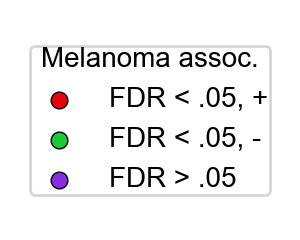

In [207]:
(fig,ax) = plt.subplots(1,1, figsize=(1.3, 1), dpi=200, gridspec_kw={'left':0, 'right':1, 'top':1, 'bottom':0})
legend = ax.legend(handles=scats, labels=labels, fontsize=10, title='Melanoma assoc.', loc='center', borderpad=0.06, title_fontsize=10)
ax.axis('off')
fig.patch.set_alpha(0.0)
plt.savefig(os.path.join(figdir, 'CD4_Melanoma_Usage_Assoc_Volcano_Legend.png'))
plt.savefig(os.path.join(figdir, 'CD4_Melanoma_Usage_Assoc_Volcano_Legend.pdf'))

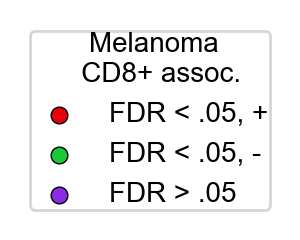

In [229]:
(fig,ax) = plt.subplots(1,1, figsize=(1.3, 1), dpi=200, gridspec_kw={'left':0, 'right':1, 'top':1, 'bottom':0})
legend = ax.legend(handles=scats, labels=labels, fontsize=10, title='    Melanoma\n   CD8+ assoc.', loc='center', borderpad=0.06, title_fontsize=10)
ax.axis('off')
fig.patch.set_alpha(0.0)
plt.savefig(os.path.join(figdir, 'CD4_Melanoma_CD8_Usage_Assoc_Volcano_Legend.png'))
plt.savefig(os.path.join(figdir, 'CD4_Melanoma_CD8_Usage_Assoc_Volcano_Legend.pdf'))

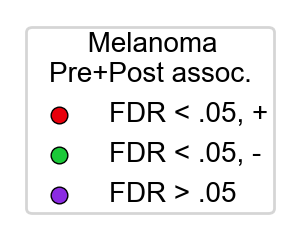

In [208]:
(fig,ax) = plt.subplots(1,1, figsize=(1.3, 1), dpi=200, gridspec_kw={'left':0, 'right':1, 'top':1, 'bottom':0})
legend = ax.legend(handles=scats, labels=labels, fontsize=10, title='     Melanoma\nPre+Post assoc.', loc='center', borderpad=0.2, title_fontsize=10)
ax.axis('off')
fig.patch.set_alpha(0.0)
plt.savefig(os.path.join(figdir, 'CD4_Melanoma_Usage_Assoc_Volcano_Legend_PrePost.png'))
plt.savefig(os.path.join(figdir, 'CD4_Melanoma_Usage_Assoc_Volcano_Legend_PrePost.pdf'))

In [209]:
ttest_res.sort_values('P')

,GEP,T,P,Delta,Q,logP,logQ,signed_logP
GEP,,,,,,,,
HLA,HLA,5.038427,0.000009,0.012547,0.000443,5.069859,3.353856,5.069859
TIMD4/TIM3,TIMD4/TIM3,4.697457,0.000032,0.007248,0.000686,4.495103,3.163531,4.495103
CellCycle-Late-S,CellCycle-Late-S,4.667582,0.000040,0.014550,0.000686,4.402413,3.163531,4.402413
OX40/EBI3,OX40/EBI3,4.379109,0.000070,0.013235,0.000913,4.153457,3.039513,4.153457
CellCycle-S,CellCycle-S,4.186279,0.000150,0.014112,0.001561,3.823648,2.806614,3.823648
Metallothionein,Metallothionein,3.750754,0.000590,0.002312,0.005115,3.229000,2.291148,3.229000
ICOS/CD38,ICOS/CD38,3.679906,0.000699,0.006388,0.005190,3.155770,2.284865,3.155770
NME1/FABP5,NME1/FABP5,3.448966,0.001265,0.013203,0.008221,2.897998,2.085084,2.897998
Cytoskeleton,Cytoskeleton,3.081988,0.003546,0.020829,0.020487,2.450288,1.688527,2.450288


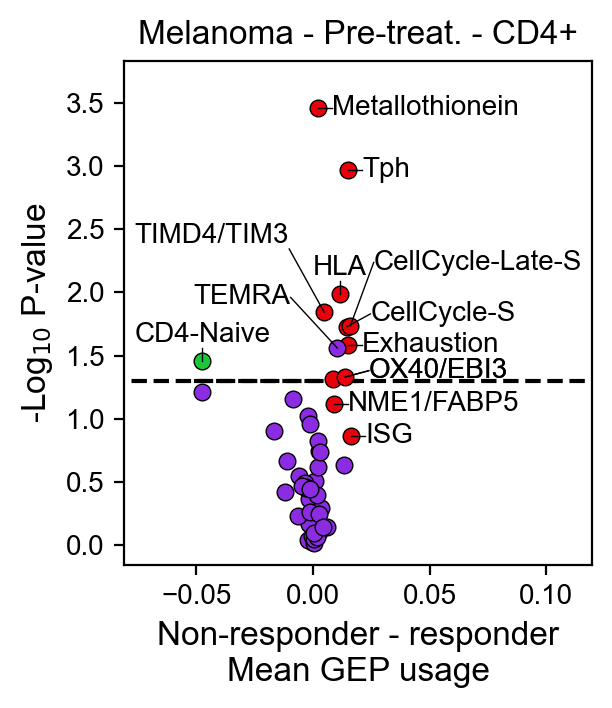

In [210]:
variables = usage.columns
ind = adata_tpm.obs['Multinomial_Label'].isin(['CD4_Naive', 'CD4_CM', 'CD4_EM']) & ~adata_tpm.obs['CD8+CD39+TIM+_Sorted'] & ~adata_tpm.obs['CD8+CD39-TIM-_Sorted']
allcell_usage = usage.loc[ind, :].groupby(adata_tpm.obs.loc[ind, 'sample']).mean()
allcell_act_count = adata_tpm.obs.loc[ind,:].groupby('sample').count()
sample_data_withcount = sample_data.copy()
sample_data_withcount['Count'] = allcell_act_count.loc[sample_data_withcount.index, 'cell_label'].values
allcell_act_pct_merged = pd.merge(left=sample_data_withcount, right=allcell_usage, left_index=True, right_index=True, how='left')

ttest_res = []
r = 'Pre'
ind = allcell_act_pct_merged['timepoint']==r
rdat = allcell_act_pct_merged.loc[ind, :]
ttest_res = run_ttest_all(rdat, variables, g1lab='Non-responder', g2lab='Responder')

(fig,ax) = plt.subplots(1,1, figsize=(3,4), dpi=200, gridspec_kw={'left':.2, 'right':.98, 'bottom':.23, 'top':.86})

'''
ind1 = (ttest_res[ 'Delta']>0) & (ttest_res[ 'logP']>-1*np.log10(.05))
ind2 = (ttest_res[ 'Delta']<0) & (ttest_res[ 'logP']>-1*np.log10(.05))
ind3 = (ttest_res[ 'logP']<-1*np.log10(.05))

labels = ['P < .05, +', 'P < .05, -', 'P > .05']
scat1 = ax.scatter(ttest_res.loc[ind1, 'Delta'], ttest_res.loc[ind1, 'logP'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[3], label=labels[0])
scat2 = ax.scatter(ttest_res.loc[ind2, 'Delta'], ttest_res.loc[ind2, 'logP'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[2], label=labels[1])
scat3 = ax.scatter(ttest_res.loc[ind3, 'Delta'], ttest_res.loc[ind3, 'logP'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[4], label=labels[2])
scats = [scat1, scat2, scat3]
'''

ind1 = ttest_res.index.isin(melanoma_pos)
ind2 = ttest_res.index.isin(melanoma_neg)
ind3 = ttest_res.index.isin(melanoma_un)

ax.scatter(ttest_res.loc[ind1, 'Delta'], ttest_res.loc[ind1, 'logP'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[3])
ax.scatter(ttest_res.loc[ind2, 'Delta'], ttest_res.loc[ind2, 'logP'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[2])
ax.scatter(ttest_res.loc[ind3, 'Delta'], ttest_res.loc[ind3, 'logP'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[4])


ylim = ax.get_ylim()
xlim = ax.get_xlim()
ax.hlines(y=-1*np.log10(.05), xmin=xlim[0]-1, xmax=xlim[1], linestyle='--', zorder=-1, color='k')
ax.set_xlim(xlim)

geps_to_plot = list(ttest_res.index[ttest_res['P']<.05]) + ['OX40/EBI3', 'NME1/FABP5', 'ISG']
xval = 'Delta'
yval = 'logP'
fs = 10
for i,g in enumerate(geps_to_plot):
    #lab = shorten_map[g]
    lab = g

    if g == 'CellCycle-G2M':
        continue
    

    if g in [
             'ICOS/CD38', 'Cytoskeleton']: deltax = -0.003; deltay =0; ha='right'; va='center' ## Left
    elif g in [ 'CellCycle-Late-S']: deltax = 0.01; deltay = .5; ha='left'; va='center' ## Upper-right
    elif g in [ 'CellCycle-S']: deltax = 0.01; deltay = .1; ha='left'; va='center' ## Upper-right
    elif g in [ 'OX40/EBI3']: deltax = 0.01; deltay = .05; ha='left'; va='center' ## Upper-right

    
    elif g in []: deltax = 0.003; deltay = -.1; ha='left'; va='top' ## Lower-right
    elif g in []: deltax = -0.008; deltay =-0.4; ha='right'; va='top' ## Lower-Left
    elif g in ['HLA', 'CD4-Naive']: deltax = 0; deltay =0.1; ha='center'; va='bottom' ## Above
    elif g in []: deltax = 0.003; deltay =-0.1; ha='center'; va='top' ## Below

    elif g in ['TIMD4/TIM3', ]: deltax = -0.015; deltay =0.5; ha='right'; va='bottom' ## Upper-Left
    elif g in ['TEMRA' ]: deltax = -0.02; deltay =0.4; ha='right'; va='center' ## Upper-Left
    else: deltax=.006; deltay=0; ha='left'; va='center' # Default to right

    ax.text(ttest_res.at[g, xval]+deltax, ttest_res.at[g, yval]+deltay, lab, ha=ha, va=va, fontsize=fs)
    ax.plot([ttest_res.at[g, xval], ttest_res.at[g, xval]+deltax], [ttest_res.at[g, yval], ttest_res.at[g, yval]+deltay], color='k', lw=.5)
        

ylim = ax.get_ylim()
xlim = ax.get_xlim()
ax.hlines(y=-1*np.log10(.05), xmin=xlim[0], xmax=xlim[1]+.35, linestyle='--', zorder=-1, color='k')
ax.set_xlim(xlim[0]-.03, xlim[1]+.1)
ax.set_ylim(ylim[0], ylim[1]+.2)

ax.set_title('Melanoma - Pre-treat. - CD4+', fontsize=12) 
ax.set_xlabel('Non-responder - responder\nMean GEP usage', fontsize=12)
ax.set_ylabel('-Log$_{10}$ P-value', fontsize=12)

plt.savefig(os.path.join(figdir, 'CD4_Melanoma_Pre_Usage_Assoc_Volcano.png'))
plt.savefig(os.path.join(figdir, 'CD4_Melanoma_Pre_Usage_Assoc_Volcano.pdf'))

ttest_res.to_csv(os.path.join(outdir, 'CD4_usage_pre_gep_association.tsv'), sep='\t')
ttest_res_pre = ttest_res.copy()

In [211]:
ttest_res_pre.sort_values(by='P')

,GEP,T,P,Delta,Q,logP,logQ,signed_logP
GEP,,,,,,,,
Metallothionein,Metallothionein,4.540209,0.000346,0.002302,0.018016,3.460346,1.744343,3.460346
Tph,Tph,4.056621,0.001069,0.015083,0.027784,2.971184,1.556210,2.971184
HLA,HLA,2.893646,0.010276,0.011411,0.161483,1.988186,0.791873,1.988186
TIMD4/TIM3,TIMD4/TIM3,2.727771,0.014334,0.004777,0.161483,1.843632,0.791873,1.843632
CellCycle-Late-S,CellCycle-Late-S,2.831427,0.018335,0.015998,0.161483,1.736728,0.791873,1.736728
CellCycle-S,CellCycle-S,2.808631,0.018633,0.014569,0.161483,1.729725,0.791873,1.729725
Exhaustion,Exhaustion,2.440572,0.026063,0.014852,0.178795,1.583974,0.747644,1.583974
TEMRA,TEMRA,2.470196,0.027507,0.010392,0.178795,1.560557,0.747644,1.560557
CD4-Naive,CD4-Naive,-2.478334,0.034749,-0.047483,0.200772,1.459058,0.697297,-1.459058


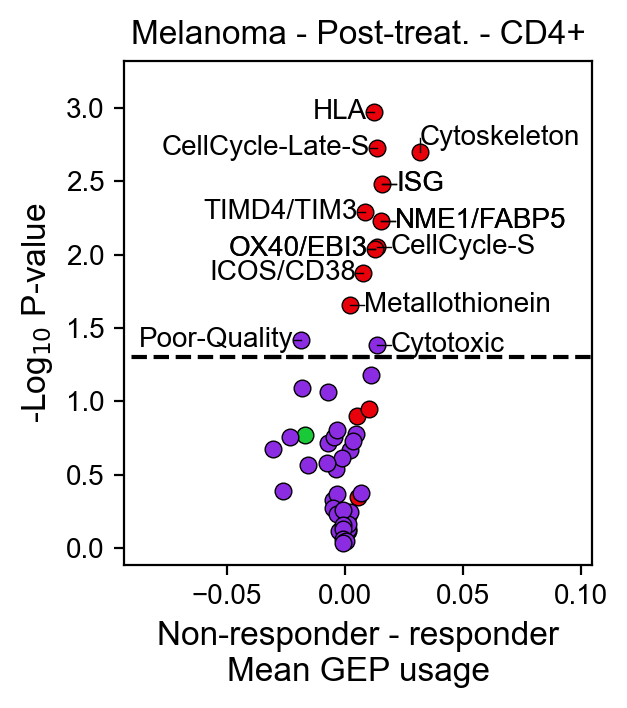

In [212]:
variables = usage.columns
ind = adata_tpm.obs['Multinomial_Label'].isin(['CD4_Naive', 'CD4_CM', 'CD4_EM']) & ~adata_tpm.obs['CD8+CD39+TIM+_Sorted'] & ~adata_tpm.obs['CD8+CD39-TIM-_Sorted']
allcell_usage = usage.loc[ind, :].groupby(adata_tpm.obs.loc[ind, 'sample']).mean()
allcell_act_count = adata_tpm.obs.loc[ind,:].groupby('sample').count()
sample_data_withcount = sample_data.copy()
sample_data_withcount['Count'] = allcell_act_count.loc[sample_data_withcount.index, 'cell_label'].values
allcell_act_pct_merged = pd.merge(left=sample_data_withcount, right=allcell_usage, left_index=True, right_index=True, how='left')

ttest_res = []
r = 'Post'
ind = allcell_act_pct_merged['timepoint']==r
rdat = allcell_act_pct_merged.loc[ind, :]
ttest_res = run_ttest_all(rdat, variables, g1lab='Non-responder', g2lab='Responder')

(fig,ax) = plt.subplots(1,1, figsize=(3,4), dpi=200, gridspec_kw={'left':.2, 'right':.98, 'bottom':.23, 'top':.86})

ind1 = ttest_res.index.isin(melanoma_pos)
ind2 = ttest_res.index.isin(melanoma_neg)
ind3 = ttest_res.index.isin(melanoma_un)

ax.scatter(ttest_res.loc[ind1, 'Delta'], ttest_res.loc[ind1, 'logP'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[3])
ax.scatter(ttest_res.loc[ind2, 'Delta'], ttest_res.loc[ind2, 'logP'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[2])
ax.scatter(ttest_res.loc[ind3, 'Delta'], ttest_res.loc[ind3, 'logP'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[4])


ylim = ax.get_ylim()
xlim = ax.get_xlim()
ax.hlines(y=-1*np.log10(.05), xmin=xlim[0]-1, xmax=xlim[1], linestyle='--', zorder=-1, color='k')
ax.set_xlim(xlim)

geps_to_plot = list(ttest_res.index[ttest_res['P']<.05]) + ['OX40/EBI3', 'NME1/FABP5', 'ISG']
xval = 'Delta'
yval = 'logP'
fs = 10
for i,g in enumerate(geps_to_plot):
    #lab = shorten_map[g]
    lab = g

    if g == 'CellCycle-G2M':
        continue
    

    if g in ['CellCycle-Late-S', 'Poor-Quality',
             'ICOS/CD38', 'TIMD4/TIM3', 'HLA', 'OX40/EBI3']: deltax = -0.003; deltay =0; ha='right'; va='center' ## Left
    elif g in ['Cytoskeleton',]: deltax = 0.00; deltay = .1; ha='left'; va='center' ## Upper-right
    elif g in []: deltax = 0.01; deltay = .1; ha='left'; va='center' ## Upper-right
    elif g in [ 'OX40/EBI3']: deltax = 0.01; deltay = .05; ha='left'; va='center' ## Upper-right

    
    elif g in []: deltax = 0.003; deltay = -.1; ha='left'; va='top' ## Lower-right
    elif g in []: deltax = -0.008; deltay =-0.4; ha='right'; va='top' ## Lower-Left
    elif g in [ 'CD4-Naive']: deltax = 0; deltay =0.1; ha='center'; va='bottom' ## Above
    elif g in []: deltax = 0.003; deltay =-0.1; ha='center'; va='top' ## Below

    elif g in [ ]: deltax = -0.015; deltay =0.5; ha='right'; va='bottom' ## Upper-Left
    elif g in ['TEMRA' ]: deltax = -0.02; deltay =0.4; ha='right'; va='center' ## Upper-Left
    else: deltax=.006; deltay=0; ha='left'; va='center' # Default to right

    ax.text(ttest_res.at[g, xval]+deltax, ttest_res.at[g, yval]+deltay, lab, ha=ha, va=va, fontsize=fs)
    ax.plot([ttest_res.at[g, xval], ttest_res.at[g, xval]+deltax], [ttest_res.at[g, yval], ttest_res.at[g, yval]+deltay], color='k', lw=.5)
        

ylim = ax.get_ylim()
xlim = ax.get_xlim()
ax.hlines(y=-1*np.log10(.05), xmin=xlim[0], xmax=xlim[1]+.35, linestyle='--', zorder=-1, color='k')
ax.set_xlim(xlim[0]-.06, xlim[1]+.07)
ax.set_ylim(ylim[0], ylim[1]+.2)

ax.set_title('Melanoma - Post-treat. - CD4+', fontsize=12) 
ax.set_xlabel('Non-responder - responder\nMean GEP usage', fontsize=12)
ax.set_ylabel('-Log$_{10}$ P-value', fontsize=12)

plt.savefig(os.path.join(figdir, 'CD4_Melanoma_Post_Usage_Assoc_Volcano.png'))
plt.savefig(os.path.join(figdir, 'CD4_Melanoma_Post_Usage_Assoc_Volcano.pdf'))

ttest_res.to_csv(os.path.join(outdir, 'CD4_usage_post_gep_association.tsv'), sep='\t')
ttest_res_post = ttest_res.copy()

In [213]:
ttest_res_post.sort_values(by='P').head(20)

,GEP,T,P,Delta,Q,logP,logQ,signed_logP
GEP,,,,,,,,
HLA,HLA,3.798074,0.001065,0.012408,0.034971,2.972679,1.456289,2.972679
CellCycle-Late-S,CellCycle-Late-S,3.444725,0.001892,0.013844,0.034971,2.722977,1.456289,2.722977
Cytoskeleton,Cytoskeleton,3.521799,0.002018,0.031674,0.034971,2.695172,1.456289,2.695172
ISG,ISG,3.300502,0.003286,0.015839,0.042719,2.483327,1.369384,2.483327
TIMD4/TIM3,TIMD4/TIM3,3.353898,0.005154,0.008457,0.051142,2.287893,1.291220,2.287893
NME1/FABP5,NME1/FABP5,2.995105,0.005901,0.015441,0.051142,2.229072,1.291220,2.229072
CellCycle-S,CellCycle-S,2.827629,0.008826,0.013523,0.059730,2.054248,1.223805,2.054248
OX40/EBI3,OX40/EBI3,3.087902,0.009189,0.012796,0.059730,2.036718,1.223805,2.036718
ICOS/CD38,ICOS/CD38,2.875431,0.013310,0.007897,0.076903,1.875820,1.114059,1.875820


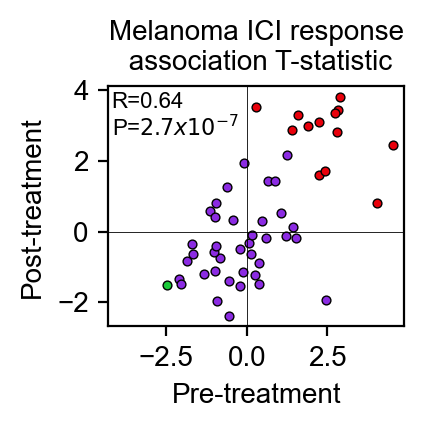

In [220]:
from scipy.stats import binom, pearsonr, fisher_exact

(fig,ax) = plt.subplots(1,1, figsize=(2,2), dpi=200, gridspec_kw={'left':.25, 'right':.99, 'bottom':.2, 'top':.8})

ind1 = ttest_res.index.isin(melanoma_pos)
ind2 = ttest_res.index.isin(melanoma_neg)
ind3 = ttest_res.index.isin(melanoma_un)
ax.scatter(ttest_res_pre.loc[ind1, 'T'], ttest_res_post.loc[ind1, 'T'], s=10, edgecolor='k', lw=.5,color=sns.color_palette("bright")[3])
ax.scatter(ttest_res_pre.loc[ind2, 'T'], ttest_res_post.loc[ind2, 'T'], s=10, edgecolor='k', lw=.5,color=sns.color_palette("bright")[2])
ax.scatter(ttest_res_pre.loc[ind3, 'T'], ttest_res_post.loc[ind3, 'T'], s=10, edgecolor='k', lw=.5,color=sns.color_palette("bright")[4])

xlim = ax.get_xlim()
ylim = ax.get_ylim()
xlim = (-4.3, xlim[1])
ax.hlines(y=0, xmin=xlim[0], xmax=xlim[1], color='k', lw=.3)
ax.vlines(x=0, ymin=ylim[0], ymax=ylim[1], color='k', lw=.3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_xlabel('Pre-treatment', fontsize=10)
ax.set_ylabel('Post-treatment', fontsize=10)
ax.set_title('Melanoma ICI response\n association T-statistic', fontsize=10)
R,P = pearsonr(ttest_res_pre['T'], ttest_res_post['T'])
Pstr = ('P=$%.1e' % P).replace('e-0', 'x10^{-') +'}$'
ax.text(-4.2, 3.5, f'R={R:.2}', fontsize=8)
ax.text(-4.2, 2.7, Pstr, fontsize=8)
plt.savefig(os.path.join(figdir, 'CD4_Melanoma_PreVsPost_Scatter.png'))
plt.savefig(os.path.join(figdir, 'CD4_Melanoma_PreVsPost_Scatter.pdf'))

In [183]:
fisher_exact(pd.crosstab((ttest_res_pre['P']<.05) & (ttest_res_pre['T']>0), (ttest_res_post['P']<.05) & (ttest_res_post['T']>0)))

SignificanceResult(statistic=11.1, pvalue=0.0031884973940956465)

In [147]:
num_equal = (ttest_res_pre['signed_logP'].apply(np.sign) == ttest_res_post['signed_logP'].apply(np.sign)).sum()
num_total = ttest_res_pre['signed_logP'].shape[0]
1 - binom.cdf(num_equal-1, p=.5, n=num_total)

0.0038937181528717613

In [168]:
('P=$%.1e' % P).replace('e-0', 'x10^{') +'}$'

'P=$2.7x10^{7}$'

In [134]:
ttest_res_pre['Direction'] = 'Unsig'

,GEP,T,P,Delta,Q,logP,logQ,signed_logP
GEP,,,,,,,,
CellCycle-G2M,CellCycle-G2M,2.240396,0.048455,0.008640,0.229061,1.314659,0.640049,1.314659
Translation,Translation,-2.093640,0.061034,-0.047734,0.264481,1.214428,0.577606,-1.214428
HLA,HLA,2.893646,0.010276,0.011411,0.161483,1.988186,0.791873,1.988186
ISG,ISG,1.585634,0.137282,0.016413,0.396593,0.862385,0.401654,0.862385
Mito,Mito,-0.549466,0.592594,-0.003243,0.790125,0.227243,0.102304,-0.227243
Doublet-RBC,Doublet-RBC,-0.224606,0.824964,-0.000232,0.925513,0.083565,0.033617,-0.083565
gdT,gdT,1.514970,0.148729,0.002185,0.407049,0.827603,0.390354,0.827603
CellCycle-S,CellCycle-S,2.808631,0.018633,0.014569,0.161483,1.729725,0.791873,1.729725
Cytotoxic,Cytotoxic,1.241741,0.231244,0.013214,0.522099,0.635929,0.282247,0.635929


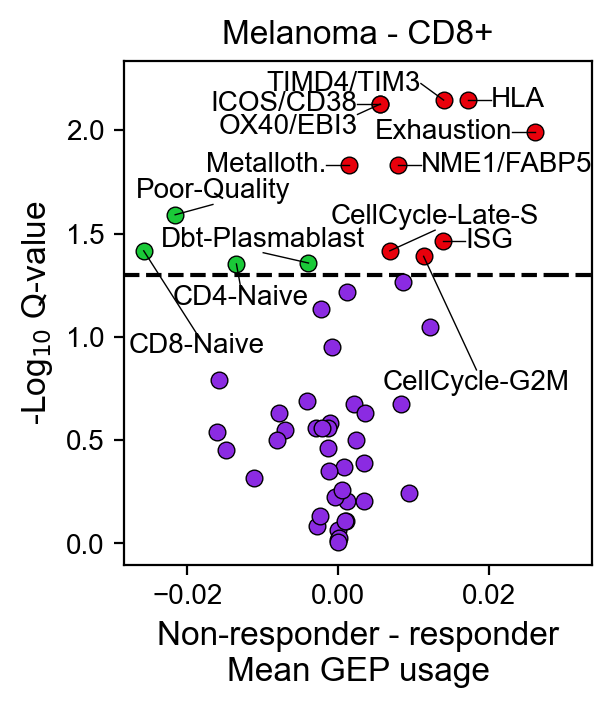

In [221]:
variables = usage.columns
ind = adata_tpm.obs['Multinomial_Label'].isin(['CD8_Naive', 'CD8_CM', 'CD8_EM', 'CD8_TEMRA']) & ~adata_tpm.obs['CD8+CD39+TIM+_Sorted'] & ~adata_tpm.obs['CD8+CD39-TIM-_Sorted']
allcell_usage = usage.loc[ind, :].groupby(adata_tpm.obs.loc[ind, 'sample']).mean()
allcell_act_count = adata_tpm.obs.loc[ind,:].groupby('sample').count()
sample_data_withcount = sample_data.copy()
sample_data_withcount['Count'] = allcell_act_count.loc[sample_data_withcount.index, 'cell_label'].values
allcell_act_pct_merged = pd.merge(left=sample_data_withcount, right=allcell_usage, left_index=True, right_index=True, how='left')

r = 'Both'
rdat = allcell_act_pct_merged.copy()
ttest_res = run_ttest_all(rdat, variables, g1lab='Non-responder', g2lab='Responder')


(fig,ax) = plt.subplots(1,1, figsize=(3,4), dpi=200, gridspec_kw={'left':.2, 'right':.98, 'bottom':.23, 'top':.86})

#ind = (ttest_res[ 'Delta']>0) & (ttest_res[ 'logQ']>-1*np.log10(.05))
#ax.scatter(ttest_res.loc[ind, 'Delta'], ttest_res.loc[ind, 'logQ'], edgecolor='k', lw=.5, color='r')
#ax.scatter(ttest_res.loc[~ind, 'Delta'], ttest_res.loc[~ind, 'logQ'], edgecolor='k', lw=.5, color='b')

ind1 = (ttest_res[ 'Delta']>0) & (ttest_res[ 'logQ']>-1*np.log10(.05))
ind2 = (ttest_res[ 'Delta']<0) & (ttest_res[ 'logQ']>-1*np.log10(.05))
ind3 = (ttest_res[ 'logQ']<-1*np.log10(.05))

labels = ['FDR < .05, +', 'FDR < .05, -', 'FDR > .05']
scat1 = ax.scatter(ttest_res.loc[ind1, 'Delta'], ttest_res.loc[ind1, 'logQ'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[3], label=labels[0])
scat2 = ax.scatter(ttest_res.loc[ind2, 'Delta'], ttest_res.loc[ind2, 'logQ'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[2], label=labels[1])
scat3 = ax.scatter(ttest_res.loc[ind3, 'Delta'], ttest_res.loc[ind3, 'logQ'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[4], label=labels[2])
scats = [scat1, scat2, scat3]

ylim = ax.get_ylim()
xlim = ax.get_xlim()
ax.hlines(y=-1*np.log10(.05), xmin=xlim[0], xmax=xlim[1], linestyle='--', zorder=-1, color='k')
ax.set_xlim(xlim)

geps_to_plot = list(ttest_res.index[ttest_res['Q']<.05])
xval = 'Delta'
yval = 'logQ'
fs = 10
for i,g in enumerate(geps_to_plot):
    #lab = shorten_map[g]
    lab = g.replace('Doublet', 'Dbt').replace('Metallothionein', 'Metalloth.')

    if g == 'Doublet-Bcell':
        continue
    
    if g in [ 'Metallothionein', 'ICOS/CD38',
              'Cytoskeleton',  'Exhaustion']: deltax = -0.003; deltay =0; ha='right'; va='center' ## Left
    elif g in ['Doublet-Plasmablast']: deltax = -0.006; deltay = .05; ha='center'; va='bottom' ## Upper-left
    elif g in ['CellCycle-Late-S']: deltax = 0.006; deltay = .1; ha='center'; va='bottom' ## Upper-right



    
    elif g in ['CD8-Naive', ]: deltax = 0.007; deltay = -.4; ha='center'; va='top' ## Lower-right
    elif g in ['CellCycle-G2M']: deltax = 0.007; deltay = -.55; ha='center'; va='top' ## Lower-right

    elif g in ['OX40/EBI3', 'Doublet-Bcell']: deltax = -0.003; deltay =-0.05; ha='right'; va='top' ## Lower-Left
    elif g in ['CD4-Naive']: deltax = 0.0005; deltay =-0.1; ha='center'; va='top' ## Lower-Left 2

    elif g in ['Poor-Quality']: deltax = 0.005; deltay =0.05; ha='center'; va='bottom' ## Above
    elif g in []: deltax = -.006; deltay =-0.3; ha='center'; va='top' ## Below

    elif g in [ ]: deltax = -0.003; deltay =0.05; ha='right'; va='bottom' ## Upper-Left
    elif g in ['TIMD4/TIM3']: deltax = -0.003; deltay =0.08; ha='right'; va='center' ## Upper-Left
    else: deltax=.003; deltay=0; ha='left'; va='center' # Default to right

    ax.text(ttest_res.at[g, xval]+deltax, ttest_res.at[g, yval]+deltay, lab, ha=ha, va=va, fontsize=fs)
    ax.plot([ttest_res.at[g, xval], ttest_res.at[g, xval]+deltax], [ttest_res.at[g, yval], ttest_res.at[g, yval]+deltay], color='k', lw=.5)
        

ylim = ax.get_ylim()
xlim = ax.get_xlim()
ax.hlines(y=-1*np.log10(.05), xmin=xlim[0]+.1, xmax=xlim[1], linestyle='--', zorder=-1, color='k')
ax.set_xlim(xlim[0], xlim[1]+.005)
ax.set_title('Melanoma - CD8+', fontsize=12) 
ax.set_xlabel('Non-responder - responder\nMean GEP usage', fontsize=12)
ax.set_ylabel('-Log$_{10}$ Q-value', fontsize=12)

#plt.savefig(os.path.join(figdir, 'CD4_Usage_Assoc_Volcano.png'))
#plt.savefig(os.path.join(figdir, 'CD4_Usage_Assoc_Volcano.pdf'))

ttest_res_CD8 = ttest_res

plt.savefig(os.path.join(figdir, 'CD8_Usage_Assoc_Volcano.png'))
plt.savefig(os.path.join(figdir, 'CD8_Usage_Assoc_Volcano.pdf'))

ttest_res.to_csv(os.path.join(outdir, 'CD8_usage_both_gep_association.tsv'), sep='\t')

In [121]:
ttest_res_post.sort_values(by='P').head(20)

,GEP,T,P,Delta,Q,logP,logQ,signed_logP
GEP,,,,,,,,
HLA,HLA,3.798074,0.001065,0.012408,0.034971,2.972679,1.456289,2.972679
CellCycle-Late-S,CellCycle-Late-S,3.444725,0.001892,0.013844,0.034971,2.722977,1.456289,2.722977
Cytoskeleton,Cytoskeleton,3.521799,0.002018,0.031674,0.034971,2.695172,1.456289,2.695172
ISG,ISG,3.300502,0.003286,0.015839,0.042719,2.483327,1.369384,2.483327
TIMD4/TIM3,TIMD4/TIM3,3.353898,0.005154,0.008457,0.051142,2.287893,1.291220,2.287893
NME1/FABP5,NME1/FABP5,2.995105,0.005901,0.015441,0.051142,2.229072,1.291220,2.229072
CellCycle-S,CellCycle-S,2.827629,0.008826,0.013523,0.059730,2.054248,1.223805,2.054248
OX40/EBI3,OX40/EBI3,3.087902,0.009189,0.012796,0.059730,2.036718,1.223805,2.036718
ICOS/CD38,ICOS/CD38,2.875431,0.013310,0.007897,0.076903,1.875820,1.114059,1.875820


In [104]:
melanoma_pos_cd8 = ttest_res.index[ind1]
melanoma_neg_cd8 = ttest_res.index[ind2]
melanoma_un_cd8 = ttest_res.index[ind3]

In [105]:
melanoma_pos_cd8

Index(['CellCycle-G2M', 'HLA', 'ISG', 'NME1/FABP5', 'CellCycle-Late-S',
       'Metallothionein', 'TIMD4/TIM3', 'ICOS/CD38', 'OX40/EBI3',
       'Exhaustion'],
      dtype='object', name='GEP')

In [106]:
melanoma_neg_cd8

Index(['CD4-Naive', 'Poor-Quality', 'CD8-Naive', 'Doublet-Plasmablast'], dtype='object', name='GEP')

In [107]:
melanoma_un_cd8

Index(['Translation', 'Mito', 'Doublet-RBC', 'gdT', 'CellCycle-S', 'Cytotoxic',
       'Doublet-Platelet', 'Th22', 'MAIT', 'Cytoskeleton', 'Heatshock',
       'Multi-Cytokine', 'TEMRA', 'Doublet-Myeloid', 'CD4-CM', 'IEG', 'CD8-EM',
       'IEG2', 'Treg', 'Th17-Resting', 'RGCC/MYADM', 'BCL2/FAM13A',
       'IL10/IL19', 'Th2-Activated', 'Th2-Resting', 'Doublet-Bcell',
       'Th1-Like', 'CTLA4/CD38', 'CD8-Trm', 'Th17-Activated', 'Tfh-2',
       'CD172a/MERTK', 'IEG3', 'Doublet-Fibroblast', 'SOX4/TOX2',
       'CD40LG/TXNIP', 'Tph', 'Tfh-1'],
      dtype='object', name='GEP')

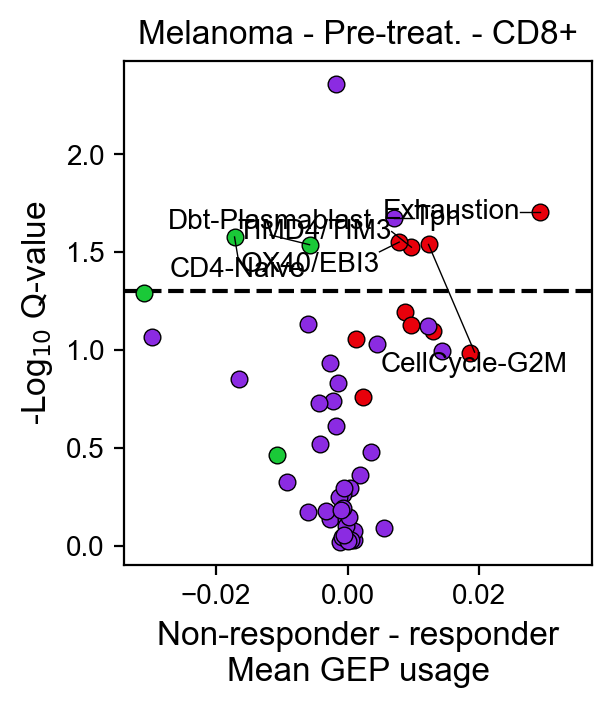

In [113]:
variables = usage.columns
ind = adata_tpm.obs['Multinomial_Label'].isin(['CD8_Naive', 'CD8_CM', 'CD8_EM', 'CD8_TEMRA']) & ~adata_tpm.obs['CD8+CD39+TIM+_Sorted'] & ~adata_tpm.obs['CD8+CD39-TIM-_Sorted']
allcell_usage = usage.loc[ind, :].groupby(adata_tpm.obs.loc[ind, 'sample']).mean()
allcell_act_count = adata_tpm.obs.loc[ind,:].groupby('sample').count()
sample_data_withcount = sample_data.copy()
sample_data_withcount['Count'] = allcell_act_count.loc[sample_data_withcount.index, 'cell_label'].values
allcell_act_pct_merged = pd.merge(left=sample_data_withcount, right=allcell_usage, left_index=True, right_index=True, how='left')

r = 'Pre'
ind = allcell_act_pct_merged['timepoint']==r
rdat = allcell_act_pct_merged.loc[ind, :]
ttest_res = run_ttest_all(rdat, variables, g1lab='Non-responder', g2lab='Responder')


(fig,ax) = plt.subplots(1,1, figsize=(3,4), dpi=200, gridspec_kw={'left':.2, 'right':.98, 'bottom':.23, 'top':.86})

#ind = (ttest_res[ 'Delta']>0) & (ttest_res[ 'logQ']>-1*np.log10(.05))
#ax.scatter(ttest_res.loc[ind, 'Delta'], ttest_res.loc[ind, 'logQ'], edgecolor='k', lw=.5, color='r')
#ax.scatter(ttest_res.loc[~ind, 'Delta'], ttest_res.loc[~ind, 'logQ'], edgecolor='k', lw=.5, color='b')

ind1 = ttest_res.index.isin(melanoma_pos_cd8)
ind2 = ttest_res.index.isin(melanoma_neg_cd8)
ind3 = ttest_res.index.isin(melanoma_un_cd8)

ax.scatter(ttest_res.loc[ind1, 'Delta'], ttest_res.loc[ind1, 'logP'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[3])
ax.scatter(ttest_res.loc[ind2, 'Delta'], ttest_res.loc[ind2, 'logP'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[2])
ax.scatter(ttest_res.loc[ind3, 'Delta'], ttest_res.loc[ind3, 'logP'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[4])

ylim = ax.get_ylim()
xlim = ax.get_xlim()
ax.hlines(y=-1*np.log10(.05), xmin=xlim[0], xmax=xlim[1], linestyle='--', zorder=-1, color='k')
ax.set_xlim(xlim)

geps_to_plot = list(ttest_res.index[ttest_res['P']<.05])
xval = 'Delta'
yval = 'logP'
fs = 10
for i,g in enumerate(geps_to_plot):
    #lab = shorten_map[g]
    lab = g.replace('Doublet', 'Dbt').replace('Metallothionein', 'Metalloth.')

    if g == 'Doublet-Bcell':
        continue
    
    if g in [ 'Metallothionein', 'ICOS/CD38',
              'Cytoskeleton',  'Exhaustion']: deltax = -0.003; deltay =0; ha='right'; va='center' ## Left
    elif g in ['Doublet-Plasmablast']: deltax = -0.006; deltay = .05; ha='center'; va='bottom' ## Upper-left
    elif g in ['CellCycle-Late-S']: deltax = 0.006; deltay = .1; ha='center'; va='bottom' ## Upper-right



    
    elif g in ['CD8-Naive', ]: deltax = 0.007; deltay = -.4; ha='center'; va='top' ## Lower-right
    elif g in ['CellCycle-G2M']: deltax = 0.007; deltay = -.55; ha='center'; va='top' ## Lower-right

    elif g in ['OX40/EBI3', 'Doublet-Bcell']: deltax = -0.003; deltay =-0.05; ha='right'; va='top' ## Lower-Left
    elif g in ['CD4-Naive']: deltax = 0.0005; deltay =-0.1; ha='center'; va='top' ## Lower-Left 2

    elif g in ['Poor-Quality']: deltax = 0.005; deltay =0.05; ha='center'; va='bottom' ## Above
    elif g in []: deltax = -.006; deltay =-0.3; ha='center'; va='top' ## Below

    elif g in [ ]: deltax = -0.003; deltay =0.05; ha='right'; va='bottom' ## Upper-Left
    elif g in ['TIMD4/TIM3']: deltax = -0.003; deltay =0.08; ha='right'; va='center' ## Upper-Left
    else: deltax=.003; deltay=0; ha='left'; va='center' # Default to right

    ax.text(ttest_res.at[g, xval]+deltax, ttest_res.at[g, yval]+deltay, lab, ha=ha, va=va, fontsize=fs)
    ax.plot([ttest_res.at[g, xval], ttest_res.at[g, xval]+deltax], [ttest_res.at[g, yval], ttest_res.at[g, yval]+deltay], color='k', lw=.5)
        

ylim = ax.get_ylim()
xlim = ax.get_xlim()
ax.hlines(y=-1*np.log10(.05), xmin=xlim[0]+.1, xmax=xlim[1], linestyle='--', zorder=-1, color='k')
ax.set_xlim(xlim[0], xlim[1]+.005)
ax.set_title('Melanoma - Pre-treat. - CD8+', fontsize=12) 
ax.set_xlabel('Non-responder - responder\nMean GEP usage', fontsize=12)
ax.set_ylabel('-Log$_{10}$ Q-value', fontsize=12)

#plt.savefig(os.path.join(figdir, 'CD4_Usage_Assoc_Volcano.png'))
#plt.savefig(os.path.join(figdir, 'CD4_Usage_Assoc_Volcano.pdf'))

ttest_res_CD8 = ttest_res

plt.savefig(os.path.join(figdir, 'CD8_Usage_Assoc_Pre_Volcano.png'))
plt.savefig(os.path.join(figdir, 'CD8_Usage_Assoc_Pre_Volcano.pdf'))

ttest_res.to_csv(os.path.join(outdir, 'CD8_usage_pre_gep_association.tsv'), sep='\t')

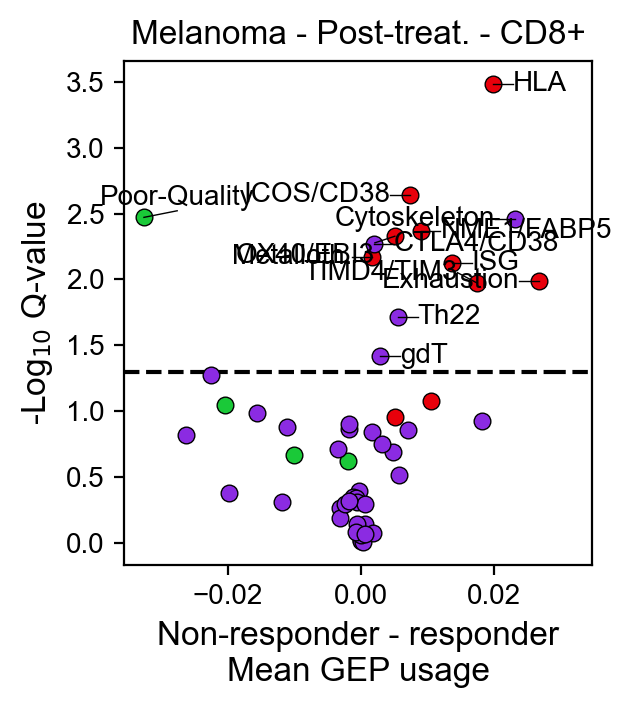

In [114]:
variables = usage.columns
ind = adata_tpm.obs['Multinomial_Label'].isin(['CD8_Naive', 'CD8_CM', 'CD8_EM', 'CD8_TEMRA']) & ~adata_tpm.obs['CD8+CD39+TIM+_Sorted'] & ~adata_tpm.obs['CD8+CD39-TIM-_Sorted']
allcell_usage = usage.loc[ind, :].groupby(adata_tpm.obs.loc[ind, 'sample']).mean()
allcell_act_count = adata_tpm.obs.loc[ind,:].groupby('sample').count()
sample_data_withcount = sample_data.copy()
sample_data_withcount['Count'] = allcell_act_count.loc[sample_data_withcount.index, 'cell_label'].values
allcell_act_pct_merged = pd.merge(left=sample_data_withcount, right=allcell_usage, left_index=True, right_index=True, how='left')

r = 'Post'
ind = allcell_act_pct_merged['timepoint']==r
rdat = allcell_act_pct_merged.loc[ind, :]
ttest_res = run_ttest_all(rdat, variables, g1lab='Non-responder', g2lab='Responder')


(fig,ax) = plt.subplots(1,1, figsize=(3,4), dpi=200, gridspec_kw={'left':.2, 'right':.98, 'bottom':.23, 'top':.86})

#ind = (ttest_res[ 'Delta']>0) & (ttest_res[ 'logQ']>-1*np.log10(.05))
#ax.scatter(ttest_res.loc[ind, 'Delta'], ttest_res.loc[ind, 'logQ'], edgecolor='k', lw=.5, color='r')
#ax.scatter(ttest_res.loc[~ind, 'Delta'], ttest_res.loc[~ind, 'logQ'], edgecolor='k', lw=.5, color='b')

ind1 = ttest_res.index.isin(melanoma_pos_cd8)
ind2 = ttest_res.index.isin(melanoma_neg_cd8)
ind3 = ttest_res.index.isin(melanoma_un_cd8)

ax.scatter(ttest_res.loc[ind1, 'Delta'], ttest_res.loc[ind1, 'logP'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[3])
ax.scatter(ttest_res.loc[ind2, 'Delta'], ttest_res.loc[ind2, 'logP'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[2])
ax.scatter(ttest_res.loc[ind3, 'Delta'], ttest_res.loc[ind3, 'logP'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[4])

ylim = ax.get_ylim()
xlim = ax.get_xlim()
ax.hlines(y=-1*np.log10(.05), xmin=xlim[0], xmax=xlim[1], linestyle='--', zorder=-1, color='k')
ax.set_xlim(xlim)

geps_to_plot = list(ttest_res.index[ttest_res['P']<.05])
xval = 'Delta'
yval = 'logP'
fs = 10
for i,g in enumerate(geps_to_plot):
    #lab = shorten_map[g]
    lab = g.replace('Doublet', 'Dbt').replace('Metallothionein', 'Metalloth.')

    if g == 'Doublet-Bcell':
        continue
    
    if g in [ 'Metallothionein', 'ICOS/CD38',
              'Cytoskeleton',  'Exhaustion']: deltax = -0.003; deltay =0; ha='right'; va='center' ## Left
    elif g in ['Doublet-Plasmablast']: deltax = -0.006; deltay = .05; ha='center'; va='bottom' ## Upper-left
    elif g in ['CellCycle-Late-S']: deltax = 0.006; deltay = .1; ha='center'; va='bottom' ## Upper-right



    
    elif g in ['CD8-Naive', ]: deltax = 0.007; deltay = -.4; ha='center'; va='top' ## Lower-right
    elif g in ['CellCycle-G2M']: deltax = 0.007; deltay = -.55; ha='center'; va='top' ## Lower-right

    elif g in ['OX40/EBI3', 'Doublet-Bcell']: deltax = -0.003; deltay =-0.05; ha='right'; va='top' ## Lower-Left
    elif g in ['CD4-Naive']: deltax = 0.0005; deltay =-0.1; ha='center'; va='top' ## Lower-Left 2

    elif g in ['Poor-Quality']: deltax = 0.005; deltay =0.05; ha='center'; va='bottom' ## Above
    elif g in []: deltax = -.006; deltay =-0.3; ha='center'; va='top' ## Below

    elif g in [ ]: deltax = -0.003; deltay =0.05; ha='right'; va='bottom' ## Upper-Left
    elif g in ['TIMD4/TIM3']: deltax = -0.003; deltay =0.08; ha='right'; va='center' ## Upper-Left
    else: deltax=.003; deltay=0; ha='left'; va='center' # Default to right

    ax.text(ttest_res.at[g, xval]+deltax, ttest_res.at[g, yval]+deltay, lab, ha=ha, va=va, fontsize=fs)
    ax.plot([ttest_res.at[g, xval], ttest_res.at[g, xval]+deltax], [ttest_res.at[g, yval], ttest_res.at[g, yval]+deltay], color='k', lw=.5)
        

ylim = ax.get_ylim()
xlim = ax.get_xlim()
ax.hlines(y=-1*np.log10(.05), xmin=xlim[0]+.1, xmax=xlim[1], linestyle='--', zorder=-1, color='k')
ax.set_xlim(xlim[0], xlim[1]+.005)
ax.set_title('Melanoma - Post-treat. - CD8+', fontsize=12) 
ax.set_xlabel('Non-responder - responder\nMean GEP usage', fontsize=12)
ax.set_ylabel('-Log$_{10}$ Q-value', fontsize=12)

#plt.savefig(os.path.join(figdir, 'CD4_Usage_Assoc_Volcano.png'))
#plt.savefig(os.path.join(figdir, 'CD4_Usage_Assoc_Volcano.pdf'))

ttest_res_CD8 = ttest_res

plt.savefig(os.path.join(figdir, 'CD8_Usage_Assoc_Post_Volcano.png'))
plt.savefig(os.path.join(figdir, 'CD8_Usage_Assoc_Post_Volcano.pdf'))

ttest_res.to_csv(os.path.join(outdir, 'CD8_usage_post_gep_association.tsv'), sep='\t')

Text(0, 0.5, '-Log$_{10}$ Q-value')

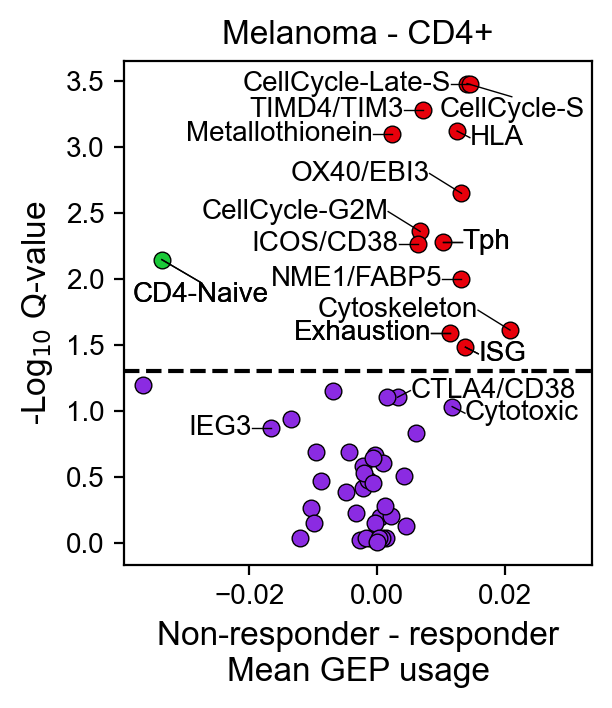

In [251]:
variables = usage.columns
ind = adata_tpm.obs['Multinomial_Label'].isin(['CD4_Naive', 'CD4_CM', 'CD4_EM']) & ~adata_tpm.obs['CD8+CD39+TIM+_Sorted'] & ~adata_tpm.obs['CD8+CD39-TIM-_Sorted']
allcell_usage = usage.loc[ind, :].groupby(adata_tpm.obs.loc[ind, 'sample']).mean()
allcell_act_count = adata_tpm.obs.loc[ind,:].groupby('sample').count()
sample_data_withcount = sample_data.copy()
sample_data_withcount['Count'] = allcell_act_count.loc[sample_data_withcount.index, 'cell_label'].values
allcell_act_pct_merged = pd.merge(left=sample_data_withcount, right=allcell_usage, left_index=True, right_index=True, how='left')

r = 'Both'
rdat = allcell_act_pct_merged.copy()
ttest_res = run_ranksums_all(rdat, variables, g1lab='Non-responder', g2lab='Responder')

(fig,ax) = plt.subplots(1,1, figsize=(3,4), dpi=200, gridspec_kw={'left':.2, 'right':.98, 'bottom':.23, 'top':.86})

ind1 = (ttest_res[ 'Delta']>0) & (ttest_res[ 'logQ']>-1*np.log10(.05))
ind2 = (ttest_res[ 'Delta']<0) & (ttest_res[ 'logQ']>-1*np.log10(.05))
ind3 = (ttest_res[ 'logQ']<-1*np.log10(.05))

labels = ['FDR < .05, +', 'FDR < .05, -', 'FDR > .05']
scat1 = ax.scatter(ttest_res.loc[ind1, 'Delta'], ttest_res.loc[ind1, 'logQ'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[3], label=labels[0])
scat2 = ax.scatter(ttest_res.loc[ind2, 'Delta'], ttest_res.loc[ind2, 'logQ'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[2], label=labels[1])
scat3 = ax.scatter(ttest_res.loc[ind3, 'Delta'], ttest_res.loc[ind3, 'logQ'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[4], label=labels[2])
scats = [scat1, scat2, scat3]

ylim = ax.get_ylim()
xlim = ax.get_xlim()
ax.hlines(y=-1*np.log10(.05), xmin=xlim[0], xmax=xlim[1], linestyle='--', zorder=-1, color='k')
ax.set_xlim(xlim)

geps_to_plot = list(ttest_res.index[ttest_res['Q']<.05]) + ['ISG', 'CD4-Naive', 'Tph', 'Exhaustion']
xval = 'Delta'
yval = 'logQ'
fs = 10
for i,g in enumerate(list(geps_to_plot) + ['CTLA4/CD38', 'Cytotoxic', 'IEG3']):
    #lab = shorten_map[g]
    lab = g


    
    if g in [ 'CellCycle-Late-S', 'Metallothionein', 'TIMD4/TIM3', 'NME1/FABP5', 'IEG3',
            'Exhaustion', 'ICOS/CD38']: deltax = -0.003; deltay =0; ha='right'; va='center' ## Left
    elif g in []: deltax = 0.002; deltay = .05; ha='left'; va='center' ## Upper-right
    elif g in ['CTLA4/CD38']: deltax = 0.002; deltay = .05; ha='left'; va='center' ## Upper-right

    elif g in ['ISG', 'Cytotoxic', 'HLA' ]: deltax = 0.002; deltay = -.05; ha='left'; va='center' ## Lower-right
    elif g in ['CD4-Naive' ]: deltax = 0.006; deltay = -.17; ha='center'; va='top' ## Lower-right
    elif g in []: deltax = -0.003; deltay =-0.05; ha='right'; va='top' ## Lower-Left
    elif g in []: deltax = 0; deltay =0.05; ha='center'; va='bottom' ## Above
    elif g in ['CellCycle-S']: deltax = 0.007; deltay =-0.1; ha='center'; va='top' ## Below

    elif g in []: deltax = -0.005; deltay =0.1; ha='right'; va='bottom' ## Upper-Left
    elif g in [ 'Cytoskeleton', 'CellCycle-G2M', 'OX40/EBI3',]: deltax = -0.005; deltay =0.15; ha='right'; va='center' ## Upper-Left
    elif g in []: deltax = -0.005; deltay =0.05; ha='right'; va='center' ## Upper-Left

    else: deltax=.003; deltay=0; ha='left'; va='center' # Default to right

    ax.text(ttest_res.at[g, xval]+deltax, ttest_res.at[g, yval]+deltay, lab, ha=ha, va=va, fontsize=fs)
    ax.plot([ttest_res.at[g, xval], ttest_res.at[g, xval]+deltax], [ttest_res.at[g, yval], ttest_res.at[g, yval]+deltay], color='k', lw=.5)
        

ylim = ax.get_ylim()
xlim = ax.get_xlim()
ax.hlines(y=-1*np.log10(.05), xmin=xlim[0]+.1, xmax=xlim[1], linestyle='--', zorder=-1, color='k')
ax.set_xlim(xlim[0], xlim[1]+.01)
ax.set_title('Melanoma - CD4+', fontsize=12) 
ax.set_xlabel('Non-responder - responder\nMean GEP usage', fontsize=12)
ax.set_ylabel('-Log$_{10}$ Q-value', fontsize=12)

#plt.savefig(os.path.join(figdir, 'CD4_Melanoma_Usage_Assoc_Volcano.png'))
#plt.savefig(os.path.join(figdir, 'CD4_Melanoma_Usage_Assoc_Volcano.pdf'))

#ttest_res.to_csv(os.path.join(outdir, 'CD4_melanoma_usage_both_gep_association.tsv'), sep='\t')

In [252]:
ttest_res.sort_values(by='P')

,GEP,T,P,Delta,Q,logP,logQ,signed_logP
GEP,,,,,,,,
CellCycle-Late-S,CellCycle-Late-S,4.494624,0.000007,0.014550,0.000330,5.156810,3.481364,5.156810
CellCycle-S,CellCycle-S,4.365282,0.000013,0.014112,0.000330,4.896337,3.481364,4.896337
TIMD4/TIM3,TIMD4/TIM3,4.171269,0.000030,0.007248,0.000525,4.518690,3.279808,4.518690
HLA,HLA,4.020371,0.000058,0.012547,0.000755,4.235774,3.121831,4.235774
Metallothionein,Metallothionein,3.955700,0.000076,0.002312,0.000794,4.117414,3.100380,4.117414
OX40/EBI3,OX40/EBI3,3.653903,0.000258,0.013235,0.002238,3.587902,2.650050,3.587902
CellCycle-G2M,CellCycle-G2M,3.438333,0.000585,0.006749,0.004348,3.232616,2.361711,3.232616
Tph,Tph,3.352105,0.000802,0.010357,0.005213,3.095828,2.282915,3.095828
ICOS/CD38,ICOS/CD38,3.308992,0.000936,0.006388,0.005410,3.028573,2.266812,3.028573


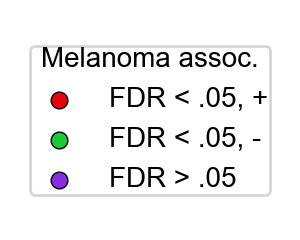

In [253]:
(fig,ax) = plt.subplots(1,1, figsize=(1.3, 1), dpi=200, gridspec_kw={'left':0, 'right':1, 'top':1, 'bottom':0})
legend = ax.legend(handles=scats, labels=labels, fontsize=10, title='Melanoma assoc.', loc='center', borderpad=0.06, title_fontsize=10)
ax.axis('off')
fig.patch.set_alpha(0.0)
plt.savefig(os.path.join(figdir, 'CD4_Melanoma_Usage_Pre_Assoc_Volcano_Legend.png'))
plt.savefig(os.path.join(figdir, 'CD4_Melanoma_Usage_Pre_Assoc_Volcano_Legend.pdf'))

In [254]:
melanoma_pos_pre = ttest_res.index[ind1]
melanoma_neg_pre = ttest_res.index[ind2]
melanoma_un_pre = ttest_res.index[ind3]

In [255]:
melanoma_pos_pre

Index(['CellCycle-G2M', 'HLA', 'ISG', 'CellCycle-S', 'NME1/FABP5',
       'CellCycle-Late-S', 'Cytoskeleton', 'Metallothionein', 'TIMD4/TIM3',
       'ICOS/CD38', 'OX40/EBI3', 'Tph', 'Exhaustion'],
      dtype='object', name='GEP')

In [630]:
melanoma_neg_pre

Index(['CD4-Naive'], dtype='object', name='GEP')

In [631]:
melanoma_un_pre

Index(['Translation', 'ISG', 'Mito', 'Doublet-RBC', 'gdT', 'Cytotoxic',
       'Doublet-Platelet', 'NME1/FABP5', 'Th22', 'MAIT', 'Cytoskeleton',
       'Heatshock', 'Multi-Cytokine', 'Doublet-Myeloid', 'CD4-CM', 'IEG',
       'CD8-EM', 'IEG2', 'Treg', 'Th17-Resting', 'Poor-Quality', 'CD8-Naive',
       'RGCC/MYADM', 'Doublet-Plasmablast', 'BCL2/FAM13A', 'IL10/IL19',
       'Th2-Activated', 'Th2-Resting', 'ICOS/CD38', 'Doublet-Bcell',
       'Th1-Like', 'CTLA4/CD38', 'CD8-Trm', 'Th17-Activated', 'Tfh-2',
       'CD172a/MERTK', 'IEG3', 'Doublet-Fibroblast', 'SOX4/TOX2',
       'CD40LG/TXNIP', 'Tfh-1'],
      dtype='object', name='GEP')

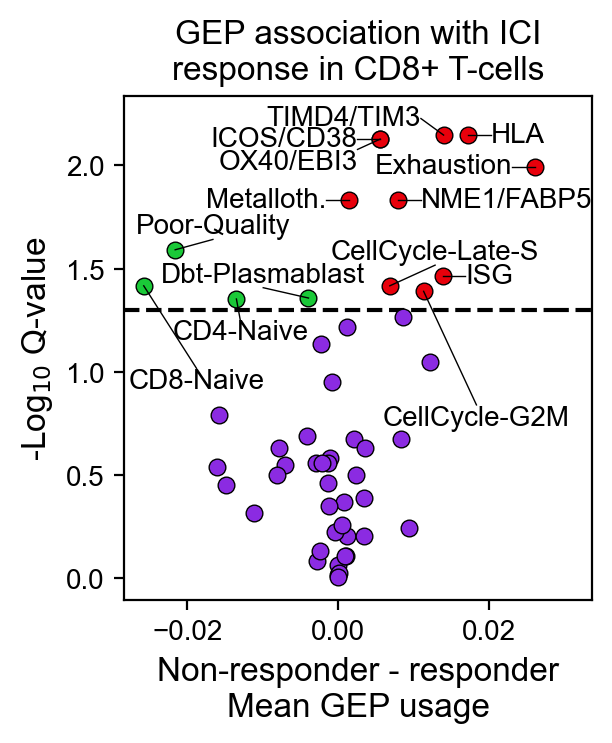

In [99]:
variables = usage.columns
ind = adata_tpm.obs['Multinomial_Label'].isin(['CD8_Naive', 'CD8_CM', 'CD8_EM', 'CD8_TEMRA']) & ~adata_tpm.obs['CD8+CD39+TIM+_Sorted'] & ~adata_tpm.obs['CD8+CD39-TIM-_Sorted']
allcell_usage = usage.loc[ind, :].groupby(adata_tpm.obs.loc[ind, 'sample']).mean()
allcell_act_count = adata_tpm.obs.loc[ind,:].groupby('sample').count()
sample_data_withcount = sample_data.copy()
sample_data_withcount['Count'] = allcell_act_count.loc[sample_data_withcount.index, 'cell_label'].values
allcell_act_pct_merged = pd.merge(left=sample_data_withcount, right=allcell_usage, left_index=True, right_index=True, how='left')

r = 'Both'
rdat = allcell_act_pct_merged.copy()
ttest_res = run_ttest_all(rdat, variables, g1lab='Non-responder', g2lab='Responder')


(fig,ax) = plt.subplots(1,1, figsize=(3,4), dpi=200, gridspec_kw={'left':.2, 'right':.98, 'bottom':.23, 'top':.86})

ind1 = (ttest_res[ 'Delta']>0) & (ttest_res[ 'logQ']>-1*np.log10(.05))
ind2 = (ttest_res[ 'Delta']<0) & (ttest_res[ 'logQ']>-1*np.log10(.05))
ind3 = (ttest_res[ 'logQ']<-1*np.log10(.05))

labels = ['FDR < .05, +', 'FDR < .05, -', 'FDR > .05']
scat1 = ax.scatter(ttest_res.loc[ind1, 'Delta'], ttest_res.loc[ind1, 'logQ'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[3], label=labels[0])
scat2 = ax.scatter(ttest_res.loc[ind2, 'Delta'], ttest_res.loc[ind2, 'logQ'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[2], label=labels[1])
scat3 = ax.scatter(ttest_res.loc[ind3, 'Delta'], ttest_res.loc[ind3, 'logQ'], edgecolor='k', lw=.5, color=sns.color_palette("bright")[4], label=labels[2])
scats = [scat1, scat2, scat3]

ylim = ax.get_ylim()
xlim = ax.get_xlim()
ax.hlines(y=-1*np.log10(.05), xmin=xlim[0], xmax=xlim[1], linestyle='--', zorder=-1, color='k')
ax.set_xlim(xlim)

geps_to_plot = list(ttest_res.index[ttest_res['Q']<.05])
xval = 'Delta'
yval = 'logQ'
fs = 10
for i,g in enumerate(geps_to_plot):
    #lab = shorten_map[g]
    lab = g.replace('Doublet', 'Dbt').replace('Metallothionein', 'Metalloth.')

    if g == 'Doublet-Bcell':
        continue
    
    if g in [ 'Metallothionein', 'ICOS/CD38',
              'Cytoskeleton',  'Exhaustion']: deltax = -0.003; deltay =0; ha='right'; va='center' ## Left
    elif g in ['Doublet-Plasmablast']: deltax = -0.006; deltay = .05; ha='center'; va='bottom' ## Upper-left
    elif g in ['CellCycle-Late-S']: deltax = 0.006; deltay = .1; ha='center'; va='bottom' ## Upper-right



    
    elif g in ['CD8-Naive', ]: deltax = 0.007; deltay = -.4; ha='center'; va='top' ## Lower-right
    elif g in ['CellCycle-G2M']: deltax = 0.007; deltay = -.55; ha='center'; va='top' ## Lower-right

    elif g in ['OX40/EBI3', 'Doublet-Bcell']: deltax = -0.003; deltay =-0.05; ha='right'; va='top' ## Lower-Left
    elif g in ['CD4-Naive']: deltax = 0.0005; deltay =-0.1; ha='center'; va='top' ## Lower-Left 2

    elif g in ['Poor-Quality']: deltax = 0.005; deltay =0.05; ha='center'; va='bottom' ## Above
    elif g in []: deltax = -.006; deltay =-0.3; ha='center'; va='top' ## Below

    elif g in [ ]: deltax = -0.003; deltay =0.05; ha='right'; va='bottom' ## Upper-Left
    elif g in ['TIMD4/TIM3']: deltax = -0.003; deltay =0.08; ha='right'; va='center' ## Upper-Left
    else: deltax=.003; deltay=0; ha='left'; va='center' # Default to right

    ax.text(ttest_res.at[g, xval]+deltax, ttest_res.at[g, yval]+deltay, lab, ha=ha, va=va, fontsize=fs)
    ax.plot([ttest_res.at[g, xval], ttest_res.at[g, xval]+deltax], [ttest_res.at[g, yval], ttest_res.at[g, yval]+deltay], color='k', lw=.5)
        

ylim = ax.get_ylim()
xlim = ax.get_xlim()
ax.hlines(y=-1*np.log10(.05), xmin=xlim[0]+.1, xmax=xlim[1], linestyle='--', zorder=-1, color='k')
ax.set_xlim(xlim[0], xlim[1]+.005)
ax.set_title('GEP association with ICI\nresponse in CD8+ T-cells', fontsize=12) 
ax.set_xlabel('Non-responder - responder\nMean GEP usage', fontsize=12)
ax.set_ylabel('-Log$_{10}$ Q-value', fontsize=12)

#plt.savefig(os.path.join(figdir, 'CD4_Usage_Assoc_Volcano.png'))
#plt.savefig(os.path.join(figdir, 'CD4_Usage_Assoc_Volcano.pdf'))

ttest_res_CD8 = ttest_res

plt.savefig(os.path.join(figdir, 'CD8_Usage_Assoc_Volcano.png'))
plt.savefig(os.path.join(figdir, 'CD8_Usage_Assoc_Volcano.pdf'))

ttest_res.to_csv(os.path.join(outdir, 'CD8_usage_both_gep_association.tsv'), sep='\t')

In [100]:
ttest_res.sort_values(by='P', ascending=True)

,GEP,T,P,Delta,Q,logP,logQ,signed_logP
GEP,,,,,,,,
HLA,HLA,4.219483,0.000145,0.017201,0.007125,3.837844,2.147224,3.837844
TIMD4/TIM3,TIMD4/TIM3,4.034358,0.000274,0.013969,0.007125,3.562198,2.147224,3.562198
ICOS/CD38,ICOS/CD38,3.713243,0.000552,0.005488,0.007453,3.258146,2.127662,3.258146
OX40/EBI3,OX40/EBI3,3.700739,0.000573,0.005565,0.007453,3.241605,2.127662,3.241605
Exhaustion,Exhaustion,3.576470,0.000973,0.026068,0.010116,3.012023,1.994990,3.012023
Metallothionein,Metallothionein,3.320869,0.001853,0.001444,0.014671,2.732032,1.833545,2.732032
NME1/FABP5,NME1/FABP5,3.284384,0.001975,0.007916,0.014671,2.704450,1.833545,2.704450
Poor-Quality,Poor-Quality,-3.170950,0.003938,-0.021598,0.025597,2.404724,1.591811,-2.404724
ISG,ISG,2.901624,0.005944,0.013838,0.034343,2.225924,1.464163,2.225924


In [95]:
melanoma_pos_cd8 = ttest_res.index[ind1]
melanoma_neg_cd8 = ttest_res.index[ind2]
melanoma_un_cd8 = ttest_res.index[ind3]

In [96]:
melanoma_pos_cd8

Index(['CellCycle-G2M', 'HLA', 'ISG', 'NME1/FABP5', 'CellCycle-Late-S',
       'Metallothionein', 'TIMD4/TIM3', 'ICOS/CD38', 'OX40/EBI3',
       'Exhaustion'],
      dtype='object', name='GEP')

In [97]:
melanoma_neg_cd8

Index(['CD4-Naive', 'Poor-Quality', 'CD8-Naive', 'Doublet-Plasmablast'], dtype='object', name='GEP')

In [98]:
melanoma_un_cd8

Index(['Translation', 'Mito', 'Doublet-RBC', 'gdT', 'CellCycle-S', 'Cytotoxic',
       'Doublet-Platelet', 'Th22', 'MAIT', 'Cytoskeleton', 'Heatshock',
       'Multi-Cytokine', 'TEMRA', 'Doublet-Myeloid', 'CD4-CM', 'IEG', 'CD8-EM',
       'IEG2', 'Treg', 'Th17-Resting', 'RGCC/MYADM', 'BCL2/FAM13A',
       'IL10/IL19', 'Th2-Activated', 'Th2-Resting', 'Doublet-Bcell',
       'Th1-Like', 'CTLA4/CD38', 'CD8-Trm', 'Th17-Activated', 'Tfh-2',
       'CD172a/MERTK', 'IEG3', 'Doublet-Fibroblast', 'SOX4/TOX2',
       'CD40LG/TXNIP', 'Tph', 'Tfh-1'],
      dtype='object', name='GEP')

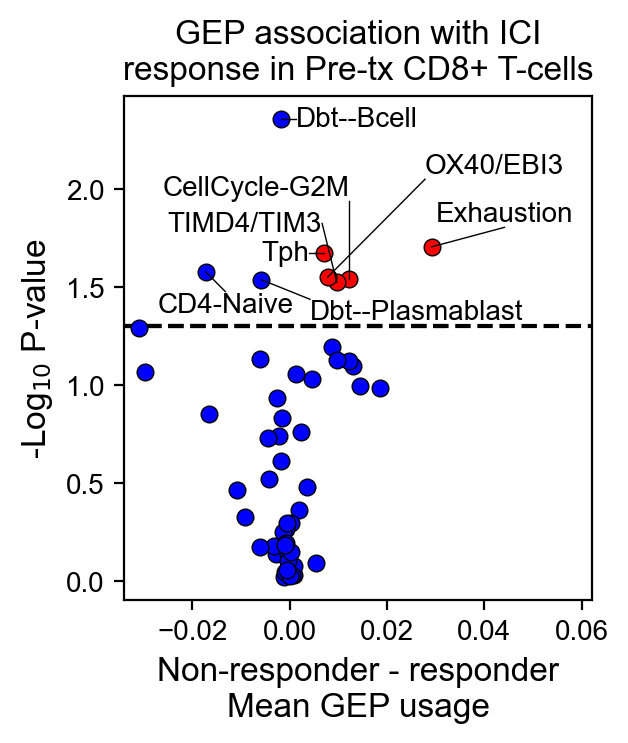

In [644]:
variables = usage.columns
ind = adata_tpm.obs['Multinomial_Label'].isin(['CD8_Naive', 'CD8_CM', 'CD8_EM', 'CD8_TEMRA']) & ~adata_tpm.obs['CD8+CD39+TIM+_Sorted'] & ~adata_tpm.obs['CD8+CD39-TIM-_Sorted']
allcell_usage = usage.loc[ind, :].groupby(adata_tpm.obs.loc[ind, 'sample']).mean()
allcell_act_count = adata_tpm.obs.loc[ind,:].groupby('sample').count()
sample_data_withcount = sample_data.copy()
sample_data_withcount['Count'] = allcell_act_count.loc[sample_data_withcount.index, 'cell_label'].values
allcell_act_pct_merged = pd.merge(left=sample_data_withcount, right=allcell_usage, left_index=True, right_index=True, how='left')

r = 'Pre'
ind = allcell_act_pct_merged['timepoint']==r
rdat = allcell_act_pct_merged.loc[ind, :]
ttest_res = run_ttest_all(rdat, variables, g1lab='Non-responder', g2lab='Responder')

(fig,ax) = plt.subplots(1,1, figsize=(3,4), dpi=200, gridspec_kw={'left':.2, 'right':.98, 'bottom':.23, 'top':.86})

ind = (ttest_res[ 'Delta']>0) & (ttest_res[ 'logP']>-1*np.log10(.05))
ax.scatter(ttest_res.loc[ind, 'Delta'], ttest_res.loc[ind, 'logP'], edgecolor='k', lw=.5, color='r')
ax.scatter(ttest_res.loc[~ind, 'Delta'], ttest_res.loc[~ind, 'logP'], edgecolor='k', lw=.5, color='b')



ylim = ax.get_ylim()
xlim = ax.get_xlim()
ax.hlines(y=-1*np.log10(.05), xmin=xlim[0], xmax=xlim[1], linestyle='--', zorder=-1, color='k')
ax.set_xlim(xlim)

geps_to_plot = list(ttest_res.index[ttest_res['P']<.05])
xval = 'Delta'
yval = 'logP'
fs = 10
for i,g in enumerate(geps_to_plot):
    #lab = shorten_map[g]
    lab = g.replace('Doublet', 'Dbt-')

    #if g == 'CellCycle-G2M':
    #    continue


    
    if g in [ 'Metallothionein',
             'ICOS/CD38', 'NME1/FABP5', 'Cytoskeleton',
             'Tph', 'TEMRA']: deltax = -0.003; deltay =0; ha='right'; va='center' ## Left
    elif g in [ 'Exhaustion']: deltax = 0.015; deltay = .1; ha='center'; va='bottom' ## Upper-right
    elif g in [ 'OX40/EBI3']: deltax = 0.02; deltay = .5; ha='left'; va='bottom' ## Upper-right

    elif g in ['CD4-Naive', ]: deltax = 0.004; deltay = -.1; ha='center'; va='top' ## Lower-right
    elif g in [ 'Doublet-Plasmablast']: deltax = 0.01; deltay = -.1; ha='left'; va='top' ## Lower-right

    elif g in []: deltax = -0.008; deltay =-0.4; ha='right'; va='top' ## Lower-Left
    elif g in ['CellCycle-G2M']: deltax = 0; deltay =0.4; ha='right'; va='bottom' ## Above
    elif g in []: deltax = 0.003; deltay =-0.1; ha='center'; va='top' ## Below

    elif g in ['CellCycle-Late-S',]: deltax = -0.015; deltay =0.5; ha='right'; va='bottom' ## Upper-Left
    elif g in ['TIMD4/TIM3']: deltax = -0.003; deltay =0.3; ha='right'; va='center' ## Upper-Left
    else: deltax=.003; deltay=0; ha='left'; va='center' # Default to right

    ax.text(ttest_res.at[g, xval]+deltax, ttest_res.at[g, yval]+deltay, lab, ha=ha, va=va, fontsize=fs)
    ax.plot([ttest_res.at[g, xval], ttest_res.at[g, xval]+deltax], [ttest_res.at[g, yval], ttest_res.at[g, yval]+deltay], color='k', lw=.5)
        

ylim = ax.get_ylim()
xlim = ax.get_xlim()
ax.hlines(y=-1*np.log10(.05), xmin=xlim[0], xmax=xlim[1]+.3, linestyle='--', zorder=-1, color='k')
ax.set_xlim(xlim[0], xlim[1]+.03)
ax.set_title('GEP association with ICI\nresponse in Pre-tx CD8+ T-cells', fontsize=12) 
ax.set_xlabel('Non-responder - responder\nMean GEP usage', fontsize=12)
ax.set_ylabel('-Log$_{10}$ P-value', fontsize=12)

plt.savefig(os.path.join(figdir, 'CD8_Pre_Usage_Assoc_Volcano.png'))
plt.savefig(os.path.join(figdir, 'CD8_Pre_Usage_Assoc_Volcano.pdf'))

ttest_res.to_csv(os.path.join(outdir, 'CD8_usage_pre_gep_association.tsv'), sep='\t')

In [645]:
variables = usage.columns
ind = adata_tpm.obs['Multinomial_Label'].isin(['CD4_Naive', 'CD4_CM', 'CD4_EM']) & ~adata_tpm.obs['CD8+CD39+TIM+_Sorted'] & ~adata_tpm.obs['CD8+CD39-TIM-_Sorted']
allcell_usage = usage.loc[ind, :].groupby(adata_tpm.obs.loc[ind, 'sample']).mean()
allcell_act_count = adata_tpm.obs.loc[ind,:].groupby('sample').count()
sample_data_withcount = sample_data.copy()
sample_data_withcount['Count'] = allcell_act_count.loc[sample_data_withcount.index, 'cell_label'].values
allcell_act_pct_merged = pd.merge(left=sample_data_withcount, right=allcell_usage, left_index=True, right_index=True, how='left')


r = 'Pre'
ind = allcell_act_pct_merged['response']=='Responder'
rdat = allcell_act_pct_merged.loc[ind, :]
ttest_res_prevpost_responder = run_ttest_all(rdat, variables, g1lab='Post', g2lab='Pre', feature='timepoint')
ttest_res_prevpost_responder.sort_values(by='P').head(5)

,GEP,T,P,Delta,Q,logP,logQ,signed_logP
GEP,,,,,,,,
TEMRA,TEMRA,2.448055,0.032362,0.009957,0.999343,1.489963,0.000285,1.489963
ISG,ISG,-2.309803,0.046731,-0.010493,0.999343,1.330397,0.000285,-1.330397
Doublet-Platelet,Doublet-Platelet,2.119327,0.068941,0.001830,0.999343,1.161523,0.000285,1.161523
BCL2/FAM13A,BCL2/FAM13A,-1.895183,0.079302,-0.005785,0.999343,1.100714,0.000285,-1.100714
CD4-Naive,CD4-Naive,-1.604554,0.133278,-0.034334,0.999343,0.875240,0.000285,-0.875240


In [646]:
rdat = allcell_act_pct_merged.loc[~ind, :]
ttest_res_prevpost_nonresponder = run_ttest_all(rdat, variables, g1lab='Post', g2lab='Pre', feature='timepoint')
ttest_res_prevpost_nonresponder.sort_values(by='P').head(5)

,GEP,T,P,Delta,Q,logP,logQ,signed_logP
GEP,,,,,,,,
ICOS/CD38,ICOS/CD38,2.930285,0.007066,0.005871,0.317281,2.150836,0.498557,2.150836
Cytoskeleton,Cytoskeleton,2.681964,0.012203,0.022435,0.317281,1.913530,0.498557,1.913530
Doublet-Myeloid,Doublet-Myeloid,2.041853,0.052790,0.002479,0.643962,1.277449,0.191140,1.277449
CD4-CM,CD4-CM,1.963447,0.059430,0.005061,0.643962,1.225992,0.191140,1.225992
TIMD4/TIM3,TIMD4/TIM3,1.907481,0.067743,0.003576,0.643962,1.169138,0.191140,1.169138


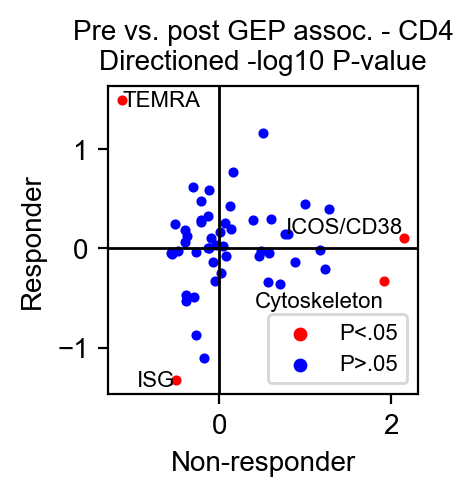

In [647]:
(fig,ax) = plt.subplots(1,1, figsize=(2,2), dpi=200)

ind = (ttest_res_prevpost_nonresponder['P']<.05) | (ttest_res_prevpost_responder['P']<.05)
ax.scatter(ttest_res_prevpost_nonresponder.loc[ind, 'signed_logP'],
           ttest_res_prevpost_responder.loc[ind, 'signed_logP'], s=7, c='r', label='P<.05')
ax.scatter(ttest_res_prevpost_nonresponder.loc[~ind, 'signed_logP'],
           ttest_res_prevpost_responder.loc[~ind, 'signed_logP'], s=7, c='b', label='P>.05')

xlim = ax.get_xlim()
ylim = ax.get_ylim()
ax.vlines(x=0, ymin=ylim[0]-1, ymax=ylim[1]+1, linestyle='-', color='k', lw=1)
ax.hlines(y=0, xmin=xlim[0]-1, xmax=xlim[1]+1, linestyle='-', color='k', lw=1)
ax.set_ylim(ylim)
ax.set_xlim(xlim)
ax.set_xlabel('Non-responder', fontsize=10)
ax.set_ylabel('Responder', fontsize=10)
ax.set_title('Pre vs. post GEP assoc. - CD4\nDirectioned -log10 P-value', fontsize=10)

xval = 'signed_logP'
yval = 'signed_logP'
fs=8
deltax = .01
deltay = .01

for i,g in enumerate(['ISG', 'TEMRA', 'ICOS/CD38', 'Cytoskeleton']):
    lab = g

    #if g == 'CellCycle-G2M':
    #    continue


    
    if g in ['ISG']: deltax = -0.003; deltay =0; ha='right'; va='center' ## Left
    elif g in [ 'Exhaustion']: deltax = 0.015; deltay = .1; ha='center'; va='bottom' ## Upper-right
    elif g in [ 'OX40/EBI3']: deltax = 0.02; deltay = .5; ha='left'; va='bottom' ## Upper-right

    elif g in ['CD4-Naive', ]: deltax = 0.004; deltay = -.1; ha='center'; va='top' ## Lower-right
    elif g in [ 'Doublet-Plasmablast']: deltax = 0.01; deltay = -.1; ha='left'; va='top' ## Lower-right

    elif g in ['Cytoskeleton',]: deltax = -0.003; deltay =-0.1; ha='right'; va='top' ## Lower-Left
    elif g in ['CellCycle-G2M']: deltax = 0; deltay =0.4; ha='right'; va='bottom' ## Above
    elif g in []: deltax = 0.003; deltay =-0.1; ha='center'; va='top' ## Below

    elif g in ['ICOS/CD38',]: deltax = -0.015; deltay =0.01; ha='right'; va='bottom' ## Upper-Left
    elif g in ['TIMD4/TIM3']: deltax = -0.003; deltay =0.3; ha='right'; va='center' ## Upper-Left
    else: deltax=.003; deltay=0; ha='left'; va='center' # Default to right

    ax.text(ttest_res_prevpost_nonresponder.at[g, xval]+deltax,
            ttest_res_prevpost_responder.at[g, yval]+deltay, lab, ha=ha, va=va, fontsize=fs)
    #ax.plot([ttest_res_prevpost_nonresponder.at[g, xval], ttest_res_prevpost_responder.at[g, xval]],
    #        [ttest_res_prevpost_nonresponder.at[g, yval]+deltax, ttest_res_prevpost_responder.at[g, yval]+deltay], color='k', lw=.5)

ax.legend(loc='lower right', fontsize=8, markerscale=1.5)

In [648]:
variables = usage.columns
ind = adata_tpm.obs['Multinomial_Label'].isin(['CD8_Naive', 'CD84_CM', 'CD8_EM', 'CD8_TEMRA']) & ~adata_tpm.obs['CD8+CD39+TIM+_Sorted'] & ~adata_tpm.obs['CD8+CD39-TIM-_Sorted']
allcell_usage = usage.loc[ind, :].groupby(adata_tpm.obs.loc[ind, 'sample']).mean()
allcell_act_count = adata_tpm.obs.loc[ind,:].groupby('sample').count()
sample_data_withcount = sample_data.copy()
sample_data_withcount['Count'] = allcell_act_count.loc[sample_data_withcount.index, 'cell_label'].values
allcell_act_pct_merged = pd.merge(left=sample_data_withcount, right=allcell_usage, left_index=True, right_index=True, how='left')


r = 'Pre'
ind = allcell_act_pct_merged['response']=='Responder'
rdat = allcell_act_pct_merged.loc[ind, :]
ttest_res_prevpost_responder = run_ttest_all(rdat, variables, g1lab='Post', g2lab='Pre', feature='timepoint')
ttest_res_prevpost_responder.sort_values(by='P').head(5)

,GEP,T,P,Delta,Q,logP,logQ,signed_logP
GEP,,,,,,,,
CD8-Trm,CD8-Trm,2.043721,0.072166,0.013198,0.99294,1.141669,0.003077,1.141669
Doublet-Plasmablast,Doublet-Plasmablast,-1.710041,0.109265,-0.004191,0.99294,0.961517,0.003077,-0.961517
Tph,Tph,1.633542,0.143352,0.006141,0.99294,0.843595,0.003077,0.843595
Th2-Activated,Th2-Activated,1.602046,0.145782,0.002813,0.99294,0.836296,0.003077,0.836296
gdT,gdT,-1.540311,0.147650,-0.003680,0.99294,0.830766,0.003077,-0.830766


In [649]:
rdat = allcell_act_pct_merged.loc[~ind, :]
ttest_res_prevpost_nonresponder = run_ttest_all(rdat, variables, g1lab='Post', g2lab='Pre', feature='timepoint')
ttest_res_prevpost_nonresponder.sort_values(by='P').head()

,GEP,T,P,Delta,Q,logP,logQ,signed_logP
GEP,,,,,,,,
IEG,IEG,1.964744,0.059165,0.008960,0.998642,1.227936,0.00059,1.227936
HLA,HLA,1.942003,0.064798,0.009778,0.998642,1.188437,0.00059,1.188437
Multi-Cytokine,Multi-Cytokine,1.728605,0.095140,0.008672,0.998642,1.021635,0.00059,1.021635
Translation,Translation,1.739038,0.096695,0.019508,0.998642,1.014594,0.00059,1.014594
Cytoskeleton,Cytoskeleton,1.600385,0.124892,0.009933,0.998642,0.903465,0.00059,0.903465


In [650]:
adata_tpm.obs['Proliferation2'] = adata_tpm.obs['Proliferation']>.05
adata_tpm.obs['Exhaustion'] = usage['Exhaustion']

In [675]:
adata_tpmnp.log2(adata_tpm.obs_vector('TCF7')

array([3.34251109, 0.        , 0.        , ..., 0.        , 0.        ,
       0.        ])

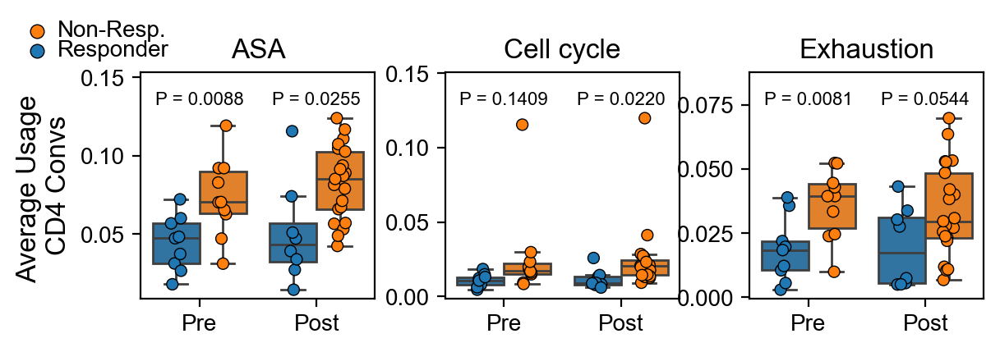

In [669]:
variables = ['ASA', 'Proliferation', 'Exhaustion']
labels = ['ASA', 'Cell cycle', 'Exhaustion']
ind = adata_tpm.obs['Multinomial_Label_Tissue'].isin(['CD4_Naive', 'CD4_CM', 'CD4_EM'])

allcell_score_pct = adata_tpm.obs.loc[ind, :].groupby('sample')[variables].mean()
allcell_score_count = adata_tpm.obs.loc[ind, :].groupby('sample').count()
allcell_score_pct['Count'] = allcell_score_count['cell_label'].values
allcell_score_pct_merged = pd.merge(left=sample_data, right=allcell_score_pct, left_index=True, right_index=True, how='left')

ttest_res = []
for r, rdat in allcell_score_pct_merged.groupby('timepoint'):
    for v in variables:
        T,P = ttest_ind(rdat.loc[rdat['response']=='Non-responder', v], rdat.loc[rdat['response']=='Responder', v],
                        equal_var=False)
        #T,P = ranksums(rdat.loc[rdat['response']=='Non-responder', v], rdat.loc[rdat['response']=='Responder', v])
        ttest_res.append([r, v, T, P])

ttest_res = pd.DataFrame(ttest_res, columns=['timepoint', 'response', 'T', 'P'])
ttest_res.index = pd.MultiIndex.from_arrays([ttest_res['timepoint'].tolist(), ttest_res['response'].tolist()])

(fig,axes) = plt.subplots(1,3, figsize=(6,2), dpi=200, gridspec_kw={'top':.8, 'right':.98, 'wspace':.3})

for i, val in enumerate(variables):
    sns.stripplot(x='timepoint', y=val, hue='response', data=allcell_score_pct_merged, ax=axes[i], dodge=True, legend=False,
             order=['Pre', 'Post'], hue_order=['Responder', 'Non-responder'], edgecolor='0', linewidth=.5)
        
    sns.boxplot(x='timepoint', y=val, hue='response', data=allcell_score_pct_merged, ax=axes[i], dodge=True, legend=False,
             order=['Pre', 'Post'], hue_order=['Responder', 'Non-responder'], fliersize=0)
    axes[i].set_title(labels[i])
    axes[i].set_ylabel('')
    axes[i].set_xlabel('')
    ylim = axes[i].get_ylim()
    axes[i].set_ylim([ylim[0], ylim[0]+(ylim[1]-ylim[0])*1.2])
    yval = ylim[0]+(ylim[1]-ylim[0])*1.05

    P1 = 'P = %.4f' % round(ttest_res.loc[('Pre', val), 'P'], 4)
    P2 = 'P = %.4f' % round(ttest_res.loc[('Post', val), 'P'], 4)

    '''
    if ttest_res.loc[('Pre', val), 'P']<.001:
        P1 =  'P=%.1e' % ttest_res.loc[('Pre', val), 'P']
        P1 = r'$' + P1.replace('e-0', 'x10^{-') + '}$'
    else:
        P1 = 'P = %.3f' % ttest_res.loc[('Pre', val), 'P']

    if ttest_res.loc[('Post', val), 'P']<.001:
        P2 = 'P=%.1e' % ttest_res.loc[('Post', val), 'P']
        P2 = '$' + P2.replace('e-0', 'x10^{-') + '}$'
    else:
        P2 = 'P = %.3f' % ttest_res.loc[('Post', val), 'P']
    '''
        
    axes[i].text(0, yval, P1, ha='center', va='center', fontsize=8)
    axes[i].text(1, yval, P2, ha='center', va='center', fontsize=8)
    print('\n')

'''
axes[0].set_yticks([0, 25.0, 50.0, 75.0])
axes[0].set_yticklabels(['0.0', '25.0', '50.0', '75.0'])
axes[1].set_yticks([0, 25.0, 50.0, 75.0])
axes[1].set_yticklabels(['0.0', '25.0', '50.0', '75.0'])
'''
axes[0].set_ylabel('Average Usage \nCD4 Convs', fontsize=12)

legend_ax = fig.add_axes([0, 0.82, 0.2, 0.15], frameon=False)
legend_ax.scatter([.1], [.3], color='tab:blue', edgecolor='0', linewidth=.5)
legend_ax.scatter([.1], [.7], color='tab:orange', edgecolor='0', linewidth=.5)
legend_ax.text(.2, .7, 'Non-Resp.', ha='left', va='center', fontsize=10)
legend_ax.text(.2, .3, 'Responder', ha='left', va='center', fontsize=10)
legend_ax.set_xlim([0, 1])
legend_ax.set_ylim([0, 1])
legend_ax.set_xticks([])
legend_ax.set_yticks([])

plt.savefig(os.path.join(figdir, 'Mel_CD4_ASACCExhaustion_Boxplot.png'))
plt.savefig(os.path.join(figdir, 'Mel_CD4_ASACCExhaustion_Boxplot.pdf'))

(0.009653201392101915, 0.09235205452310774)
(-0.0016484690149687416, 0.11865915420527999)
(0.0023604627232998608, 0.12324210577644408)


[]

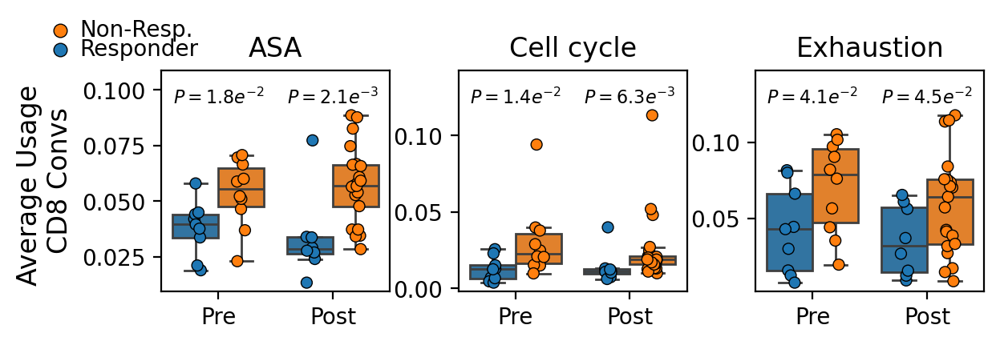

In [344]:
variables = ['ASA', 'Proliferation', 'Exhaustion']
labels = ['ASA', 'Cell cycle', 'Exhaustion']
ind = adata_tpm.obs['Multinomial_Label_Tissue'].isin(['CD8_Naive', 'CD8_CM', 'CD8_EM', 'CD8_TEMRA'])

allcell_score_pct = adata_tpm.obs.loc[ind, :].groupby('sample')[variables].mean()
allcell_score_count = adata_tpm.obs.loc[ind, :].groupby('sample').count()
allcell_score_pct['Count'] = allcell_score_count['cell_label'].values
allcell_score_pct_merged = pd.merge(left=sample_data, right=allcell_score_pct, left_index=True, right_index=True, how='left')

ttest_res = []
for r, rdat in allcell_score_pct_merged.groupby('timepoint'):
    for v in variables:
        #T,P = ttest_ind(rdat.loc[rdat['response']=='Non-responder', v], rdat.loc[rdat['response']=='Responder', v],
        #                equal_var=False)
        T,P = ranksums(rdat.loc[rdat['response']=='Non-responder', v], rdat.loc[rdat['response']=='Responder', v])
        ttest_res.append([r, v, T, P])

ttest_res = pd.DataFrame(ttest_res, columns=['timepoint', 'response', 'T', 'P'])
ttest_res.index = pd.MultiIndex.from_arrays([ttest_res['timepoint'].tolist(), ttest_res['response'].tolist()])

(fig,axes) = plt.subplots(1,3, figsize=(6,2), dpi=200, gridspec_kw={'top':.8, 'right':.98, 'wspace':.3})

for i, val in enumerate(variables):
    sns.stripplot(x='timepoint', y=val, hue='response', data=allcell_score_pct_merged, ax=axes[i], dodge=True, legend=False,
             order=['Pre', 'Post'], hue_order=['Responder', 'Non-responder'], edgecolor='0', linewidth=.5)
        
    sns.boxplot(x='timepoint', y=val, hue='response', data=allcell_score_pct_merged, ax=axes[i], dodge=True, legend=False,
             order=['Pre', 'Post'], hue_order=['Responder', 'Non-responder'], fliersize=0)
    axes[i].set_title(labels[i])
    axes[i].set_ylabel('')
    axes[i].set_xlabel('')
    ylim = axes[i].get_ylim()
    axes[i].set_ylim([ylim[0], ylim[0]+(ylim[1]-ylim[0])*1.2])
    yval = ylim[0]+(ylim[1]-ylim[0])*1.05
    P1 =  'P=%.1e' % ttest_res.loc[('Pre', val), 'P']
    P2 = 'P=%.1e' % ttest_res.loc[('Post', val), 'P']
    P1 = '$' + P1.replace('e-0', 'e^{-') + '}$'
    P2 = '$' + P2.replace('e-0', 'e^{-') + '}$'
    axes[i].text(0, yval, P1, ha='center', va='center', fontsize=8)
    axes[i].text(1, yval, P2, ha='center', va='center', fontsize=8)

    print(ylim)

'''
axes[0].set_yticks([0, 25.0, 50.0, 75.0])
axes[0].set_yticklabels(['0.0', '25.0', '50.0', '75.0'])
axes[1].set_yticks([0, 25.0, 50.0, 75.0])
axes[1].set_yticklabels(['0.0', '25.0', '50.0', '75.0'])
'''
axes[0].set_ylabel('Average Usage \nCD8 Convs', fontsize=12)

legend_ax = fig.add_axes([0, 0.82, 0.2, 0.15], frameon=False)
legend_ax.scatter([.1], [.3], color='tab:blue', edgecolor='0', linewidth=.5)
legend_ax.scatter([.1], [.7], color='tab:orange', edgecolor='0', linewidth=.5)
legend_ax.text(.2, .7, 'Non-Resp.', ha='left', va='center', fontsize=10)
legend_ax.text(.2, .3, 'Responder', ha='left', va='center', fontsize=10)
legend_ax.set_xlim([0, 1])
legend_ax.set_ylim([0, 1])
legend_ax.set_xticks([])
legend_ax.set_yticks([])

#plt.savefig(os.path.join(figdir, 'CD4_Score_assoc_boxplot.png'))

(-3.7593984962406015, 78.94736842105263)
(-3.6111111111111107, 75.83333333333333)


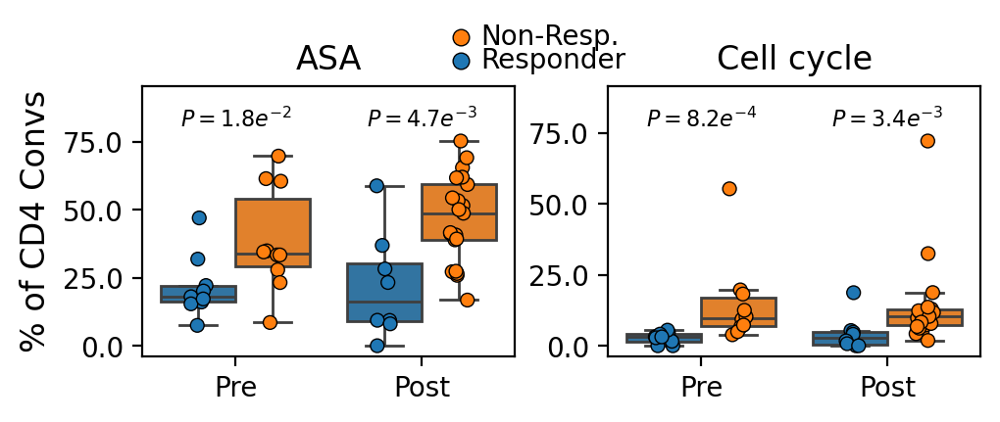

In [347]:
variables = ['ASA_binary', 'Proliferation_binary']
labels = ['ASA', 'Cell cycle']
ind = adata_tpm.obs['Multinomial_Label'].isin(['CD4_Naive', 'CD4_CM', 'CD4_EM'])

allcell_score_pct = adata_tpm.obs.loc[ind, :].groupby('sample')[variables].mean()*100
allcell_score_count = adata_tpm.obs.loc[ind, :].groupby('sample').count()
allcell_score_pct['Count'] = allcell_score_count['cell_label'].values
allcell_score_pct_merged = pd.merge(left=sample_data, right=allcell_score_pct, left_index=True, right_index=True, how='left')

ttest_res = []
for r, rdat in allcell_score_pct_merged.groupby('timepoint'):
    for v in variables:
        #T,P = ttest_ind(rdat.loc[rdat['response']=='Non-responder', v], rdat.loc[rdat['response']=='Responder', v],
        #                equal_var=False)
        T,P = ranksums(rdat.loc[rdat['response']=='Non-responder', v], rdat.loc[rdat['response']=='Responder', v])
        ttest_res.append([r, v, T, P])

ttest_res = pd.DataFrame(ttest_res, columns=['timepoint', 'response', 'T', 'P'])
ttest_res.index = pd.MultiIndex.from_arrays([ttest_res['timepoint'].tolist(), ttest_res['response'].tolist()])

(fig,axes) = plt.subplots(1,2, figsize=(5,2), dpi=200, gridspec_kw={'top':.8, 'right':.98, 'wspace':.25})

for i, val in enumerate(variables):
    sns.stripplot(x='timepoint', y=val, hue='response', data=allcell_score_pct_merged, ax=axes[i], dodge=True, legend=False,
             order=['Pre', 'Post'], hue_order=['Responder', 'Non-responder'], edgecolor='0', linewidth=.5)
        
    sns.boxplot(x='timepoint', y=val, hue='response', data=allcell_score_pct_merged, ax=axes[i], dodge=True, legend=False,
             order=['Pre', 'Post'], hue_order=['Responder', 'Non-responder'], fliersize=0)
    axes[i].set_title(labels[i])
    axes[i].set_ylabel('')
    axes[i].set_xlabel('')
    ylim = axes[i].get_ylim()
    axes[i].set_ylim([ylim[0], ylim[0]+(ylim[1]-ylim[0])*1.2])
    yval = ylim[0]+(ylim[1]-ylim[0])*1.05
    P1 =  'P=%.1e' % ttest_res.loc[('Pre', val), 'P']
    P2 = 'P=%.1e' % ttest_res.loc[('Post', val), 'P']
    P1 = '$' + P1.replace('e-0', 'e^{-') + '}$'
    P2 = '$' + P2.replace('e-0', 'e^{-') + '}$'
    axes[i].text(0, yval, P1, ha='center', va='center', fontsize=8)
    axes[i].text(1, yval, P2, ha='center', va='center', fontsize=8)

    print(ylim)

axes[0].set_yticks([0, 25.0, 50.0, 75.0])
axes[0].set_yticklabels(['0.0', '25.0', '50.0', '75.0'])
axes[1].set_yticks([0, 25.0, 50.0, 75.0])
axes[1].set_yticklabels(['0.0', '25.0', '50.0', '75.0'])
axes[0].set_ylabel('% of CD4 Convs', fontsize=12)

legend_ax = fig.add_axes([.43, 0.82, 0.2, 0.15], frameon=False)
legend_ax.scatter([.1], [.3], color='tab:blue', edgecolor='0', linewidth=.5)
legend_ax.scatter([.1], [.7], color='tab:orange', edgecolor='0', linewidth=.5)
legend_ax.text(.2, .7, 'Non-Resp.', ha='left', va='center', fontsize=10)
legend_ax.text(.2, .3, 'Responder', ha='left', va='center', fontsize=10)
legend_ax.set_xlim([0, 1])
legend_ax.set_ylim([0, 1])
legend_ax.set_xticks([])
legend_ax.set_yticks([])

plt.savefig(os.path.join(figdir, 'CD4_Score_assoc_boxplot.png'))
plt.savefig(os.path.join(figdir, 'CD4_Score_assoc_boxplot.pdf'))

In [207]:
adata_tpm.obs['Exhaustion'] = usage['Exhaustion']

(-3.3236264802950894, 84.17524105351713)
(-2.6190476190476195, 55.00000000000001)


[]

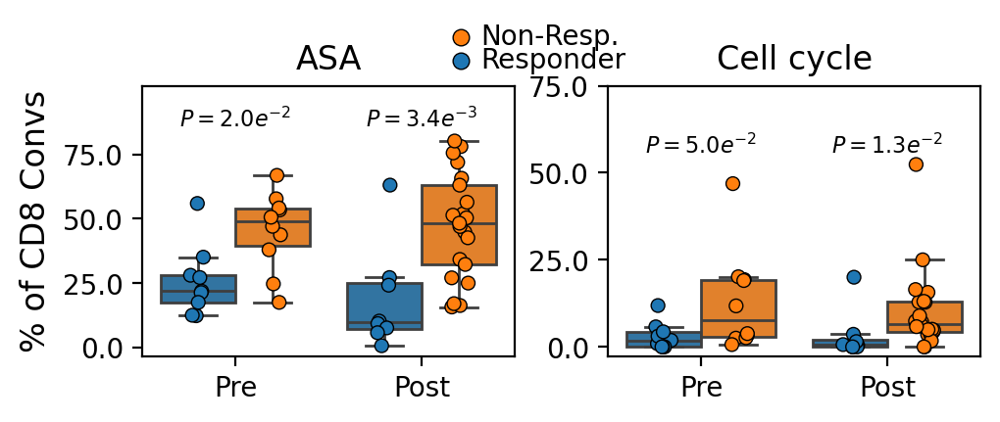

In [208]:
variables = ['ASA_binary', 'Proliferation_binary']
labels = ['ASA', 'Cell cycle']
ind = adata_tpm.obs['Multinomial_Label'].isin(['CD8_Naive', 'CD8_CM', 'CD8_EM', 'CD8_TEMRA'])

allcell_score_pct = adata_tpm.obs.loc[ind, :].groupby('sample')[variables].mean()*100
allcell_score_count = adata_tpm.obs.loc[ind, :].groupby('sample').count()
allcell_score_pct['Count'] = allcell_score_count['cell_label'].values
allcell_score_pct_merged = pd.merge(left=sample_data, right=allcell_score_pct, left_index=True, right_index=True, how='left')

ttest_res = []
for r, rdat in allcell_score_pct_merged.groupby('timepoint'):
    for v in variables:
        #T,P = ttest_ind(rdat.loc[rdat['response']=='Non-responder', v], rdat.loc[rdat['response']=='Responder', v],
        #                equal_var=False)
        T,P = ranksums(rdat.loc[rdat['response']=='Non-responder', v], rdat.loc[rdat['response']=='Responder', v])
        ttest_res.append([r, v, T, P])

ttest_res = pd.DataFrame(ttest_res, columns=['timepoint', 'response', 'T', 'P'])
ttest_res.index = pd.MultiIndex.from_arrays([ttest_res['timepoint'].tolist(), ttest_res['response'].tolist()])

(fig,axes) = plt.subplots(1,2, figsize=(5,2), dpi=200, gridspec_kw={'top':.8, 'right':.98, 'wspace':.25})

for i, val in enumerate(variables):
    sns.stripplot(x='timepoint', y=val, hue='response', data=allcell_score_pct_merged, ax=axes[i], dodge=True, legend=False,
             order=['Pre', 'Post'], hue_order=['Responder', 'Non-responder'], edgecolor='0', linewidth=.5)
        
    sns.boxplot(x='timepoint', y=val, hue='response', data=allcell_score_pct_merged, ax=axes[i], dodge=True, legend=False,
             order=['Pre', 'Post'], hue_order=['Responder', 'Non-responder'], fliersize=0)
    axes[i].set_title(labels[i])
    axes[i].set_ylabel('')
    axes[i].set_xlabel('')
    ylim = axes[i].get_ylim()
    axes[i].set_ylim([ylim[0], ylim[0]+(ylim[1]-ylim[0])*1.2])
    yval = ylim[0]+(ylim[1]-ylim[0])*1.05
    P1 =  'P=%.1e' % ttest_res.loc[('Pre', val), 'P']
    P2 = 'P=%.1e' % ttest_res.loc[('Post', val), 'P']
    P1 = '$' + P1.replace('e-0', 'e^{-') + '}$'
    P2 = '$' + P2.replace('e-0', 'e^{-') + '}$'
    axes[i].text(0, yval, P1, ha='center', va='center', fontsize=8)
    axes[i].text(1, yval, P2, ha='center', va='center', fontsize=8)

    print(ylim)

axes[0].set_yticks([0, 25.0, 50.0, 75.0])
axes[0].set_yticklabels(['0.0', '25.0', '50.0', '75.0'])
axes[1].set_yticks([0, 25.0, 50.0, 75.0])
axes[1].set_yticklabels(['0.0', '25.0', '50.0', '75.0'])
axes[0].set_ylabel('% of CD8 Convs', fontsize=12)

legend_ax = fig.add_axes([.43, 0.82, 0.2, 0.15], frameon=False)
legend_ax.scatter([.1], [.3], color='tab:blue', edgecolor='0', linewidth=.5)
legend_ax.scatter([.1], [.7], color='tab:orange', edgecolor='0', linewidth=.5)
legend_ax.text(.2, .7, 'Non-Resp.', ha='left', va='center', fontsize=10)
legend_ax.text(.2, .3, 'Responder', ha='left', va='center', fontsize=10)
legend_ax.set_xlim([0, 1])
legend_ax.set_ylim([0, 1])
legend_ax.set_xticks([])
legend_ax.set_yticks([])

(-0.0011331645073369145, 0.11682153271976858)
(-0.0025988518983485996, 0.1941599581399511)


[]

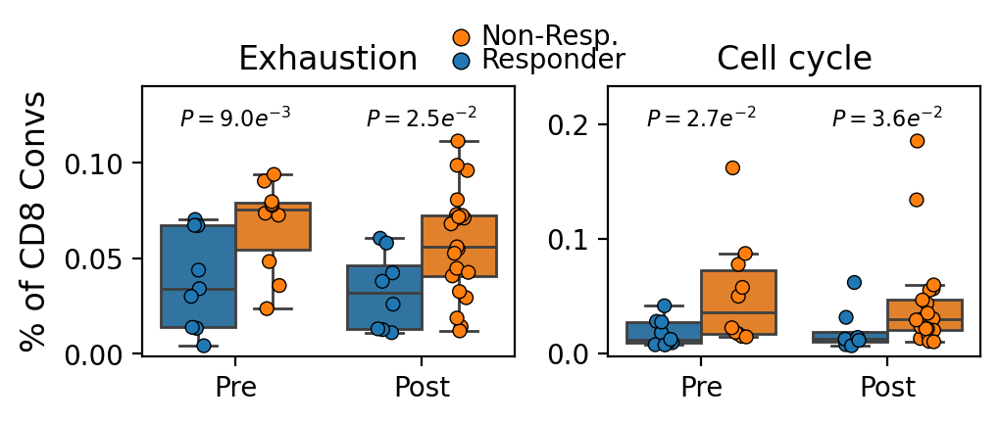

In [210]:
variables = ['Exhaustion', 'Proliferation']
labels = ['Exhaustion', 'Cell cycle']
ind = adata_tpm.obs['Multinomial_Label'].isin(['CD8_Naive', 'CD8_CM', 'CD8_EM', 'CD8_TEMRA'])

allcell_score_pct = adata_tpm.obs.loc[ind, :].groupby('sample')[variables].mean()
allcell_score_count = adata_tpm.obs.loc[ind, :].groupby('sample').count()
allcell_score_pct['Count'] = allcell_score_count['cell_label'].values
allcell_score_pct_merged = pd.merge(left=sample_data, right=allcell_score_pct, left_index=True, right_index=True, how='left')

ttest_res = []
for r, rdat in allcell_score_pct_merged.groupby('timepoint'):
    for v in variables:
        #T,P = ttest_ind(rdat.loc[rdat['response']=='Non-responder', v], rdat.loc[rdat['response']=='Responder', v],
        #                equal_var=False)
        T,P = ranksums(rdat.loc[rdat['response']=='Non-responder', v], rdat.loc[rdat['response']=='Responder', v])
        ttest_res.append([r, v, T, P])

ttest_res = pd.DataFrame(ttest_res, columns=['timepoint', 'response', 'T', 'P'])
ttest_res.index = pd.MultiIndex.from_arrays([ttest_res['timepoint'].tolist(), ttest_res['response'].tolist()])

(fig,axes) = plt.subplots(1,2, figsize=(5,2), dpi=200, gridspec_kw={'top':.8, 'right':.98, 'wspace':.25})

for i, val in enumerate(variables):
    sns.stripplot(x='timepoint', y=val, hue='response', data=allcell_score_pct_merged, ax=axes[i], dodge=True, legend=False,
             order=['Pre', 'Post'], hue_order=['Responder', 'Non-responder'], edgecolor='0', linewidth=.5)
        
    sns.boxplot(x='timepoint', y=val, hue='response', data=allcell_score_pct_merged, ax=axes[i], dodge=True, legend=False,
             order=['Pre', 'Post'], hue_order=['Responder', 'Non-responder'], fliersize=0)
    axes[i].set_title(labels[i])
    axes[i].set_ylabel('')
    axes[i].set_xlabel('')
    ylim = axes[i].get_ylim()
    axes[i].set_ylim([ylim[0], ylim[0]+(ylim[1]-ylim[0])*1.2])
    yval = ylim[0]+(ylim[1]-ylim[0])*1.05
    P1 =  'P=%.1e' % ttest_res.loc[('Pre', val), 'P']
    P2 = 'P=%.1e' % ttest_res.loc[('Post', val), 'P']
    P1 = '$' + P1.replace('e-0', 'e^{-') + '}$'
    P2 = '$' + P2.replace('e-0', 'e^{-') + '}$'
    axes[i].text(0, yval, P1, ha='center', va='center', fontsize=8)
    axes[i].text(1, yval, P2, ha='center', va='center', fontsize=8)

    print(ylim)

#axes[0].set_yticks([0, 25.0, 50.0, 75.0])
#axes[0].set_yticklabels(['0.0', '25.0', '50.0', '75.0'])
#axes[1].set_yticks([0, 25.0, 50.0, 75.0])
#axes[1].set_yticklabels(['0.0', '25.0', '50.0', '75.0'])
axes[0].set_ylabel('% of CD8 Convs', fontsize=12)

legend_ax = fig.add_axes([.43, 0.82, 0.2, 0.15], frameon=False)
legend_ax.scatter([.1], [.3], color='tab:blue', edgecolor='0', linewidth=.5)
legend_ax.scatter([.1], [.7], color='tab:orange', edgecolor='0', linewidth=.5)
legend_ax.text(.2, .7, 'Non-Resp.', ha='left', va='center', fontsize=10)
legend_ax.text(.2, .3, 'Responder', ha='left', va='center', fontsize=10)
legend_ax.set_xlim([0, 1])
legend_ax.set_ylim([0, 1])
legend_ax.set_xticks([])
legend_ax.set_yticks([])

In [629]:
variables = usage.columns
ind = adata_tpm.obs['Multinomial_Label'].isin(['CD4_Naive', 'CD4_CM', 'CD4_EM'])
allcell_usage = usage.loc[ind, :].groupby(adata_tpm.obs.loc[ind, 'sample']).mean()
allcell_act_count = adata_tpm.obs.loc[ind,:].groupby('sample').count()
sample_data_withcount = sample_data.copy()
sample_data_withcount['Count'] = allcell_act_count.loc[sample_data_withcount.index, 'cell_label'].values
allcell_act_pct_merged = pd.merge(left=sample_data_withcount, right=allcell_usage, left_index=True, right_index=True, how='left')

ttest_res = []

for r, rdat in allcell_act_pct_merged.groupby('timepoint'):
    for v in variables:
        T,P = ttest_ind(rdat.loc[rdat['response']=='Non-responder', v], rdat.loc[rdat['response']=='Responder', v],
                        equal_var=False)
        #T,P = ranksums(rdat.loc[rdat['response']=='Non-responder', v], rdat.loc[rdat['response']=='Responder', v])
        meandiff = rdat.loc[rdat['response']=='Non-responder', v].mean() - rdat.loc[rdat['response']=='Responder', v].mean()
        ttest_res.append([r, v, T, P, meandiff])

ttest_res = pd.DataFrame(ttest_res, columns=['timepoint', 'response', 'T', 'P', 'Delta'])
ttest_res.index = ttest_res['response']
ttest_res['Q'] = np.nan
ind = ttest_res['timepoint'] == 'Pre'
_, ttest_res.loc[ind, 'Q'] =  fdrcorrection(ttest_res.loc[ind, 'P'])
_, ttest_res.loc[~ind, 'Q'] =  fdrcorrection(ttest_res.loc[~ind, 'P'])

ttest_res['logP'] = ttest_res['P'].apply(np.log10)*-1
ttest_res['logQ'] = ttest_res['Q'].apply(np.log10)*-1

ttest_res['signed_logP'] = ttest_res['T'].apply(np.sign)*ttest_res['logP']
ttest_res.index = pd.MultiIndex.from_arrays([np.array(ttest_res['timepoint']), np.array(ttest_res.index)])


In [630]:
ttest_res.loc['Pre', :].sort_values(by='P')

,timepoint,response,T,P,Delta,Q,logP,logQ,signed_logP
Metallothionein,Pre,Metallothionein,4.540209,0.000346,0.002302,0.018016,3.460346,1.744343,3.460346
Tph,Pre,Tph,4.056621,0.001069,0.015083,0.027784,2.971184,1.556210,2.971184
HLA,Pre,HLA,2.893646,0.010276,0.011411,0.161483,1.988186,0.791873,1.988186
TIMD4/TIM3,Pre,TIMD4/TIM3,2.727771,0.014334,0.004777,0.161483,1.843632,0.791873,1.843632
CellCycle-Late-S,Pre,CellCycle-Late-S,2.831427,0.018335,0.015998,0.161483,1.736728,0.791873,1.736728
CellCycle-S,Pre,CellCycle-S,2.808631,0.018633,0.014569,0.161483,1.729725,0.791873,1.729725
Exhaustion,Pre,Exhaustion,2.440572,0.026063,0.014852,0.178795,1.583974,0.747644,1.583974
TEMRA,Pre,TEMRA,2.470196,0.027507,0.010392,0.178795,1.560557,0.747644,1.560557
CD4-Naive,Pre,CD4-Naive,-2.478334,0.034749,-0.047483,0.200772,1.459058,0.697297,-1.459058
OX40/EBI3,Pre,OX40/EBI3,2.232806,0.046640,0.013873,0.229061,1.331237,0.640049,1.331237


(0.0005881750141270457, 0.04790932418545708)
(0.0004504763521254062, 0.017298879753798246)


/tmp/ipykernel_216236/1062355460.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(['Pre', 'Post'], fontsize=12)
/tmp/ipykernel_216236/1062355460.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(['Pre', 'Post'], fontsize=12)


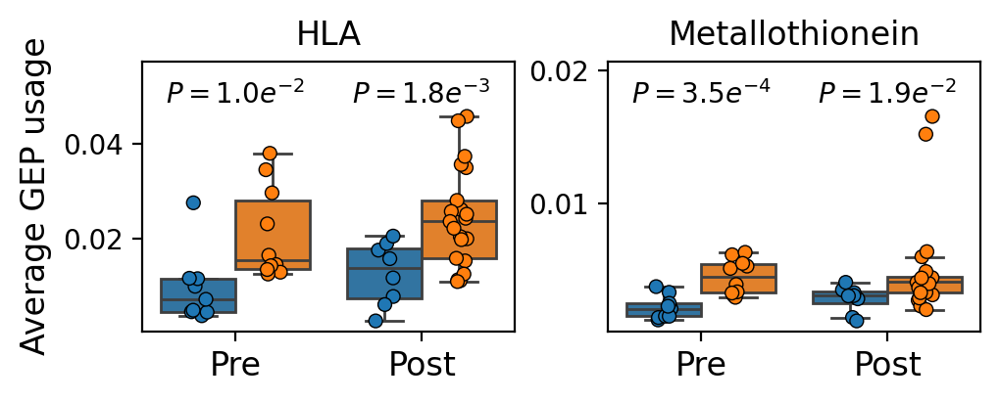

In [631]:
variables = ['HLA', 'Metallothionein']

(fig,axes) = plt.subplots(1,2, figsize=(5,2), dpi=200, gridspec_kw={'top':.8, 'right':.98, 'wspace':.25})

for i, val in enumerate(variables):
    sns.stripplot(x='timepoint', y=val, hue='response', data=allcell_act_pct_merged, ax=axes[i], dodge=True, legend=False,
             order=['Pre', 'Post'], hue_order=['Responder', 'Non-responder'], edgecolor='0', linewidth=.5)
        
    sns.boxplot(x='timepoint', y=val, hue='response', data=allcell_act_pct_merged, ax=axes[i], dodge=True, legend=False,
             order=['Pre', 'Post'], hue_order=['Responder', 'Non-responder'], fliersize=0)
    axes[i].set_title(variables[i])
    axes[i].set_ylabel('')
    axes[i].set_xlabel('')
    ylim = axes[i].get_ylim()
    axes[i].set_ylim([ylim[0], ylim[0]+(ylim[1]-ylim[0])*1.2])
    yval = ylim[0]+(ylim[1]-ylim[0])*1.05
    P1 =  'P=%.1e' % ttest_res.loc[('Pre', val), 'P']
    P2 = 'P=%.1e' % ttest_res.loc[('Post', val), 'P']
    P1 = '$' + P1.replace('e-0', 'e^{-') + '}$'
    P2 = '$' + P2.replace('e-0', 'e^{-') + '}$'
    axes[i].text(0, yval, P1, ha='center', va='center', fontsize=10)
    axes[i].text(1, yval, P2, ha='center', va='center', fontsize=10)

    print(ylim)

axes[0].set_ylabel('Average GEP usage', fontsize=12)
axes[0].set_xticklabels(['Pre', 'Post'], fontsize=12)
axes[1].set_xticklabels(['Pre', 'Post'], fontsize=12)

'''
legend_ax = fig.add_axes([.43, 0.82, 0.2, 0.15], frameon=True)
legend_ax.scatter([.1], [.3], color='tab:blue', edgecolor='0', linewidth=.5)
legend_ax.scatter([.1], [.7], color='tab:orange', edgecolor='0', linewidth=.5)
legend_ax.text(.2, .7, 'Responder', ha='left', va='center', fontsize=10)
legend_ax.text(.2, .3, 'Non-Resp.', ha='left', va='center', fontsize=10)
legend_ax.set_xlim([0, 1])
legend_ax.set_ylim([0, 1])
legend_ax.set_xticks([])
legend_ax.set_yticks([])
'''

plt.savefig(os.path.join(figdir, 'CD4_HLAandMetallo_assoc_boxplot.png'))
plt.savefig(os.path.join(figdir, 'CD4_HLAandMetallo_assoc_boxplot.pdf'))

(0.0006054321420378983, 0.05881941079860553)
(0.0028499865904450415, 0.03228979017585516)


/tmp/ipykernel_216236/1992222274.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(['Pre', 'Post'], fontsize=12)
/tmp/ipykernel_216236/1992222274.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(['Pre', 'Post'], fontsize=12)


[]

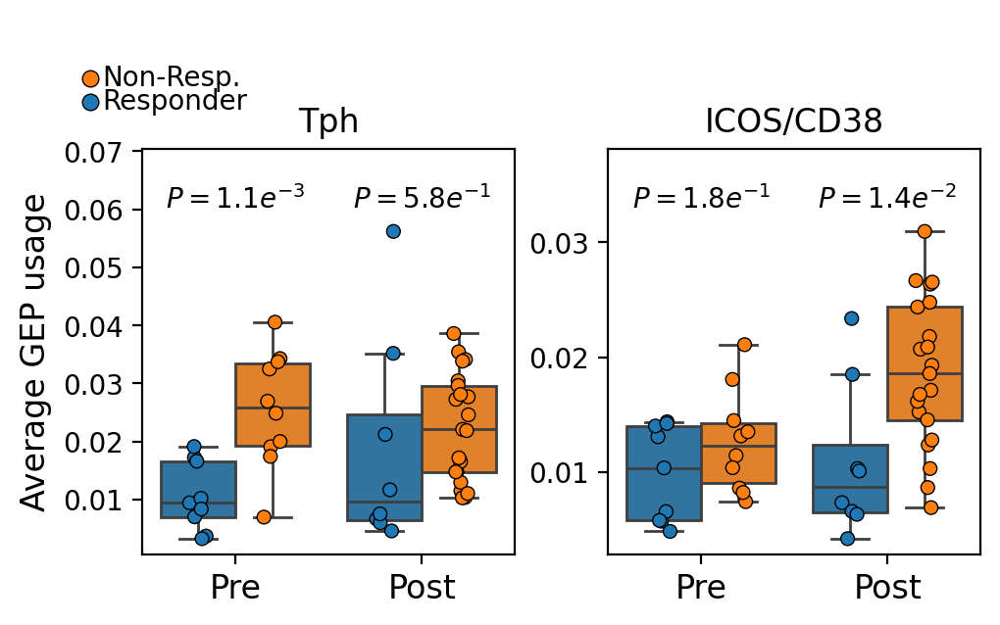

In [632]:
variables = ['Tph', 'ICOS/CD38']

(fig,axes) = plt.subplots(1,2, figsize=(5,3), dpi=200, gridspec_kw={'top':.8, 'right':.98, 'wspace':.25})

for i, val in enumerate(variables):
    sns.stripplot(x='timepoint', y=val, hue='response', data=allcell_act_pct_merged, ax=axes[i], dodge=True, legend=False,
             order=['Pre', 'Post'], hue_order=['Responder', 'Non-responder'], edgecolor='0', linewidth=.5)
        
    sns.boxplot(x='timepoint', y=val, hue='response', data=allcell_act_pct_merged, ax=axes[i], dodge=True, legend=False,
             order=['Pre', 'Post'], hue_order=['Responder', 'Non-responder'], fliersize=0)
    axes[i].set_title(variables[i])
    axes[i].set_ylabel('')
    axes[i].set_xlabel('')
    ylim = axes[i].get_ylim()
    axes[i].set_ylim([ylim[0], ylim[0]+(ylim[1]-ylim[0])*1.2])
    yval = ylim[0]+(ylim[1]-ylim[0])*1.05
    P1 =  'P=%.1e' % ttest_res.loc[('Pre', val), 'P']
    P2 = 'P=%.1e' % ttest_res.loc[('Post', val), 'P']
    P1 = '$' + P1.replace('e-0', 'e^{-') + '}$'
    P2 = '$' + P2.replace('e-0', 'e^{-') + '}$'
    axes[i].text(0, yval, P1, ha='center', va='center', fontsize=10)
    axes[i].text(1, yval, P2, ha='center', va='center', fontsize=10)

    print(ylim)

axes[0].set_ylabel('Average GEP usage', fontsize=12)
axes[0].set_xticklabels(['Pre', 'Post'], fontsize=12)
axes[1].set_xticklabels(['Pre', 'Post'], fontsize=12)

legend_ax = fig.add_axes([0.06, 0.82, 0.12, 0.2], frameon=False)
legend_ax.scatter([.1], [.3], color='tab:blue', edgecolor='0', linewidth=.5)
legend_ax.scatter([.1], [.5], color='tab:orange', edgecolor='0', linewidth=.5)
legend_ax.text(.2, .3, 'Responder', ha='left', va='center', fontsize=10)
legend_ax.text(.2, .5, 'Non-Resp.', ha='left', va='center', fontsize=10)
legend_ax.set_xlim([0, 1])
legend_ax.set_ylim([0, 1])
legend_ax.set_xticks([])
legend_ax.set_yticks([])

#plt.savefig('CD4_Score_assoc_boxplot.png')
#plt.savefig('CD4_Score_assoc_boxplot.pdf')

(0.0005218356614932417, 0.02833133258391172)
(0.0028499865904450415, 0.03228979017585516)


/tmp/ipykernel_216236/623981875.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(['Pre', 'Post'], fontsize=12)
/tmp/ipykernel_216236/623981875.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(['Pre', 'Post'], fontsize=12)


[]

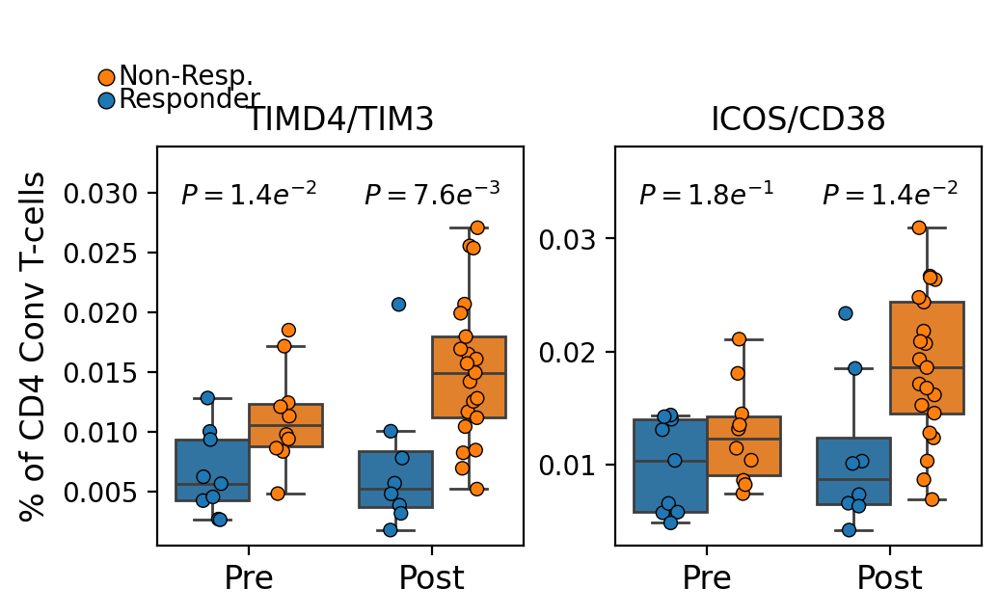

In [633]:
variables = ['TIMD4/TIM3', 'ICOS/CD38']

(fig,axes) = plt.subplots(1,2, figsize=(5,3), dpi=200, gridspec_kw={'top':.8, 'right':.98, 'wspace':.25})

for i, val in enumerate(variables):
    sns.stripplot(x='timepoint', y=val, hue='response', data=allcell_act_pct_merged, ax=axes[i], dodge=True, legend=False,
             order=['Pre', 'Post'], hue_order=['Responder', 'Non-responder'], edgecolor='0', linewidth=.5)
        
    sns.boxplot(x='timepoint', y=val, hue='response', data=allcell_act_pct_merged, ax=axes[i], dodge=True, legend=False,
             order=['Pre', 'Post'], hue_order=['Responder', 'Non-responder'], fliersize=0)
    axes[i].set_title(variables[i])
    axes[i].set_ylabel('')
    axes[i].set_xlabel('')
    ylim = axes[i].get_ylim()
    axes[i].set_ylim([ylim[0], ylim[0]+(ylim[1]-ylim[0])*1.2])
    yval = ylim[0]+(ylim[1]-ylim[0])*1.05
    P1 =  'P=%.1e' % ttest_res.loc[('Pre', val), 'P']
    P2 = 'P=%.1e' % ttest_res.loc[('Post', val), 'P']
    P1 = '$' + P1.replace('e-0', 'e^{-') + '}$'
    P2 = '$' + P2.replace('e-0', 'e^{-') + '}$'
    axes[i].text(0, yval, P1, ha='center', va='center', fontsize=10)
    axes[i].text(1, yval, P2, ha='center', va='center', fontsize=10)

    print(ylim)

axes[0].set_ylabel('% of CD4 Conv T-cells', fontsize=12)
axes[0].set_xticklabels(['Pre', 'Post'], fontsize=12)
axes[1].set_xticklabels(['Pre', 'Post'], fontsize=12)

legend_ax = fig.add_axes([0.06, 0.82, 0.12, 0.2], frameon=False)
legend_ax.scatter([.1], [.3], color='tab:blue', edgecolor='0', linewidth=.5)
legend_ax.scatter([.1], [.5], color='tab:orange', edgecolor='0', linewidth=.5)
legend_ax.text(.2, .3, 'Responder', ha='left', va='center', fontsize=10)
legend_ax.text(.2, .5, 'Non-Resp.', ha='left', va='center', fontsize=10)
legend_ax.set_xlim([0, 1])
legend_ax.set_ylim([0, 1])
legend_ax.set_xticks([])
legend_ax.set_yticks([])

#plt.savefig('CD4_Score_assoc_boxplot.png')
#plt.savefig('CD4_Score_assoc_boxplot.pdf')

In [634]:
gep_info = read_dataset_log('cGEP_Name')
gep_info.index = gep_info['cGep_Name']
cgep_params = read_dataset_log('cGEP Paths').iloc[0,:]
gene_scores = pd.read_csv(cgep_params['scores_spectra'], index_col = 0, sep = '\t')
overlap = list(gene_scores.columns.intersection(adata_tpm.var.index))
gene_scores = gene_scores.loc[:, overlap]
rename_map = dict(zip(gep_info['cGep_Name'], gep_info['Short_Name']))
gene_scores = gene_scores.rename(index=rename_map)
gene_scores.head()

,ABCG1,C11orf70,RAB26,HGS,REG3A,SLC13A4,PGAM1,MIF4GD,OLA1,MLLT10,...,FAM209B,C4orf19,TBX3,MAGI3,TMCC3,LGALS14,CNOT1,LTA,LARP1,TMEM176A
CellCycle-G2M,-0.000057,0.000005,-0.000011,-0.000003,0.000008,0.000009,-0.000185,0.000029,-0.000065,-0.000016,...,0.000014,1.321860e-05,0.000004,0.000111,0.000009,0.000042,0.000060,-0.000047,0.000004,0.000013
Translation,-0.000870,NaN,-0.000027,-0.001012,-0.000128,-0.000040,-0.001060,-0.000008,0.000122,-0.000911,...,-0.000102,3.999810e-07,-0.000078,-0.000373,-0.000228,0.000313,-0.001340,-0.000410,-0.000855,-0.000220
HLA,0.000152,0.000026,0.000080,-0.000124,-0.000160,-0.000042,0.000104,0.000288,0.000523,-0.000069,...,-0.000030,-1.099922e-04,0.000090,-0.000214,-0.000708,-0.000048,-0.000082,-0.000140,-0.000085,0.000146
ISG,-0.000130,-0.000058,-0.000020,0.000124,-0.000085,-0.000005,0.000618,-0.000091,-0.000148,0.000130,...,-0.000037,-3.926008e-05,-0.000014,0.000115,-0.000092,-0.000050,0.000030,0.001110,-0.000045,-0.000039
Mito,0.000570,NaN,0.000155,0.000812,-0.001028,0.000210,-0.002809,-0.001470,-0.001741,0.000177,...,0.000222,-4.286240e-05,-0.000063,0.000332,0.000004,-0.000353,0.000027,-0.000927,0.000588,-0.000002


# Look in CD8 rather than CD4

In [646]:
variables = usage.columns
ind = adata_tpm.obs['Multinomial_Label_Tissue'].isin(['CD8_Naive', 'CD8_CM', 'CD8_EM', 'CD8_TEMRA'])
allcell_usage = usage.loc[ind, :].groupby(adata_tpm.obs.loc[ind, 'sample']).mean()
allcell_act_count = adata_tpm.obs.loc[ind,:].groupby('sample').count()
sample_data_withcount = sample_data.copy()
sample_data_withcount['Count'] = allcell_act_count.loc[sample_data_withcount.index, 'cell_label'].values
allcell_act_pct_merged = pd.merge(left=sample_data_withcount, right=allcell_usage, left_index=True, right_index=True, how='left')

ttest_res = []

for r, rdat in allcell_act_pct_merged.groupby('timepoint'):
    for v in variables:
        T,P = ttest_ind(rdat.loc[rdat['response']=='Non-responder', v], rdat.loc[rdat['response']=='Responder', v],
                        equal_var=False)
        #T,P = ranksums(rdat.loc[rdat['response']=='Non-responder', v], rdat.loc[rdat['response']=='Responder', v])
        meandiff = rdat.loc[rdat['response']=='Non-responder', v].mean() - rdat.loc[rdat['response']=='Responder', v].mean()
        ttest_res.append([r, v, T, P, meandiff])

ttest_res = pd.DataFrame(ttest_res, columns=['timepoint', 'response', 'T', 'P', 'Delta'])
ttest_res.index = ttest_res['response']
ttest_res['Q'] = np.nan
ind = ttest_res['timepoint'] == 'Pre'
_, ttest_res.loc[ind, 'Q'] =  fdrcorrection(ttest_res.loc[ind, 'P'])
_, ttest_res.loc[~ind, 'Q'] =  fdrcorrection(ttest_res.loc[~ind, 'P'])

ttest_res['logP'] = ttest_res['P'].apply(np.log10)*-1
ttest_res['logQ'] = ttest_res['Q'].apply(np.log10)*-1

ttest_res['signed_logP'] = ttest_res['T'].apply(np.sign)*ttest_res['logP']
ttest_res.index = pd.MultiIndex.from_arrays([np.array(ttest_res['timepoint']), np.array(ttest_res.index)])


In [649]:
ttest_res.loc[ttest_res['timepoint']=='Pre', :].sort_values(by='P')

timepoint             response         T         P  \
Pre CellCycle-Late-S          Pre     CellCycle-Late-S  3.703830  0.003847   
    CellCycle-G2M             Pre        CellCycle-G2M  3.467510  0.003870   
    OX40/EBI3                 Pre            OX40/EBI3  2.747280  0.016082   
    TEMRA                     Pre                TEMRA  2.612632  0.018204   
    TIMD4/TIM3                Pre           TIMD4/TIM3  2.577501  0.019689   
    CD4-Naive                 Pre            CD4-Naive -2.690772  0.025529   
    Tph                       Pre                  Tph  2.368455  0.032382   
    CellCycle-S               Pre          CellCycle-S  2.350813  0.037227   
    Exhaustion                Pre           Exhaustion  2.257588  0.037419   
    Doublet-Bcell             Pre        Doublet-Bcell -2.230360  0.039850   
    CD8-Naive                 Pre            CD8-Naive -2.222193  0.055157   
    HLA                       Pre                  HLA  1.979941  0.064191   
    ICOS/CD38                 Pre            ICOS/CD38  1.821421  0.086190   
    ISG                       Pre                  ISG  1.863856  0.087711   
    Th1-Like                  Pre             Th1-Like -1.588867  0.134797   
    Treg                      Pre                 Treg  1.497307  0.152836   
    IEG                       Pre                  IEG -1.545666  0.157118   
    Translation               Pre          Translation -1.410473  0.188423   
    SOX4/TOX2                 Pre            SOX4/TOX2 -1.395796  0.191287   
    CD172a/MERTK              Pre         CD172a/MERTK -1.336410  0.202995   
    NME1/FABP5                Pre           NME1/FABP5  1.292520  0.214617   
    Metallothionein           Pre      Metallothionein  1.257258  0.225809   
    Doublet-Plasmablast       Pre  Doublet-Plasmablast -1.174610  0.256941   
    Doublet-Myeloid           Pre      Doublet-Myeloid -1.203689  0.257803   
    IL10/IL19                 Pre            IL10/IL19 -1.117275  0.285108   
    Th17-Resting              Pre         Th17-Resting -1.035024  0.322665   
    Tfh-1                     Pre                Tfh-1 -1.009421  0.327633   
    Tfh-2                     Pre                Tfh-2  1.004651  0.329437   
    Poor-Quality              Pre         Poor-Quality -0.975403  0.344550   
    Doublet-Platelet          Pre     Doublet-Platelet  0.896186  0.385551   
    CD8-EM                    Pre               CD8-EM -0.892977  0.387341   
    Th2-Resting               Pre          Th2-Resting -0.841842  0.418791   
    MAIT                      Pre                 MAIT -0.798287  0.443018   
    Doublet-RBC               Pre          Doublet-RBC -0.773311  0.452673   
    Doublet-Fibroblast        Pre   Doublet-Fibroblast -0.757419  0.459864   
    CTLA4/CD38                Pre           CTLA4/CD38  0.661927  0.517114   
    Th22                      Pre                 Th22 -0.653619  0.527160   
    gdT                       Pre                  gdT  0.600546  0.556067   
    RGCC/MYADM                Pre           RGCC/MYADM -0.478217  0.639834   
    Th2-Activated             Pre        Th2-Activated -0.427761  0.675740   
    Multi-Cytokine            Pre       Multi-Cytokine -0.375621  0.713138   
    CD4-CM                    Pre               CD4-CM  0.344475  0.734730   
    IEG3                      Pre                 IEG3 -0.249139  0.806438   
    CD40LG/TXNIP              Pre         CD40LG/TXNIP  0.213129  0.833936   
    Cytotoxic                 Pre            Cytotoxic  0.181807  0.858259   
    Mito                      Pre                 Mito  0.149308  0.883069   
    Heatshock                 Pre            Heatshock  0.113989  0.910582   
    CD8-Trm                   Pre              CD8-Trm  0.096460  0.924336   
    BCL2/FAM13A               Pre          BCL2/FAM13A  0.088778  0.930306   
    Cytoskeleton              Pre         Cytoskeleton  0.079341  0.937703   
    Th17-Activated            Pre       Th17-A

In [650]:
variables = usage.columns
ind = adata_tpm.obs['Multinomial_Label_Tissue'].isin(['Treg'])
allcell_usage = usage.loc[ind, :].groupby(adata_tpm.obs.loc[ind, 'sample']).mean()
allcell_act_count = adata_tpm.obs.loc[ind,:].groupby('sample').count()
sample_data_withcount = sample_data.copy()
sample_data_withcount['Count'] = allcell_act_count.loc[sample_data_withcount.index, 'cell_label'].values
allcell_act_pct_merged = pd.merge(left=sample_data_withcount, right=allcell_usage, left_index=True, right_index=True, how='left')

ttest_res = []

for r, rdat in allcell_act_pct_merged.groupby('timepoint'):
    for v in variables:
        T,P = ttest_ind(rdat.loc[rdat['response']=='Non-responder', v], rdat.loc[rdat['response']=='Responder', v],
                        equal_var=False)
        #T,P = ranksums(rdat.loc[rdat['response']=='Non-responder', v], rdat.loc[rdat['response']=='Responder', v])
        meandiff = rdat.loc[rdat['response']=='Non-responder', v].mean() - rdat.loc[rdat['response']=='Responder', v].mean()
        ttest_res.append([r, v, T, P, meandiff])

ttest_res = pd.DataFrame(ttest_res, columns=['timepoint', 'response', 'T', 'P', 'Delta'])
ttest_res.index = ttest_res['response']
ttest_res['Q'] = np.nan
ind = ttest_res['timepoint'] == 'Pre'
_, ttest_res.loc[ind, 'Q'] =  fdrcorrection(ttest_res.loc[ind, 'P'])
_, ttest_res.loc[~ind, 'Q'] =  fdrcorrection(ttest_res.loc[~ind, 'P'])

ttest_res['logP'] = ttest_res['P'].apply(np.log10)*-1
ttest_res['logQ'] = ttest_res['Q'].apply(np.log10)*-1

ttest_res['signed_logP'] = ttest_res['T'].apply(np.sign)*ttest_res['logP']
ttest_res.index = pd.MultiIndex.from_arrays([np.array(ttest_res['timepoint']), np.array(ttest_res.index)])

In [651]:
ttest_res.loc[ttest_res['timepoint']=='Pre', :].sort_values(by='P')

timepoint             response         T         P  \
Pre Treg                      Pre                 Treg -2.846388  0.011426   
    TIMD4/TIM3                Pre           TIMD4/TIM3  2.825571  0.011954   
    CD4-Naive                 Pre            CD4-Naive -2.896219  0.015553   
    Cytotoxic                 Pre            Cytotoxic  2.721191  0.015685   
    CD4-CM                    Pre               CD4-CM -2.780423  0.018010   
    TEMRA                     Pre                TEMRA  2.574649  0.021175   
    CellCycle-S               Pre          CellCycle-S  2.512369  0.024259   
    CD8-Trm                   Pre              CD8-Trm  2.493884  0.025552   
    HLA                       Pre                  HLA  2.410813  0.028750   
    NME1/FABP5                Pre           NME1/FABP5  2.407937  0.030083   
    CTLA4/CD38                Pre           CTLA4/CD38 -2.306575  0.037889   
    CellCycle-Late-S          Pre     CellCycle-Late-S  1.972642  0.067959   
    gdT                       Pre                  gdT  1.946412  0.072164   
    IEG                       Pre                  IEG -1.971887  0.082491   
    Exhaustion                Pre           Exhaustion  1.865617  0.083259   
    Doublet-Fibroblast        Pre   Doublet-Fibroblast -1.797554  0.094725   
    Tfh-2                     Pre                Tfh-2 -1.853629  0.095308   
    Multi-Cytokine            Pre       Multi-Cytokine  1.592175  0.131968   
    CellCycle-G2M             Pre        CellCycle-G2M  1.472321  0.159641   
    Tfh-1                     Pre                Tfh-1 -1.520387  0.162570   
    OX40/EBI3                 Pre            OX40/EBI3  1.339574  0.200779   
    RGCC/MYADM                Pre           RGCC/MYADM  1.257030  0.227569   
    Doublet-Plasmablast       Pre  Doublet-Plasmablast -1.246047  0.230604   
    CD8-Naive                 Pre            CD8-Naive  1.163426  0.261034   
    CD8-EM                    Pre               CD8-EM  1.146859  0.267336   
    Tph                       Pre                  Tph  1.122169  0.280463   
    BCL2/FAM13A               Pre          BCL2/FAM13A -0.892076  0.386144   
    Doublet-RBC               Pre          Doublet-RBC -0.893822  0.392673   
    Metallothionein           Pre      Metallothionein  0.865161  0.400919   
    IL10/IL19                 Pre            IL10/IL19 -0.807052  0.431665   
    ISG                       Pre                  ISG  0.798546  0.436203   
    CD172a/MERTK              Pre         CD172a/MERTK -0.724693  0.480797   
    ICOS/CD38                 Pre            ICOS/CD38  0.635448  0.535008   
    CD40LG/TXNIP              Pre         CD40LG/TXNIP -0.603131  0.554428   
    Th1-Like                  Pre             Th1-Like  0.539861  0.596516   
    Th17-Resting              Pre         Th17-Resting -0.537930  0.600515   
    Th2-Resting               Pre          Th2-Resting  0.489800  0.630663   
    Poor-Quality              Pre         Poor-Quality -0.486831  0.634462   
    SOX4/TOX2                 Pre            SOX4/TOX2  0.443291  0.663147   
    Th17-Activated            Pre       Th17-Activated  0.392425  0.700043   
    MAIT                      Pre                 MAIT  0.362052  0.722405   
    IEG2                      Pre                 IEG2 -0.316323  0.755979   
    Heatshock                 Pre            Heatshock  0.272155  0.788985   
    Translation               Pre          Translation -0.271742  0.789166   
    Doublet-Platelet          Pre     Doublet-Platelet  0.171690  0.865787   
    Mito                      Pre                 Mito -0.152667  0.880460   
    Doublet-Bcell             Pre        Doublet-Bcell -0.114086  0.910517   
    Th2-Activated             Pre        Th2-Activated  0.101972  0.919998   
    Th22                      Pre                 Th22 -0.061962  0.951716   
    Doublet-Myeloid           Pre      Doublet-Myeloid  0.031660  0.975157   
    IEG3                      Pre             

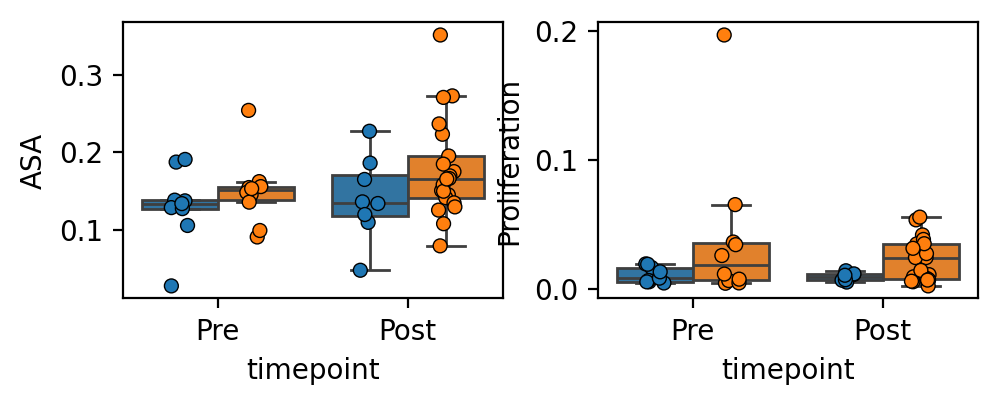

In [659]:
variables = ['ASA', 'Proliferation']
labels = ['ASA', 'Cell cycle']
ind = adata_tpm.obs['Multinomial_Label'].isin(['Treg'])

allcell_score_pct = adata_tpm.obs.loc[ind, :].groupby('sample')[variables].mean()
allcell_score_count = adata_tpm.obs.loc[ind, :].groupby('sample').count()
allcell_score_pct['Count'] = allcell_score_count['cell_label'].values
allcell_score_pct_merged = pd.merge(left=sample_data, right=allcell_score_pct, left_index=True, right_index=True, how='left')

ttest_res = []
for r, rdat in allcell_score_pct_merged.groupby('timepoint'):
    for v in variables:
        #T,P = ttest_ind(rdat.loc[rdat['response']=='Non-responder', v], rdat.loc[rdat['response']=='Responder', v],
        #                equal_var=False)
        T,P = ranksums(rdat.loc[rdat['response']=='Non-responder', v], rdat.loc[rdat['response']=='Responder', v])
        ttest_res.append([r, v, T, P])

ttest_res = pd.DataFrame(ttest_res, columns=['timepoint', 'response', 'T', 'P'])
ttest_res.index = pd.MultiIndex.from_arrays([ttest_res['timepoint'].tolist(), ttest_res['response'].tolist()])

(fig,axes) = plt.subplots(1,2, figsize=(5,2), dpi=200, gridspec_kw={'top':.8, 'right':.98, 'wspace':.25})

for i, val in enumerate(variables):
    sns.stripplot(x='timepoint', y=val, hue='response', data=allcell_score_pct_merged, ax=axes[i], dodge=True, legend=False,
             order=['Pre', 'Post'], hue_order=['Responder', 'Non-responder'], edgecolor='0', linewidth=.5)
        
    sns.boxplot(x='timepoint', y=val, hue='response', data=allcell_score_pct_merged, ax=axes[i], dodge=True, legend=False,
             order=['Pre', 'Post'], hue_order=['Responder', 'Non-responder'], fliersize=0)
    